In [1]:
### Import libraries and set plot style

import numpy as np
from scipy.optimize import curve_fit
from cycler import cycler
import matplotlib.pyplot as plt
import matplotlib.transforms as trans
colors = ['#202020', '#d62728', '#1f77b4', '#2ca02c', '#ff7f0e', '#9467bd', '#bcbd22', '#e377c2', '#17becf', '#1f5a0a', '#8c564b', '#7f7f7f']
         ## black    red        blue       green      orange     violet     yellow     pink       lightblue  darkgreen  dirty-red  grey
plt.rcParams.update({'font.size': 15.5,
                     'axes.titlepad': 25,
                     'axes.labelpad': 20,
                     'axes.labelsize': 20,
                     'xtick.labelsize' : 15.5,
                     'ytick.labelsize' : 15.5,
                     'axes.prop_cycle': cycler('color', colors),
                     #'axes.grid': True,
                     'axes.linewidth': 0.5,
                     'lines.linewidth': 1.5,
                     'lines.markersize': 5,
                     'scatter.marker': 'o',
                     #'errorbar.capsize': 2,
                     'figure.dpi': 100.0,
                     'figure.figsize': [8, 5],
                     'xtick.top' : True,
                     'ytick.right' : True,
                     'xtick.direction' : 'out',
                     'ytick.direction' : 'out',
                     'xtick.major.size': 8,
                     'xtick.minor.size': 3,
                     'ytick.major.size': 8,
                     'ytick.minor.size': 3,
                     'xtick.major.width': 1,
                     'xtick.minor.width': 0.5,
                     'ytick.major.width': 1,
                     'ytick.minor.width': 0.5})

In [2]:
### Import raw data and define measurement specifications

SAMPLE = "43 wt.% PEI"
SAMPLE_SHORT = SAMPLE[:2]
# specify what temperatures where used and in what order
TEMPS = [70, 50, 30]
GASES = ["N$_2$", "CO$_2$"]
# specify which gas is used in which run: N_2 -> 0, CO_2 -> 1 (specified in "GASES")
# rows: measurements with fixed temperature, same order as "TEMPS" above
# columns: runs
# (compatability) the same gas may be used twice in a row
S = [[0, 1, 0, 1],
     [0, 1, 0, 1],
     [0, 1, 0, 1, 0]]
# ignore these runs: unusable / redundant data
id_out = ["30-2"]
# specify the starting times of the runs
# sometimes the measurement doesn't start at t=0: set GASCHANGE[0] to cut out degassing phase, otherwise set 0 as first value
# After that, put time in seconds for every time the gas is changed (or new ballon with same gas)
GASCHANGE = [[5.0588e+02, 5174.770, 9492.830, 14695.640],
             [0, 5.9944e+03, 1.1229e+04, 1.8612e+04],
             [0, 709+8460, 6469+8460, 6867+8460, 12698+8460]]
DT = [[0], [0, 18900, 19080], [0, 8460]]
# columns (indices) of frequency, epsilon' (er), epsilon'' (ei) and time in ascii file
f_col, er_col, ei_col, t_col = 0, 2, 3, -1

# specify folder and filenames of raw data, files in same order as "TEMPS" above
folder = "raw data PEI43/"
results_folder = "results43"
FILES = [["12-18_M2_TBD039_PEI43_70C_NCNC.TXT"],
         ["12-19_M3_TBD039_PEI43_50C_NCN.TXT", "12-19_M4_TBD039_PEI43_50C_C_zwischensweep.TXT", "12-19_M5_TBD039_PEI43_50C_C.TXT"],
         ["12-20_M3_TBD039_PEI43_30C_N-20min.TXT", "12-20_M4_TBD039_PEI43_30C_20min-nCCN.TXT"]]
DATA = [[],[],[]]

for m, files in enumerate(FILES) :
    for i, file in enumerate(files) :
        data_ = np.genfromtxt(folder+file, delimiter='\t', skip_header=4)
        data_[:,-1] = (data_[:,-1] + DT[m][i])
        if not i :
            after = data_[:,-1] >= GASCHANGE[m][0]
            data = data_[after]
        else :
            data = np.append(data[:], data_[:], axis=0)

     # add final time to GASCHANGE, needed in main and make time unit hours
    GASCHANGE[m].append(data[-1,-1])
    GASCHANGE[m] = np.array(GASCHANGE[m]) / 60.
    data[:,-1] = data[:,-1] / 60.
    DATA[m] = data

In [3]:
### Data processing

def gradient_matrix(y, x) :
    # y is a 2D array of shape (m,n) and x a vector of shape m
    # froms forward gradient of every column of y along x
    # accounts for in-between nans in y
    # returns two matrices of shape (m-1,n)
    # one for dy[:,k]/dx and one for the corresponding x values x[:,k] that depend on where nans were found

    m, n = y.shape
    y_der = np.full((m - 1, n), np.nan)
    x_der = np.full((m - 1, n), np.nan)

    for k in range(n):
        notnan = ~np.isnan(y[:, k])
        y_k = y[notnan, k]
        x_k = x[notnan]

        if len(y_k) >= 2:
            dy = y_k[1:] - y_k[:-1]
            dx = x_k[1:] - x_k[:-1]
            valid = dx != 0

            y_der_k = dy[valid] / dx[valid]
            x_der_k = 0.5 * (x_k[1:][valid] + x_k[:-1][valid])

            m_k = len(y_der_k)
            y_der[:m_k, k] = y_der_k
            x_der[:m_k, k] = x_der_k

    return y_der, x_der
    

f_out = [5e5] # ignore data of these frequencies
def extract_interpolate_and_derivative(data, num_points=0):
    """
    Extracts lists x_k for every measured data x at a fixed frequency k
    Creates a universal test set of time points
    Interpolates every fixed-frequency data set for those time points
    Computes derivative epsilon'_der along frequency axis
    """
    
    # Extract unique F_k values
    # ignore frequencies specified in f_out
    unique_f = np.unique(data[:, f_col])
    mask = ~np.isin(unique_f, f_out)
    unique_f = unique_f[mask]
    lnw = np.log(2*np.pi*unique_f)  # Compute ln(omega)
    
    # find time boundaries of data
    # and generate `num_points` equidistant t_i values
    initial_test_t, final_test_t = np.min(data[:,t_col])-0.2, np.max(data[:,t_col])-0.2
    if not num_points:
        num_points = int((final_test_t - initial_test_t) *2)
    t_test_set = np.linspace(initial_test_t, final_test_t, num_points)

    # er: real part of epsilon; ei: imag. part; t: corresponding measured time
    er_int, ei_int = [], []
    # Group er_k and ei_k based on unique F_k
    # unify to test times by interpolation
    for f_k in unique_f:
        mask = data[:, f_col] == f_k
        t_k = data[mask][:, t_col]
        er_k = data[mask][:, er_col]
        ei_k = data[mask][:, ei_col]

        er_int_k = np.interp(t_test_set, t_k, er_k, left=np.nan, right=np.nan)
        ei_int_k = np.interp(t_test_set, t_k, ei_k, left=np.nan, right=np.nan)
        
        er_int.append(er_int_k)
        ei_int.append(ei_int_k)

    er_int = np.array(er_int)
    ei_int = np.array(ei_int)


    # Compute gradient of er_k along ln(omega)
    er_der, lnw_der =  gradient_matrix(er_int, lnw)
    er_der = -np.pi/2 * er_der
    #er_der =  -np.pi/2 * np.gradient(er_int, lnw, axis=0)

    return unique_f, lnw_der.T, er_der.T, ei_int.T, t_test_set


def score(popt, pcov, y_data, f_data):
    """
    Computes a fit quality score based on R^2, reduced chi-square, AIC, BIC, and parameter covariances.

    Parameters:
        popt (np.ndarray): Optimized fit parameters from curve_fit.
        pcov (np.ndarray): Covariance matrix of fit parameters from curve_fit.
        y_data (np.ndarray): Measured values.
        f_data (np.ndarray): Fitted values.

    Returns:
        float: Fit quality score (higher is better).
    """
    N = len(y_data)  # Number of data points
    p = len(popt)    # Number of fit parameters
    dof = max(N - p, 1)  # Degrees of freedom (avoid division by zero)

    # Residuals
    residuals = y_data - f_data
    RSS = np.sum(residuals**2)  # Residual sum of squares
    TSS = np.sum((y_data - np.mean(y_data))**2)  # Total sum of squares

    # Coefficient of determination (R^2)
    r_squared = 1 - (RSS / TSS) if TSS > 0 else 0

    # Reduced chi-square (if assuming equal variance in y)
    chi_sq_red = RSS / dof

    # Akaike Information Criterion (AIC)
    aic = 2 * p + N * np.log(RSS / N)

    # Bayesian Information Criterion (BIC)
    bic = p * np.log(N) + N * np.log(RSS / N)

    # Covariance penalty: Large covariance values indicate poorly constrained parameters
    cov_trace = np.trace(pcov) if pcov is not None else 0
    cov_score = np.exp(-np.abs(cov_trace))  # Penalizes large uncertainties

    # Normalize scores
    chi_sq_score = np.exp(-abs(chi_sq_red - 1.0))  # Peaks at chi_sq_red ≈ 1
    aic_bic_score = np.exp(-0.1 * (aic + bic) / 2)  # Penalizes high values

    # Weighted sum (adjust weights if needed)
    score = (0.5 * r_squared) + (0.3 * chi_sq_score) + (0.1 * aic_bic_score) + (0.1 * cov_score)

    return score


In [4]:
### Specify fit function, boundaries and starting initial values; here: CC + CC + CC
# don't forget to change the individual terms in the plot function if fitfunction is edited

# base Cole/Cole function for imaginary part
def CC_I(w, de, a, wp) :
    den = 1 + (1j * w/wp)**a
    return -np.imag(de/den)

#base Cole/Cole function for derivative of real part
def CC_R(w, de, a, wp) :
    A = a*np.pi/2
    W = (w/wp)**a
    return np.pi/2 * a*de*W * np.cos(A - 2* np.arctan(np.sin(A)/(1/W+np.cos(A))) ) / (1 + 2*W*np.cos(A) + W**2)

p_labels = ["$\\Delta\\epsilon$", "$\\alpha$", "$\\omega_p$ [rad/s]", 
            "$\\Delta\\epsilon_2$", "$\\alpha_2$", "$\\omega_{p2}$ [rad/s]"]

# starting initial guess for every run
p0_start = np.array([
    # 70
    [2, 0.7, 5, 0.1, 0.5, 4e5],
    [2, 0.7, 0.1, 0.1, 0.5, 4e5],
    [2, 0.7, 5, 0.1, 0.5, 4e5],
    [2, 0.7, 0.1, 0.1, 0.5, 4e5],
    # 50
    [2, 0.7, 0.01, 0.1, 0.5, 4e5],
    [2, 0.7, 0.1, 0.1, 0.5, 4e5],
    [2, 0.7, 0.01, 0.1, 0.5, 4e5],
    [2, 0.7, 0.1, 0.1, 0.5, 4e5],
    # 30
    [2, 0.7, 0.1, 0.1, 0.5, 4e5],
    [2, 0.7, 0.1, 0.1, 0.5, 4e5],
    [2, 0.7, 0.1, 0.1, 0.5, 4e5],
    [2, 0.7, 0.1, 0.1, 0.5, 4e5]])

# boundaries
i_ = np.inf
wi1, wf1 = 0.0, 1.0
wi2, wf2 = 1.0, 4e4
wi3, wf3 = 4e4, 1e7
bounds = ([0.0, 0.0, wi1, 0.0, 0.0, wi3], [i_, 1.0, wf2, i_, 1.0, wf3])

# functions
def der_real (lnw, de, a, wp, de_2, a_2, wp_2) :
    w = np.exp(lnw)
    return np.log( CC_R(w, de, a, wp) + CC_R(w, de_2, a_2, wp_2) )

def imag (lnw, de, a, wp, de_2, a_2, wp_2) :
    w = np.exp(lnw)
    return np.log ( CC_I(w, de, a, wp) + CC_I(w, de_2, a_2, wp_2) )

def combined_fit(x_all, de, a, wp, de_2, a_2, wp_2):
    x, mask = x_all  # Unpack the concatenated x values and mask
    y_fit = np.where(mask == 0,   # Apply f1 where mask=0, f2 where mask=1
            der_real(x, de, a, wp, de_2, a_2, wp_2), 
            imag(x, de, a, wp, de_2, a_2, wp_2))
    return y_fit

# plot single terms
def plot_parts(ax1, w_, *popt) :
    # calculate the individual terms (set right parameter positions and functions)
    x1_ = CC_R(w_, *popt[:3])
    x2_ = CC_R(w_, *popt[3:])
    # plot the terms
    ax1.plot(w_, x1_, linestyle=':', color='black')
    ax1.plot(w_, x2_, linestyle=':', color='blue')
    # label with a number
    ax1.text(max(1,popt[2]), 1, "(i)", color='black')
    ax1.text(popt[5], max(popt[3]/16, 1e-2), "(iii)", color='blue')


In [5]:
### fitting and plotting procedure

# indices of fit parameter omega, used in "fixorder" to make sure the three terms go from low to high frequency
peak_indices = [2, 5, 8]
def fixorder(p) :
    # fix order of parameters such that peaks are in ascending order
    # old function that might be useful, needs some work
    peaks = p[peak_indices]
    bigger_than_next = peaks[:-1] > peaks[1:]
    while np.any(bigger_than_next) :
        for i, cell in enumerate(bigger_than_next) :
            if cell :
                temp_ = p[i*3:i*3+3]
                p[i*3:i*3+3] = p[i*3+3:i*3+6]
                p[i*3+3:i*3+6] = temp_

                peaks = p[peak_indices]
                bigger_than_next = peaks[:-1] > peaks[1:]
                break
    return p
    

lnw_area = np.linspace(np.log(10), np.log(1e9), 1000)

def fit(x1, y1, x2, y2, p0, run_num) :
    # if the fit didn't converge or receives a bad "score" (see above), 
    # it will retry with the starting initial guess for the current run
    # starting guesses are specified above

    fitf = combined_fit

    # Combine x and y values into a single array (respectively) and create a mask
    x_all = np.concatenate([x1, x2])  # Flatten xdata
    y_all = np.concatenate([y1, y2])
    mask = np.concatenate([np.zeros_like(x1), np.ones_like(x2)])
    

    try :
        popt, pcov = curve_fit(fitf, (x_all, mask), y_all, p0=p0, bounds=bounds, nan_policy='omit')
        fitscore = score(popt, pcov, y_all, fitf((x_all, mask), *popt))

        if fitscore < 50000 :
            try :
                popt2, pcov2 = curve_fit(fitf, (x_all, mask), y_all, p0=p0_start[run_num], bounds=bounds, nan_policy='omit')
                fitscore2 = score(popt2, pcov2, y_all, fitf((x_all, mask), *popt2))
            except :
                fitscore2 = 0

            if fitscore < fitscore2 :
                popt = popt2
                fitscore = fitscore2
                print("FALLBACK 1: ", np.round(fitscore2,0))

        y = np.exp(der_real(lnw_area, *popt))
        a = np.trapezoid(y, lnw_area)
        return popt, a, np.round(fitscore,0)

    except  :
        try :
            popt, pcov = curve_fit(fitf, (x_all, mask), y_all, p0=p0_start[run_num], bounds=bounds, nan_policy='omit')
            fitscore3 = score(popt, pcov, y_all, fitf((x_all, mask), *popt))
            print("FALLBACK 2: ", np.round(fitscore3,0))

            y = np.exp(der_real(lnw_area, *popt))
            a = np.trapezoid(y, lnw_area)
            return popt, a, np.round(fitscore3,0)

        except Exception as err :
            print([float(pi) for pi in np.round(p0_start[run_num],4)])
            print(j, i, str(type(err))[8:-2], ": ", err)
            
    return p0, 0, 0


def round_sig(x, n):
    # round to n significant digits
    if x == 0:
        return 0
    return float(round(x, n - int(__import__('math').floor(__import__('math').log10(abs(x)))) - 1))


# for smooth plot of fit function
# dense omega values, equidistant in the log regime
lnw_ = np.linspace(-0.5, 15.5, 100)
w_ = np.exp(lnw_)
f_ = w_/2/np.pi

title_text = "BDS of  "

def plot(w_der, x_der, w, x_i, popt, dt, run, id, fitscore) :
    # whole output routine

    # output optimal fit parameters, starting initial guess of the run and fitscore
    # for trouble shooting and detailed insights
    print("fit score", fitscore)
    #print("in. guess at t=0", [float(pi) for pi in p0_start[run]])
    print("fit parameters", [round_sig(pi, 4) for pi in popt])

    fig, ax1 = plt.subplots()
    yscale = 'log'
    plt.xscale('log')
    ax1.set_yscale(yscale)

    # calculate fitted function and individual terms for the plot
    # "..._" for fit data and without "_" for measurement data
    x_der_ = np.exp(der_real(lnw_, *popt))
    x_i_ = np.exp(imag(lnw_, *popt))

    # plot er_der
    ax1.scatter(w_der, x_der, label="$\\epsilon'_{der}$")
    ax1.plot(w_, x_der_, color='r')
    plot_parts(ax1, w_, *popt)
    ax1.set_ylabel("$\\log_{10}\\left(~~\\epsilon'_{der} ~~\\right)$") # = -\\frac{\\pi}{2} ~ \\frac{\\partial\\epsilon'}{\\partial\\ln(\\omega)}

    # change axes labels such that only exponent is shown (10^3 -> 3)
    xticks = ax1.get_xticks()
    yticks = ax1.get_yticks()
    new_labels_x = ([int(np.round(np.log10(tick))) for tick in xticks])
    new_labels_y = ([int(np.round(np.log10(tick))) for tick in yticks])
    ax1.set_xticks(xticks)
    ax1.set_yticks(yticks)
    ax1.set_xticklabels(new_labels_x)
    ax1.set_yticklabels(new_labels_y)
    # set limits such that ei is moved up and fits are cut to window of measurement data
    ax1.set_ylim(1/2* np.min(x_der) , 10* np.max(x_der))

    # create right axis and plot ei
    ax2 = ax1.twinx()
    ax2.set_yscale(yscale)
    ax2.scatter(w, x_i, color='r', label="$\\epsilon''$")
    ax2.plot(w_, x_i_, color='g')
    ax2.tick_params(axis='y', labelcolor='r')
    ax2.set_ylabel("$\\log_{10}\\left(~~\\epsilon'' ~~\\right)$", color='r')

    # change axes labels such that only exponent is shown (10^3 -> 3)
    yticks2 = ax2.get_yticks()
    new_labels_y2 = ([int(np.log10(tick)) if tick > 0 else '' for tick in yticks2])
    ax2.set_yticks(yticks2)
    ax2.set_yticklabels(new_labels_y2)
    # set limits such that ei is moved up and fits are cut to window of measurement data
    ax2.set_ylim(1/10* np.min(x_i) , 2* np.max(x_i))

    # create title: BDs -> ID -> measurement time
    timestr = "t = " + str(np.round(dt,1)) + " min"
    title = title_text + SAMPLE_SHORT +'-'+ id + "  at  " + timestr
    plt.title(title)
    ax1.set_xlabel("$\\log_{10}\\left(~~\\omega~ [rad/s] ~~\\right)$")

    # activate legend and plot
    ax1.legend()
    ax2.legend(bbox_to_anchor=(1, 0.87))
    #plt.savefig(results_folder + "/fits/"+id+'-'+str(np.round(dt))+"min.pdf", bbox_inches='tight')
    plt.show()

/tmp/ipykernel_114575/1076899024.py:7: RuntimeWarning: invalid value encountered in divide
  return -np.imag(de/den)


FALLBACK 2:  nan
FALLBACK 1:  23255.0
fit score 23255.0
fit parameters [6330000.0, 0.7143, 1.749e-06, 3.491, 0.5864, 64350.0]


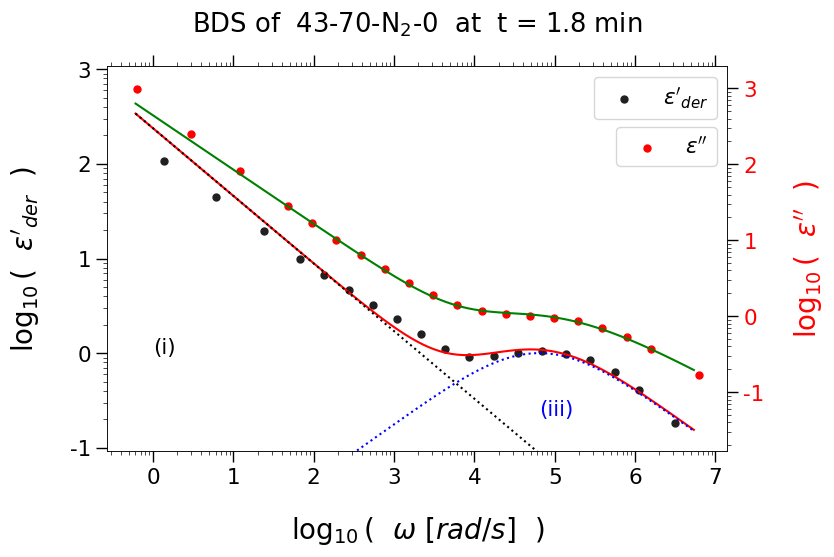

FALLBACK 1:  24287.0
fit score 24287.0
fit parameters [6630000.0, 0.7163, 1.761e-06, 3.498, 0.5861, 64760.0]


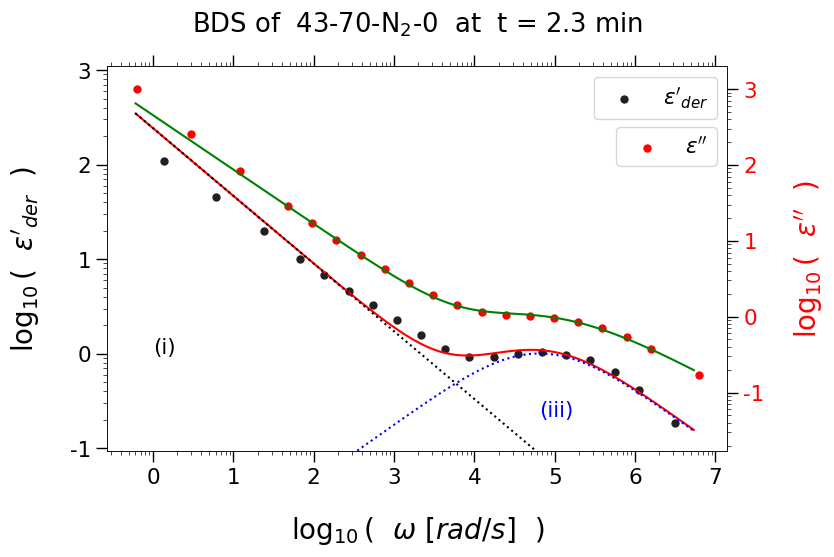

fit score 25213.0
fit parameters [6924000.0, 0.7182, 1.77e-06, 3.504, 0.5859, 65210.0]


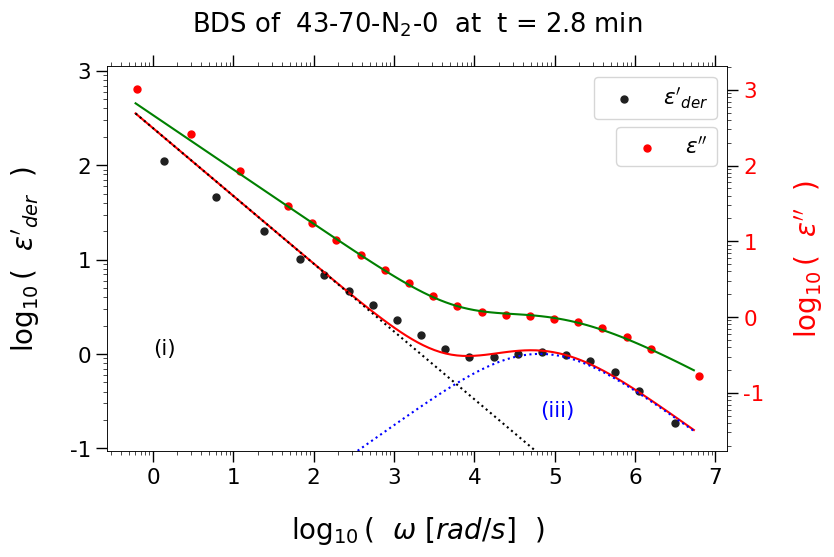

fit score 29181.0
fit parameters [7932000.0, 0.7234, 1.788e-06, 3.51, 0.587, 67360.0]


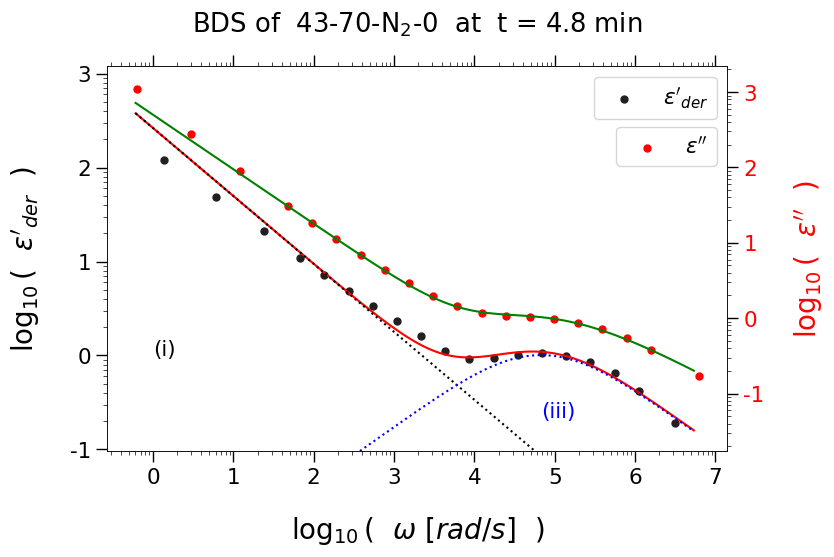

FALLBACK 1:  35654.0
fit score 33643.0
fit parameters [10520000.0, 0.7347, 1.804e-06, 3.54, 0.5869, 70120.0]


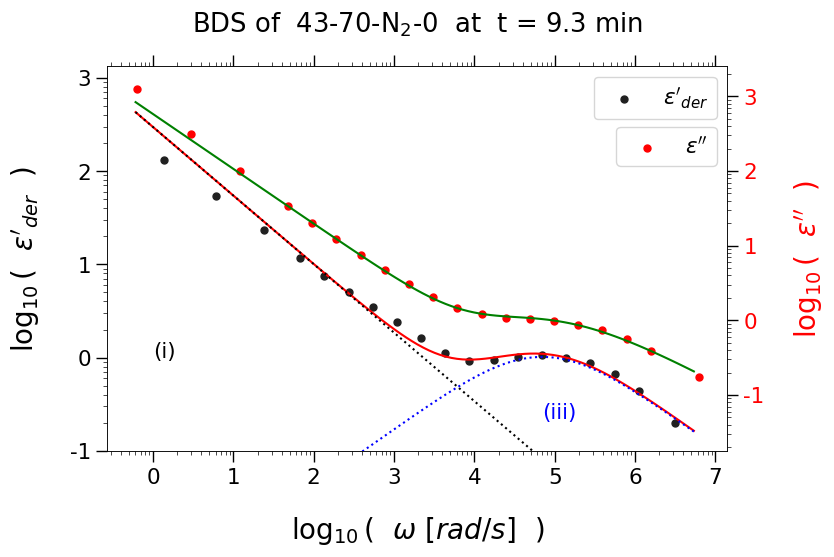

FALLBACK 1:  32988.0
FALLBACK 1:  35051.0
FALLBACK 1:  35912.0
FALLBACK 1:  33788.0
FALLBACK 1:  31961.0
FALLBACK 1:  30995.0
fit score 37632.0
fit parameters [13280000.0, 0.7422, 1.798e-06, 3.537, 0.5898, 75540.0]


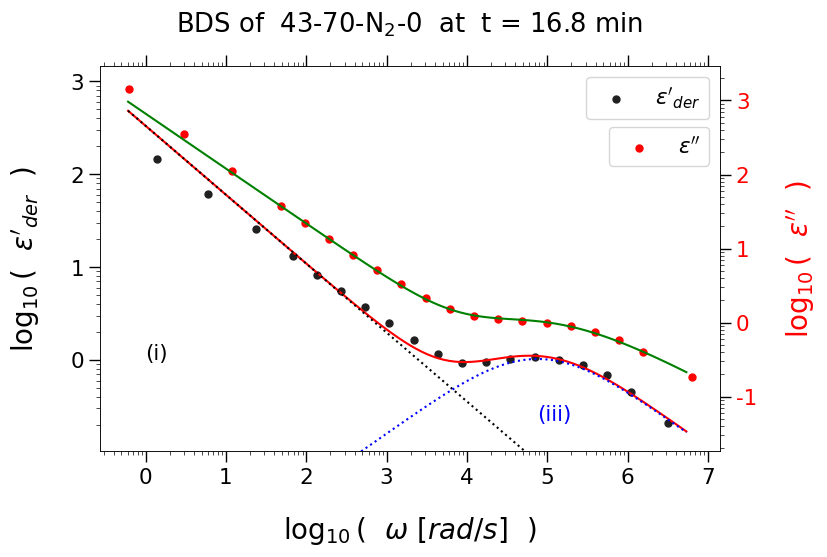

FALLBACK 1:  42980.0
FALLBACK 1:  43350.0
FALLBACK 1:  41334.0
FALLBACK 1:  42013.0
FALLBACK 1:  44938.0
FALLBACK 1:  47965.0
FALLBACK 1:  44501.0
FALLBACK 1:  49183.0
FALLBACK 1:  49276.0
FALLBACK 1:  47230.0
FALLBACK 1:  47669.0
FALLBACK 1:  48515.0
FALLBACK 1:  49089.0
fit score 49089.0
fit parameters [17550000.0, 0.7524, 1.824e-06, 3.551, 0.5913, 81250.0]


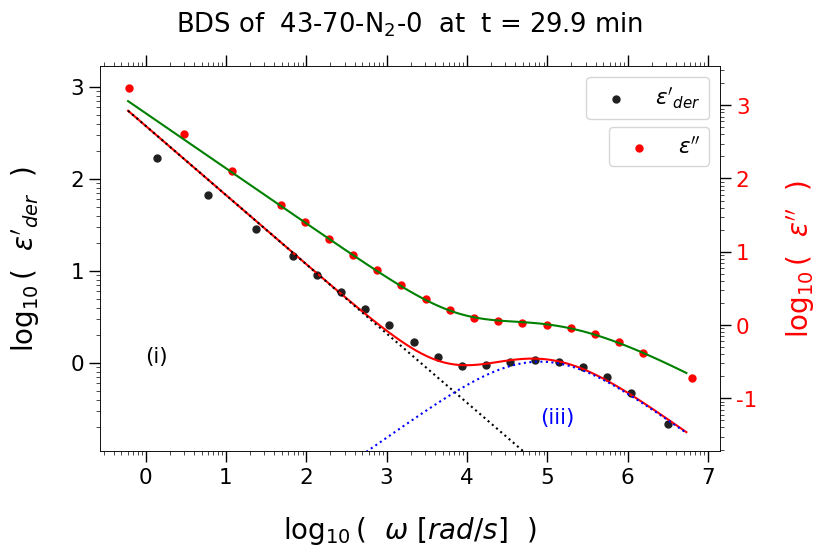

FALLBACK 1:  47760.0
FALLBACK 1:  48714.0
FALLBACK 1:  45958.0
fit score 62854.0
fit parameters [22180000.0, 0.7583, 1.744e-06, 3.544, 0.5935, 88530.0]


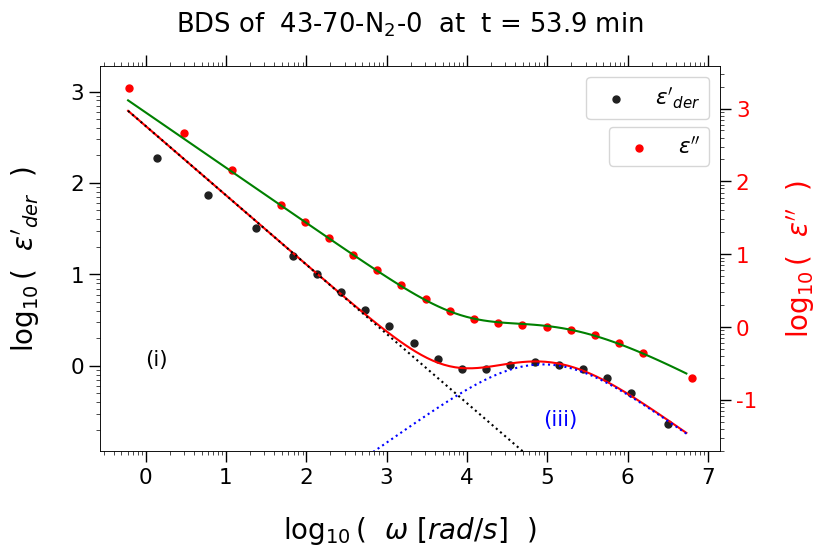

fit score 66252.0
fit parameters [24250000.0, 0.7615, 1.752e-06, 3.551, 0.5927, 91010.0]


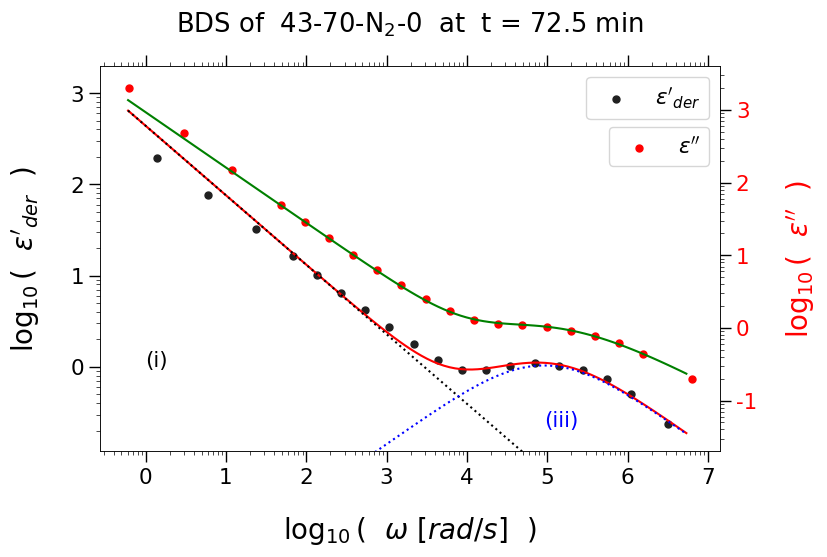

fit score 84990.0
fit parameters [25510000.0, 0.7748, 1.538e-06, 3.496, 0.5625, 69940.0]


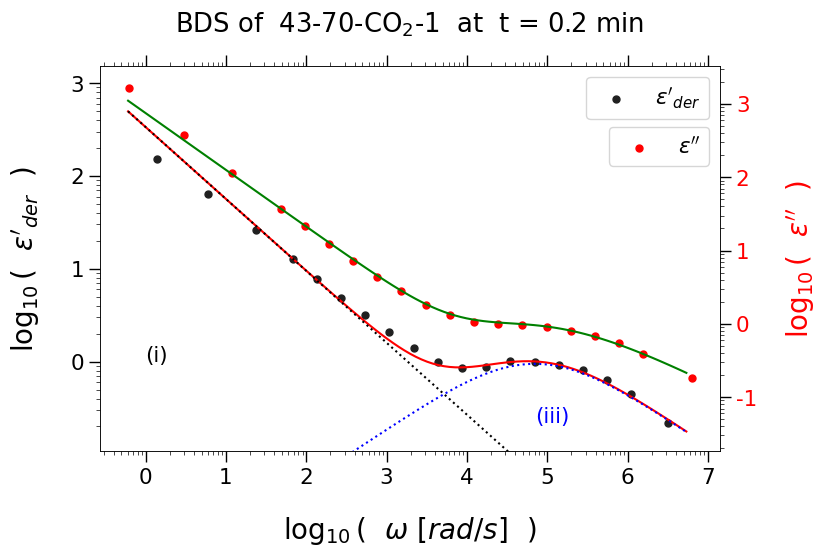

fit score 182230.0
fit parameters [21060000.0, 0.777, 1.229e-06, 3.629, 0.5387, 55810.0]


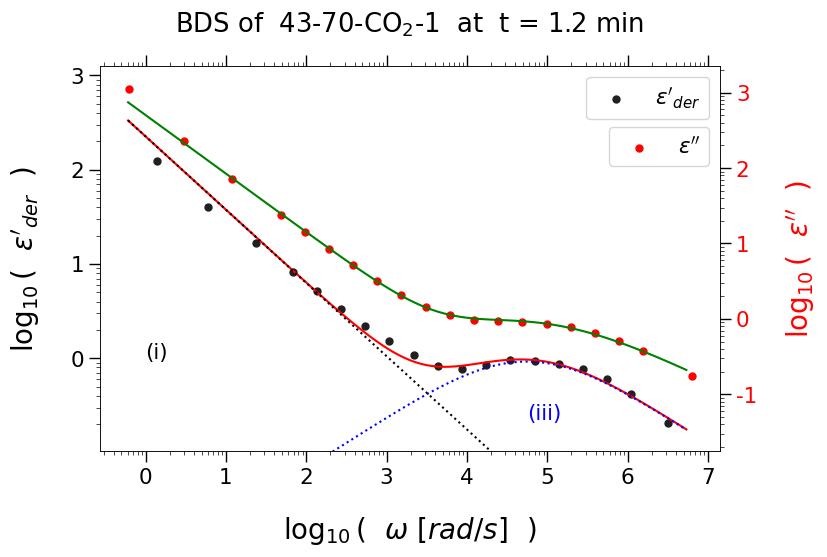

fit score 167724.0
fit parameters [16780000.0, 0.7612, 9.553e-07, 3.523, 0.5413, 55030.0]


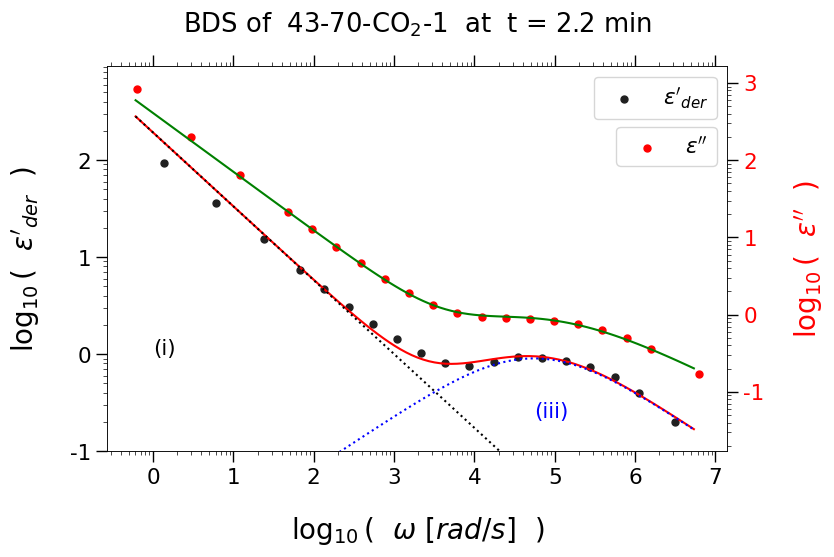

fit score 129541.0
fit parameters [11790000.0, 0.7473, 8.417e-07, 3.506, 0.5316, 50660.0]


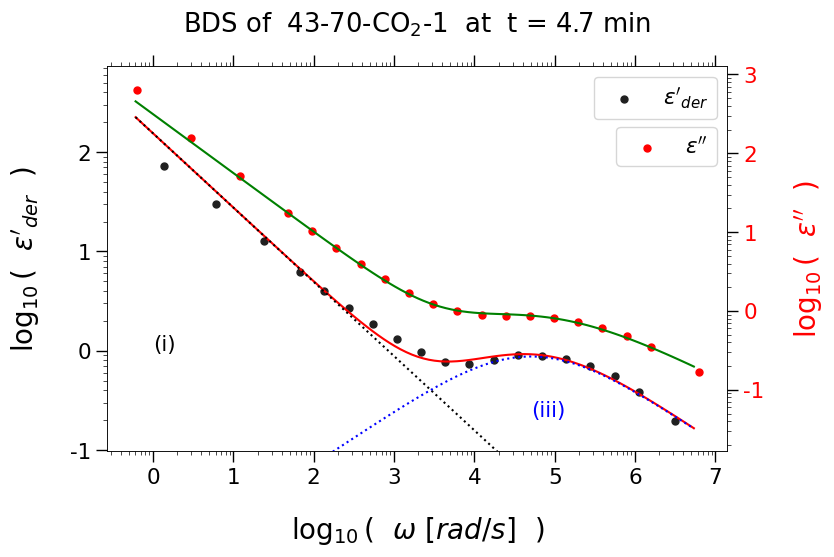

fit score 130230.0
fit parameters [8500000.0, 0.7389, 8.562e-07, 3.521, 0.5179, 46620.0]


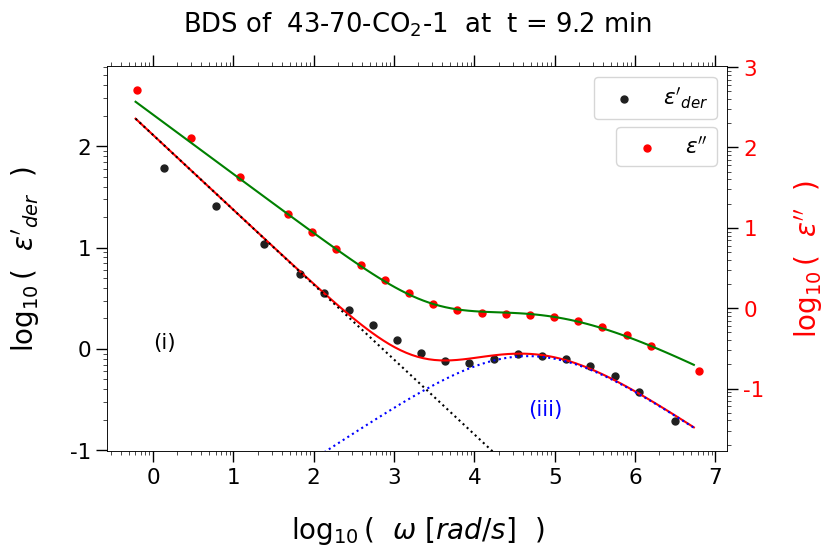

fit score 170376.0
fit parameters [7002000.0, 0.7406, 1.073e-06, 3.543, 0.5066, 45400.0]


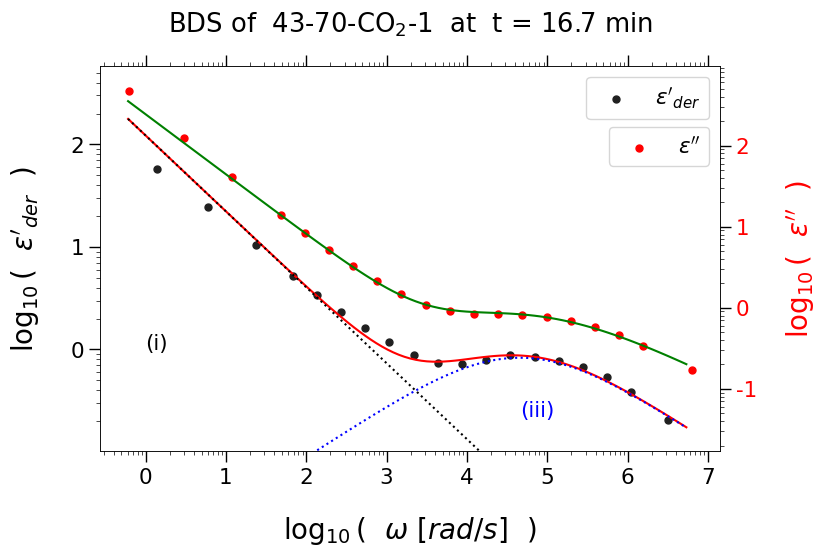

fit score 259719.0
fit parameters [5369000.0, 0.7547, 2.25e-06, 3.595, 0.4941, 45740.0]


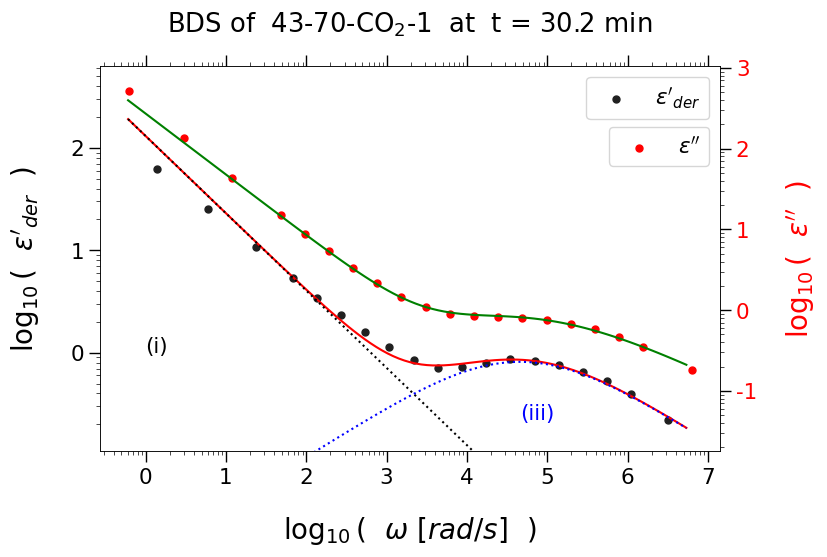

fit score 449591.0
fit parameters [7622000.0, 0.7701, 2.175e-06, 3.624, 0.484, 46920.0]


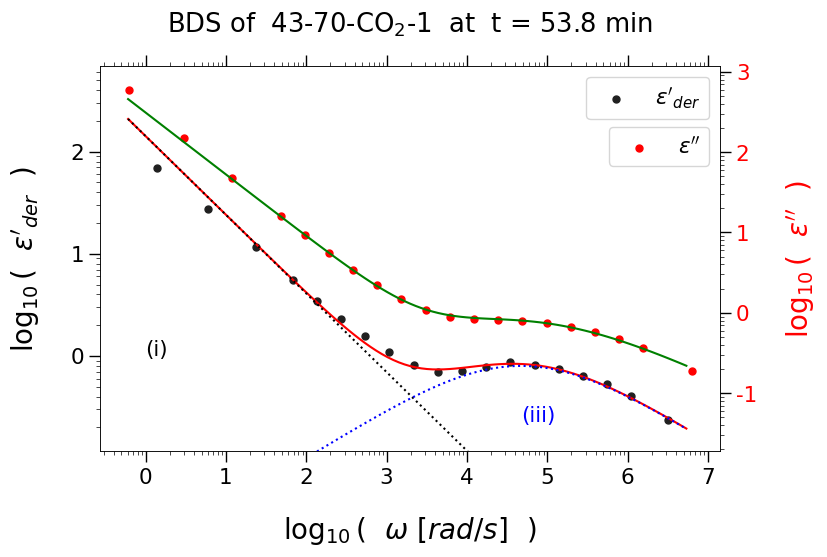

fit score 586802.0
fit parameters [8300000.0, 0.7757, 2.227e-06, 3.638, 0.4796, 46620.0]


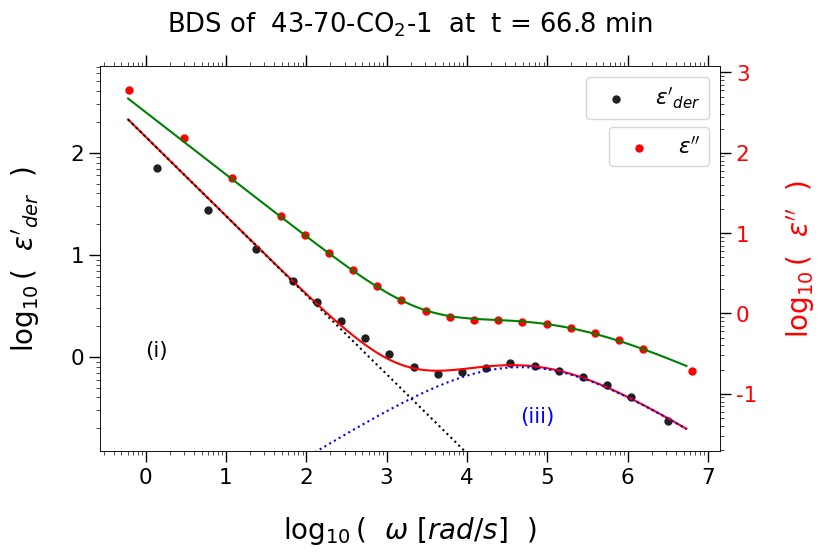

fit score 928082.0
fit parameters [8079000.0, 0.7807, 2.469e-06, 3.681, 0.4755, 44840.0]


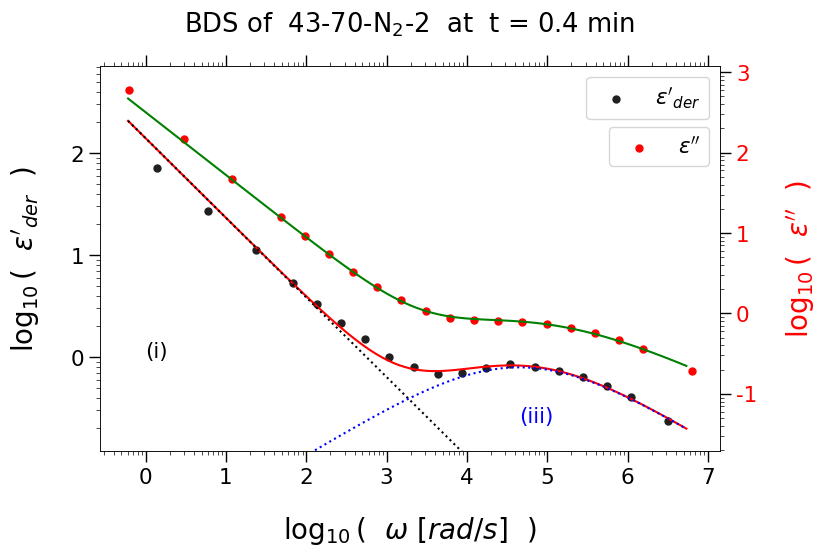

fit score 1092734.0
fit parameters [8073000.0, 0.783, 2.544e-06, 3.734, 0.4734, 42730.0]


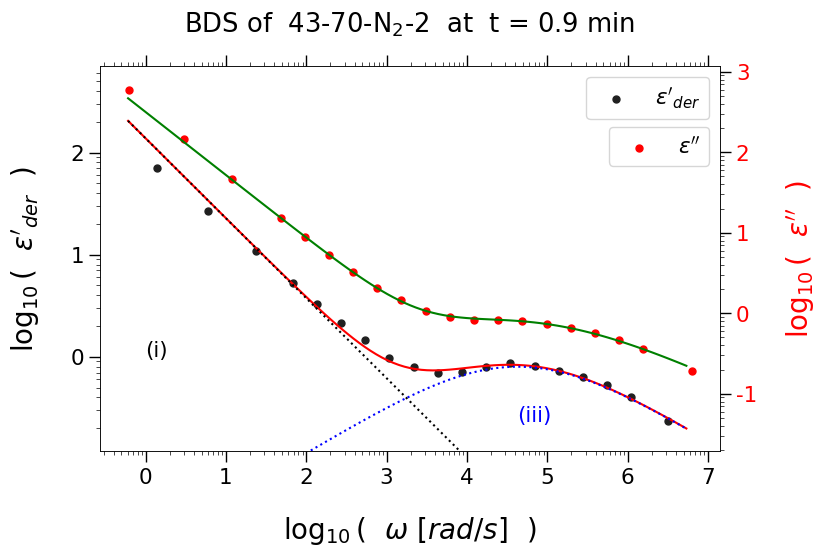

fit score 443827.0
fit parameters [5470000.0, 0.7708, 3.403e-06, 3.821, 0.4734, 40000.0]


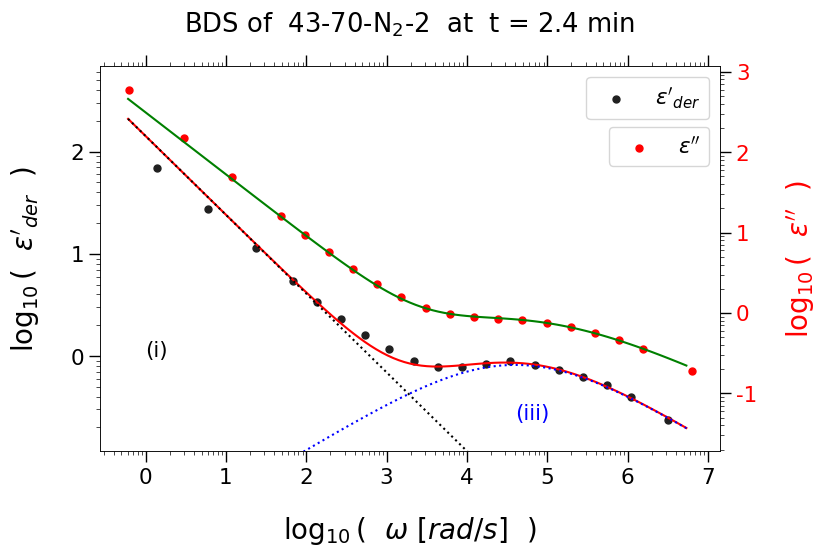

fit score 627510.0
fit parameters [5355000.0, 0.7652, 3.551e-06, 3.842, 0.4935, 40000.0]


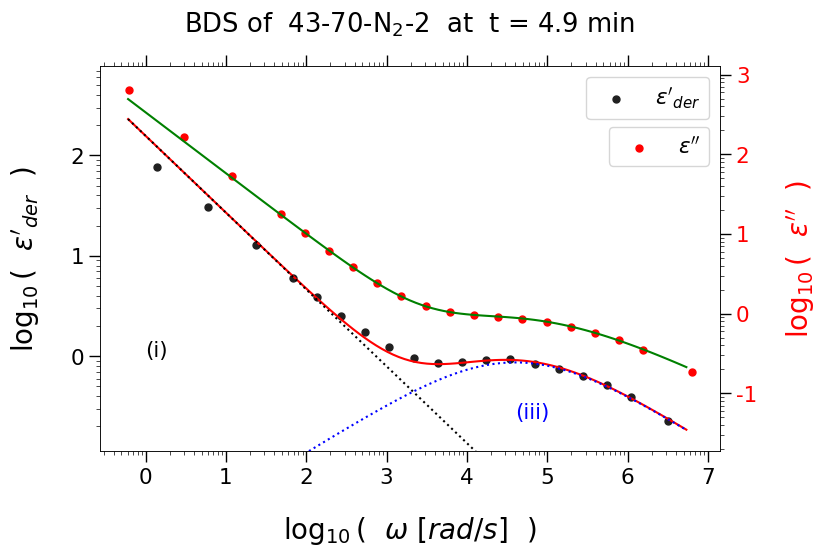

fit score 430976.0
fit parameters [8344000.0, 0.7574, 2.181e-06, 3.944, 0.4982, 40000.0]


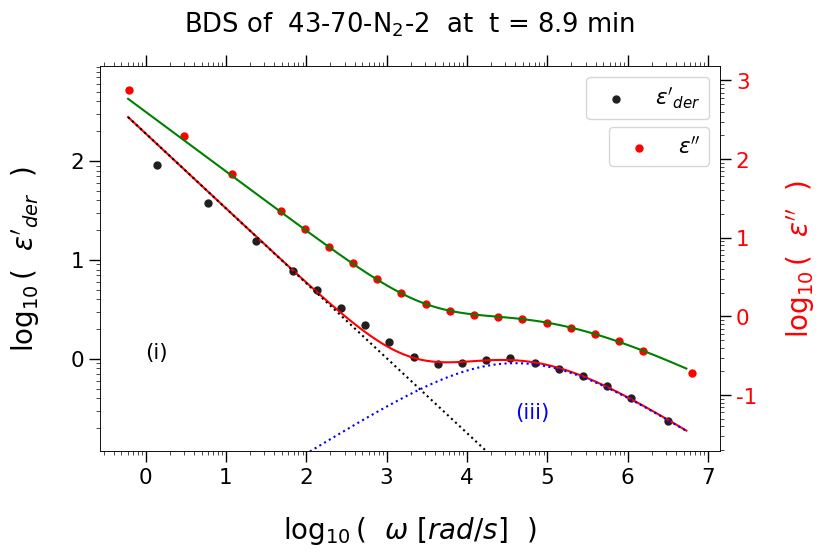

fit score 103783.0
fit parameters [11990000.0, 0.7453, 1.398e-06, 4.018, 0.4995, 45880.0]


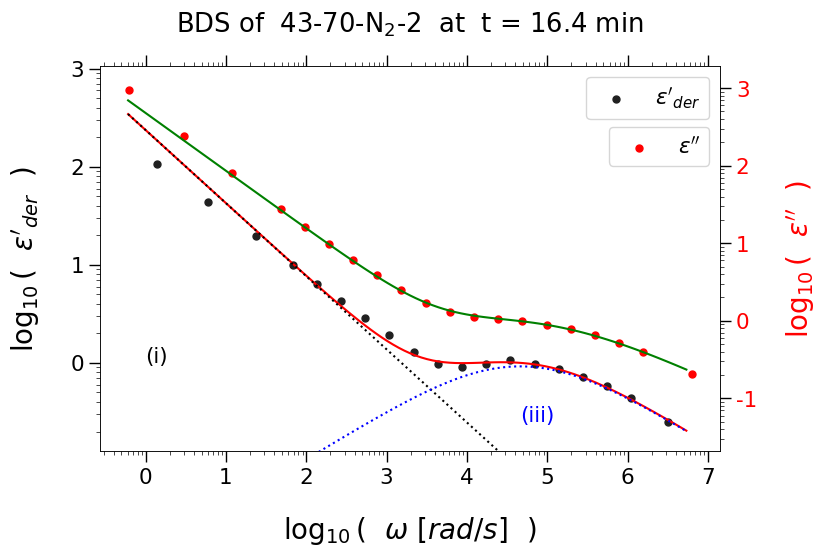

fit score 38739.0
fit parameters [15000000.0, 0.7447, 1.427e-06, 4.026, 0.5053, 59270.0]


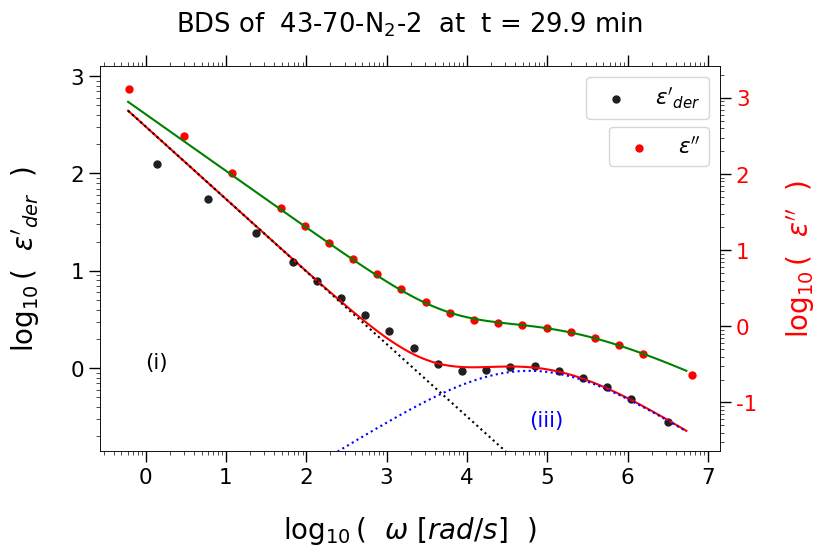

FALLBACK 1:  34518.0
FALLBACK 1:  33401.0
FALLBACK 1:  32734.0
FALLBACK 1:  33500.0
FALLBACK 1:  36486.0
FALLBACK 1:  34196.0
FALLBACK 1:  30672.0
FALLBACK 1:  30297.0
FALLBACK 1:  35339.0
FALLBACK 1:  40498.0
FALLBACK 1:  35211.0
FALLBACK 1:  34053.0
FALLBACK 1:  36993.0
FALLBACK 1:  36606.0
FALLBACK 1:  33166.0
FALLBACK 1:  31785.0
FALLBACK 1:  28800.0
FALLBACK 1:  28835.0
FALLBACK 1:  31808.0
FALLBACK 1:  33694.0
FALLBACK 1:  33042.0
FALLBACK 1:  32266.0
FALLBACK 1:  30998.0
FALLBACK 1:  29416.0
FALLBACK 1:  28577.0
FALLBACK 1:  28298.0
FALLBACK 1:  28190.0
FALLBACK 1:  28055.0
fit score 28055.0
fit parameters [19880000.0, 0.7499, 1.455e-06, 4.021, 0.5093, 73780.0]


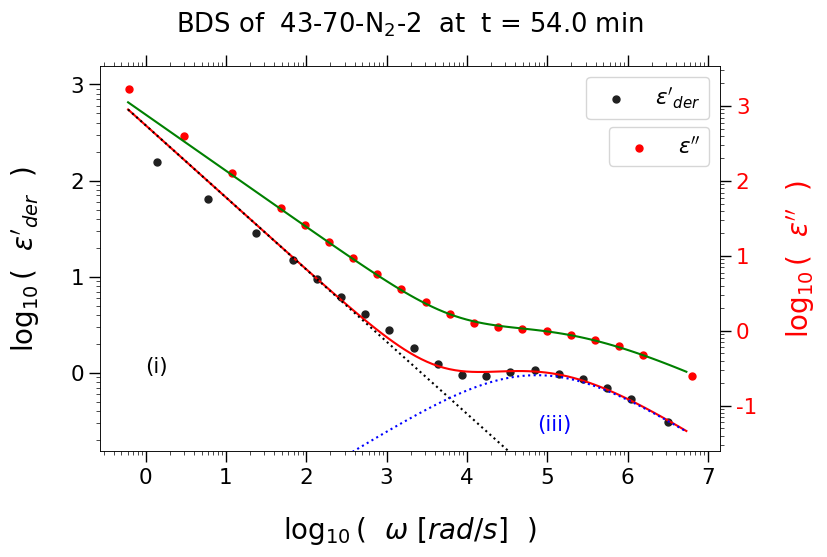

FALLBACK 1:  27735.0
FALLBACK 1:  29322.0
FALLBACK 1:  31171.0
FALLBACK 1:  31040.0
FALLBACK 1:  27519.0
FALLBACK 1:  30402.0
FALLBACK 1:  33780.0
FALLBACK 1:  33646.0
FALLBACK 1:  33704.0
FALLBACK 1:  32445.0
FALLBACK 1:  32124.0
FALLBACK 1:  35631.0
FALLBACK 1:  26473.0
FALLBACK 1:  27565.0
FALLBACK 1:  29946.0
FALLBACK 1:  31850.0
FALLBACK 1:  32125.0
FALLBACK 1:  23814.0
FALLBACK 1:  27402.0
FALLBACK 1:  32300.0
FALLBACK 1:  31425.0
FALLBACK 1:  25979.0
FALLBACK 1:  27645.0
FALLBACK 1:  30915.0
FALLBACK 1:  30578.0
FALLBACK 1:  30127.0
fit score 30127.0
fit parameters [21970000.0, 0.7544, 1.591e-06, 4.017, 0.5109, 81150.0]


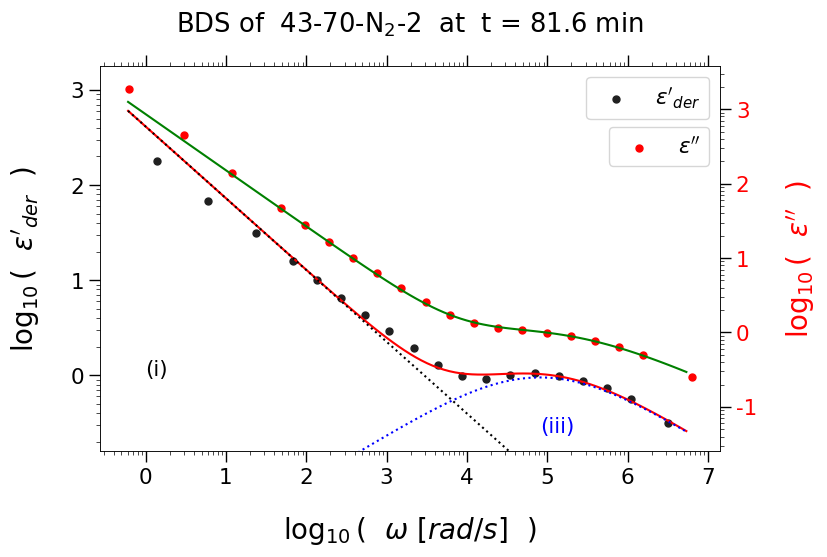

fit score 186996.0
fit parameters [29130000.0, 0.7875, 1.528e-06, 3.878, 0.4906, 57980.0]


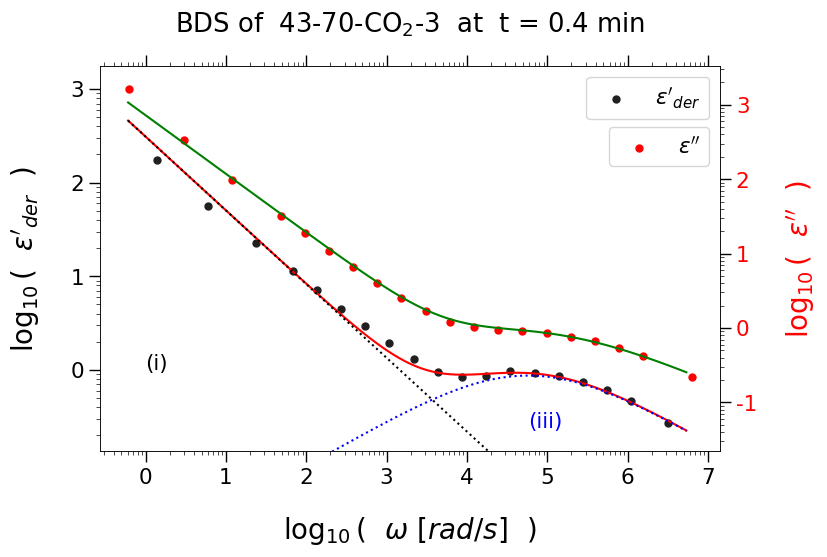

fit score 423956.0
fit parameters [27560000.0, 0.7983, 1.533e-06, 3.942, 0.4839, 53070.0]


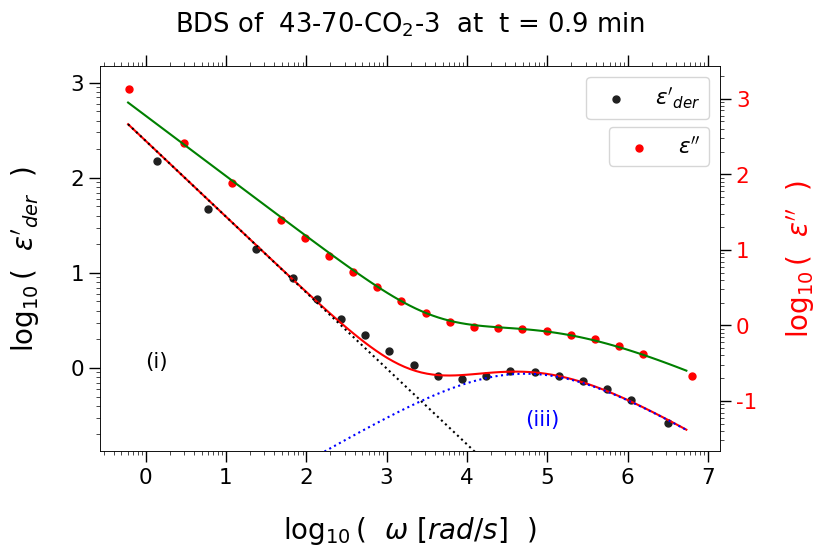

fit score 230259.0
fit parameters [18780000.0, 0.7708, 9.776e-07, 3.795, 0.4865, 51830.0]


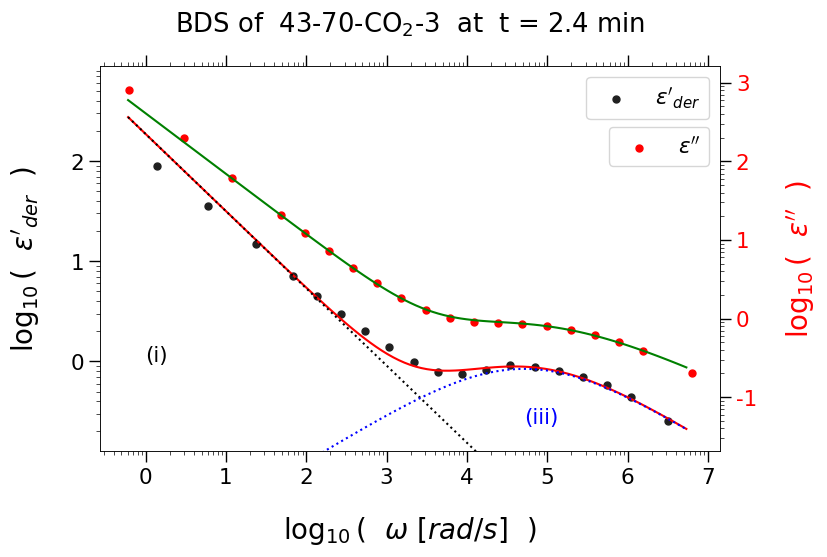

fit score 267605.0
fit parameters [15270000.0, 0.7678, 1.02e-06, 3.774, 0.481, 48520.0]


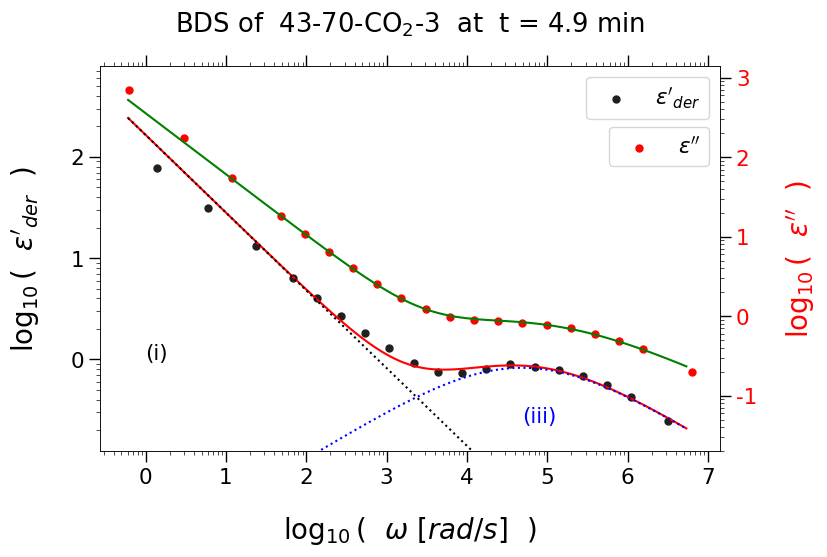

fit score 350271.0
fit parameters [12660000.0, 0.7663, 1.093e-06, 3.761, 0.4751, 45630.0]


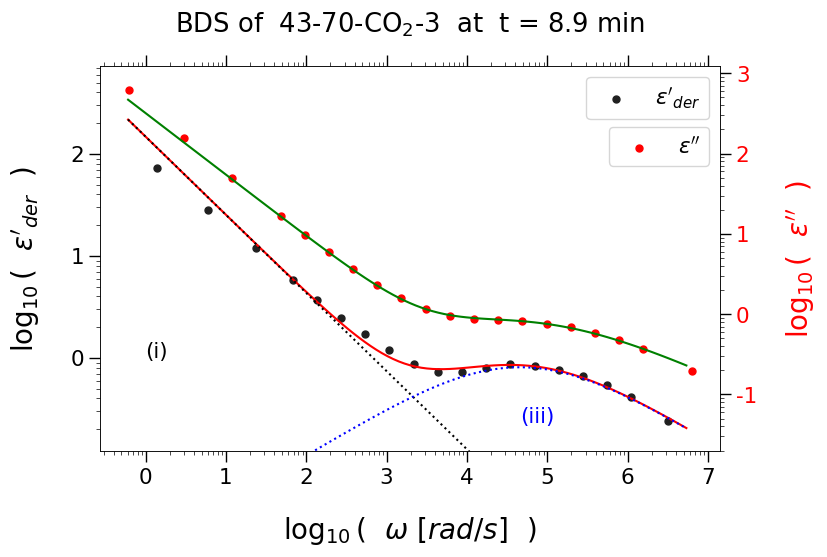

fit score 439646.0
fit parameters [11210000.0, 0.7672, 1.172e-06, 3.753, 0.4688, 43230.0]


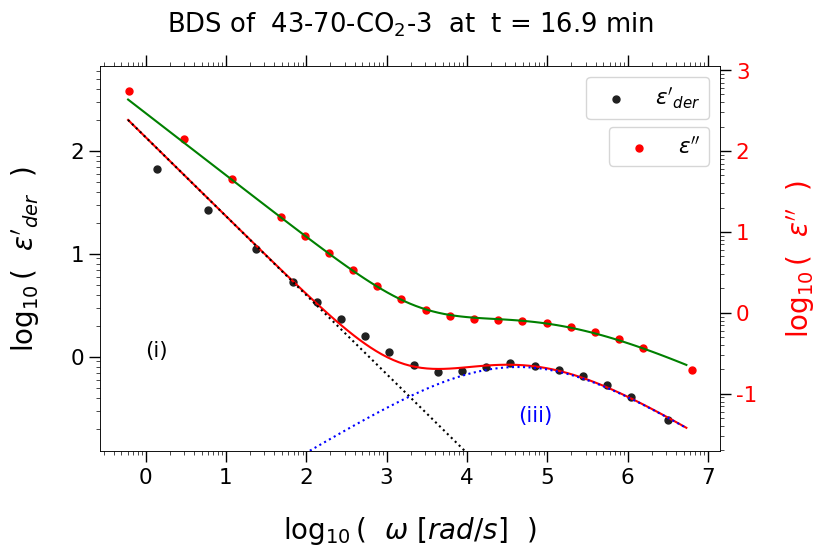

fit score 713778.0
fit parameters [9673000.0, 0.7748, 1.614e-06, 3.748, 0.4638, 42000.0]


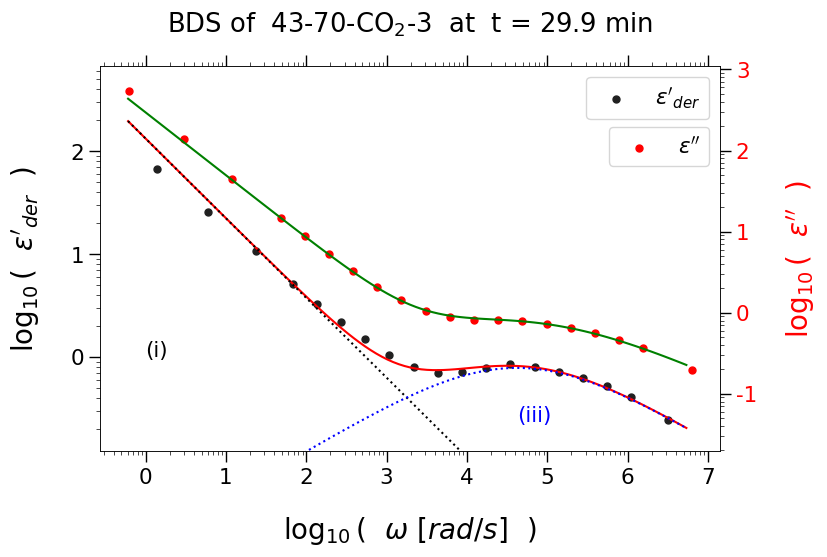

fit score 707368.0
fit parameters [9647000.0, 0.7747, 1.617e-06, 3.747, 0.4637, 42000.0]


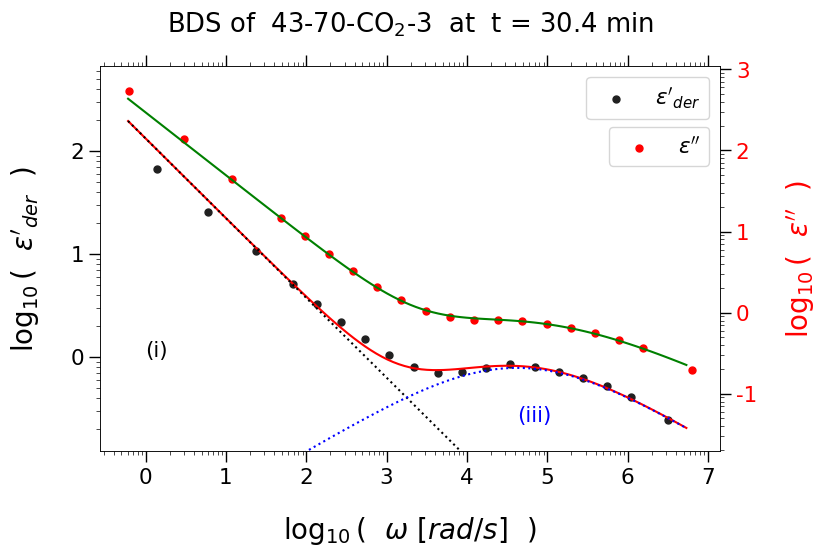

[2.0, 0.7, 0.01, 0.1, 0.5, 400000.0]
0 1 RuntimeError :  Optimal parameters not found: The maximum number of function evaluations is exceeded.


/tmp/ipykernel_114575/1076899024.py:7: RuntimeWarning: invalid value encountered in divide
  return -np.imag(de/den)


FALLBACK 1:  10840.0
fit score 10840.0
fit parameters [373200.0, 0.6094, 1.726e-06, 3.602, 0.5334, 40000.0]


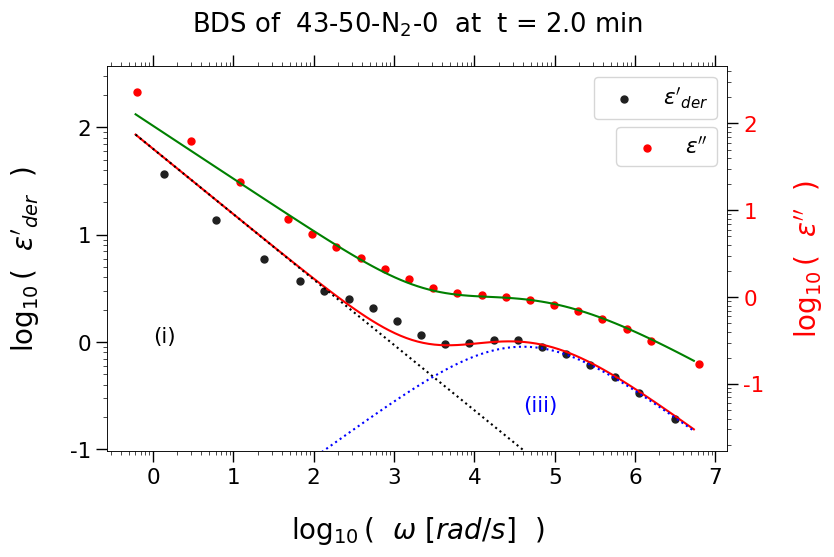

fit score 11121.0
fit parameters [391900.0, 0.6111, 1.711e-06, 3.624, 0.532, 40000.0]


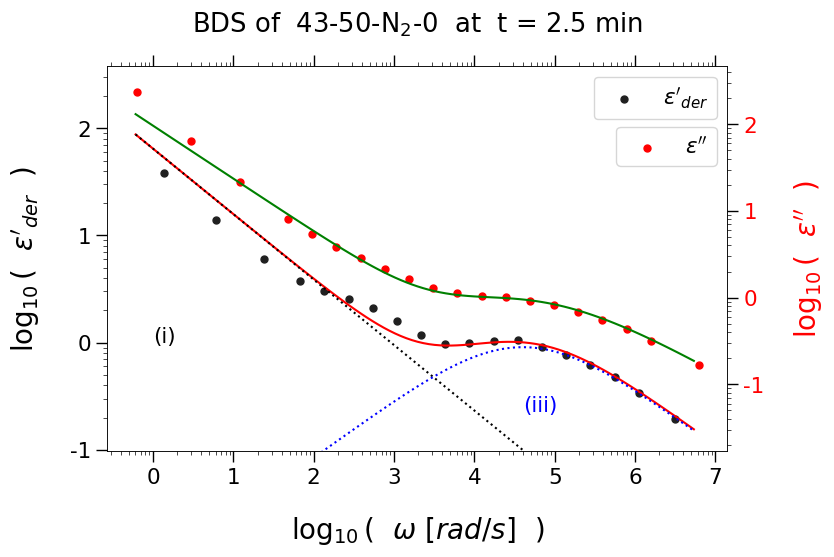

fit score 11371.0
fit parameters [403100.0, 0.6126, 1.749e-06, 3.645, 0.5306, 40000.0]


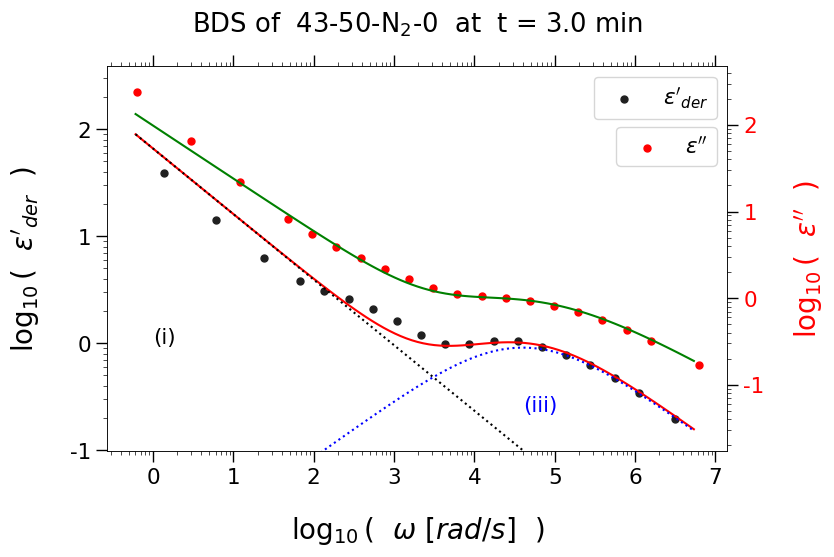

FALLBACK 1:  11945.0
FALLBACK 1:  12188.0
FALLBACK 1:  12470.0
fit score 12470.0
fit parameters [473000.0, 0.6197, 1.816e-06, 3.726, 0.5255, 40000.0]


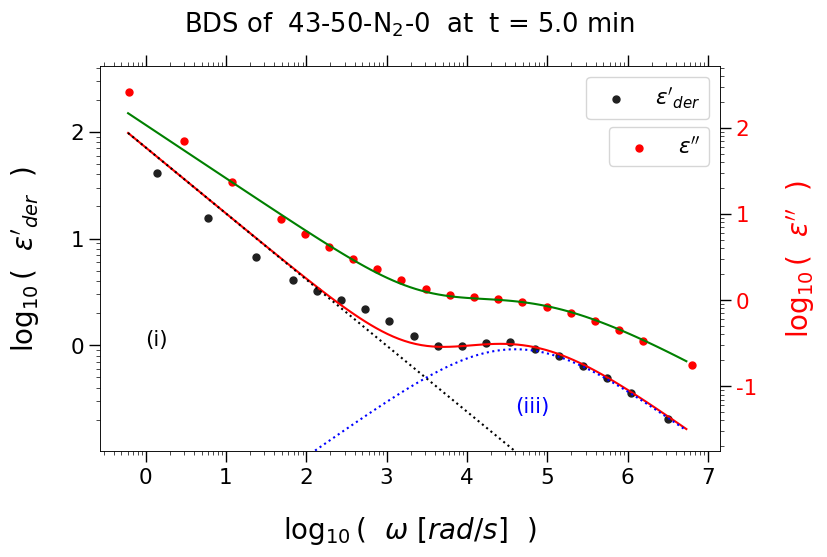

FALLBACK 1:  14890.0
FALLBACK 1:  15638.0
FALLBACK 1:  16965.0
fit score 16965.0
fit parameters [647400.0, 0.6333, 1.948e-06, 3.877, 0.5161, 40000.0]


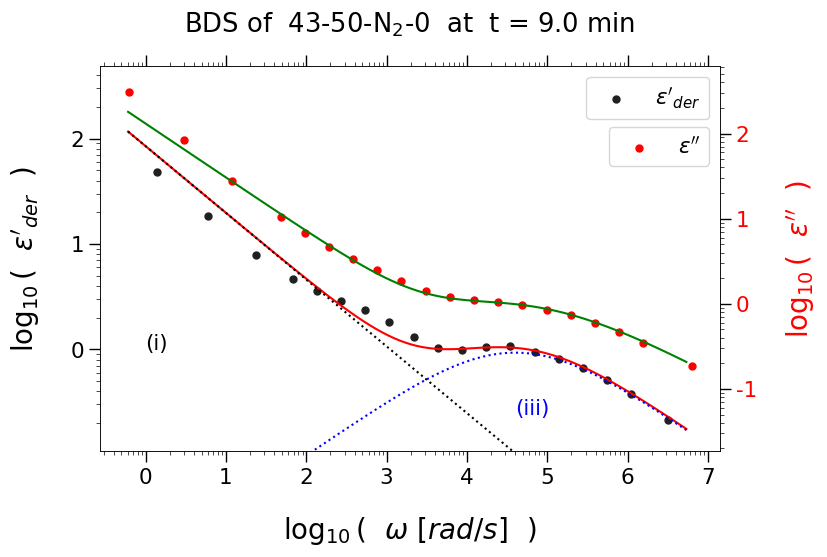

FALLBACK 1:  17380.0
FALLBACK 1:  20278.0
FALLBACK 1:  23158.0
FALLBACK 1:  24285.0
FALLBACK 1:  25562.0
fit score 26934.0
fit parameters [1039000.0, 0.6534, 2.18e-06, 4.111, 0.502, 40000.0]


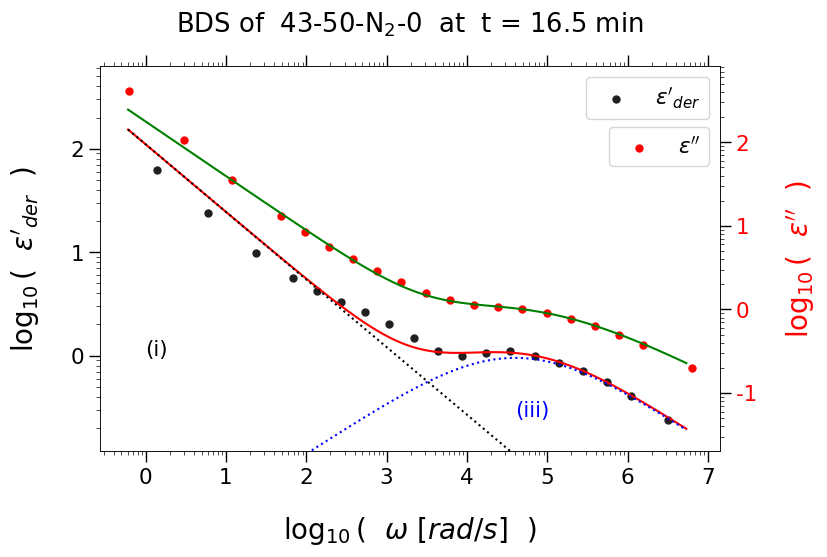

FALLBACK 1:  29340.0
FALLBACK 1:  38969.0
FALLBACK 1:  40152.0
FALLBACK 1:  41468.0
FALLBACK 1:  42783.0
FALLBACK 1:  43397.0
FALLBACK 1:  44722.0
FALLBACK 1:  46197.0
FALLBACK 1:  47634.0
FALLBACK 1:  49509.0
fit score 54741.0
fit parameters [1946000.0, 0.6782, 2.431e-06, 4.403, 0.4855, 40000.0]


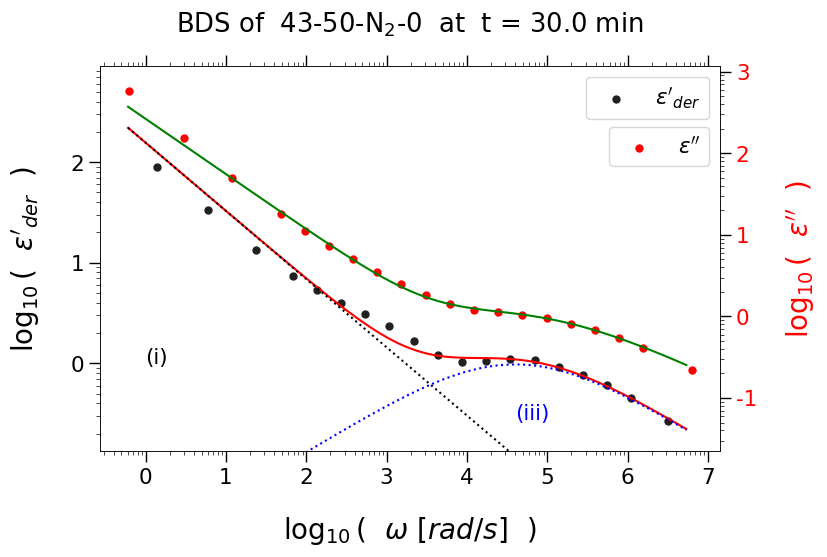

fit score 157770.0
fit parameters [3904000.0, 0.7023, 2.426e-06, 4.692, 0.469, 40000.0]


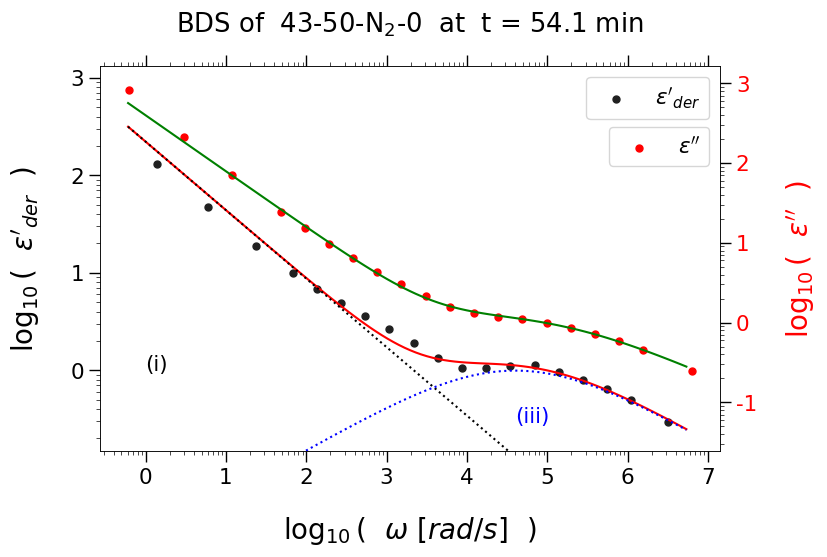

fit score 294655.0
fit parameters [6066000.0, 0.7123, 2.046e-06, 4.821, 0.4604, 40000.0]


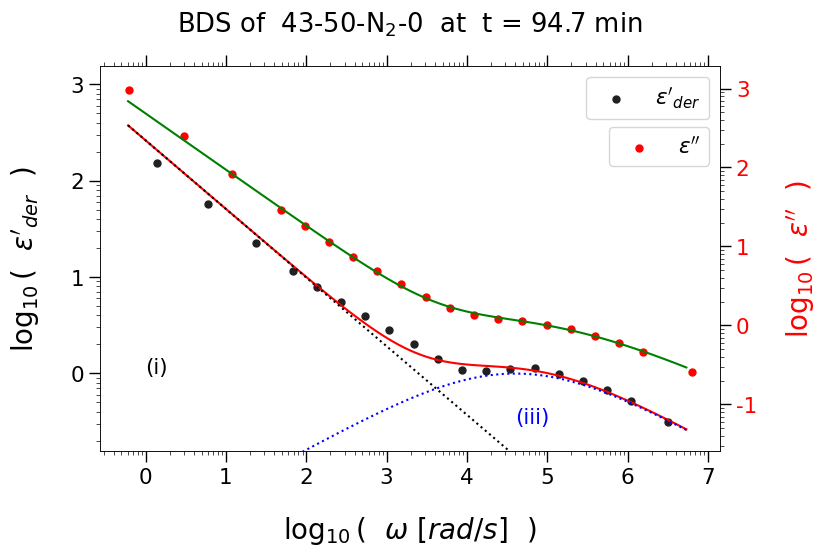

fit score 524568.0
fit parameters [3261000.0, 0.695, 1.628e-06, 4.1, 0.4823, 40000.0]


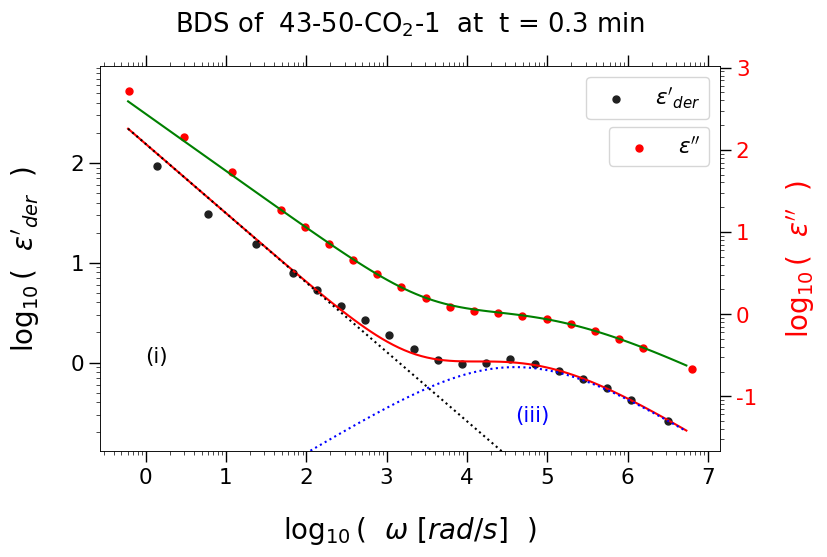

fit score 1248702.0
fit parameters [3304000.0, 0.7115, 1.888e-06, 4.15, 0.4851, 40000.0]


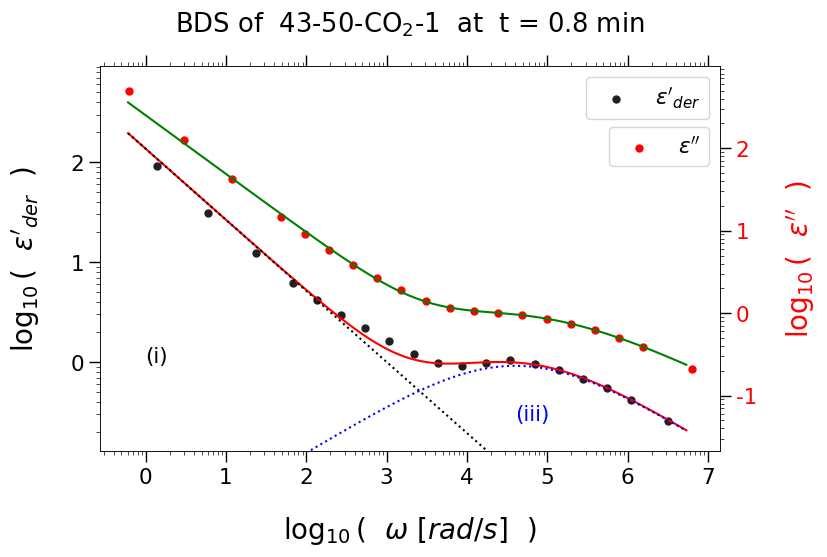

fit score 1183866.0
fit parameters [2688000.0, 0.7054, 1.934e-06, 4.056, 0.4861, 40000.0]


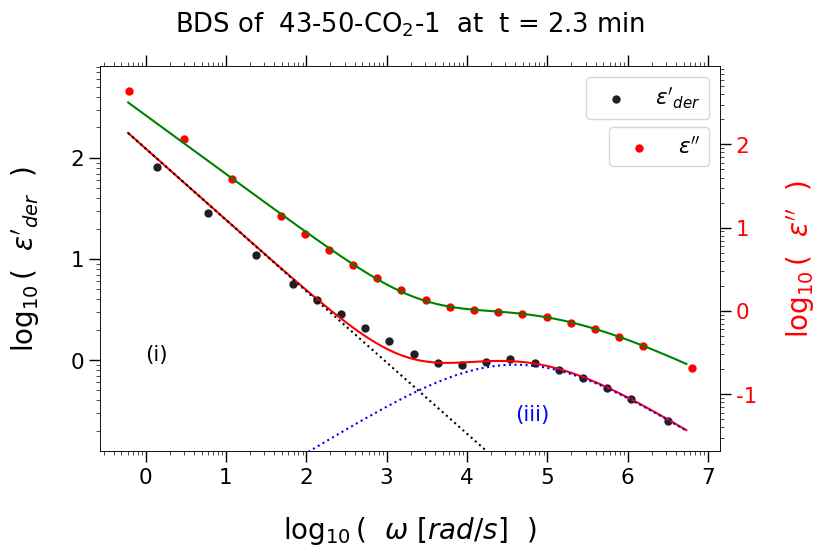

fit score 1217188.0
fit parameters [2393000.0, 0.7029, 1.952e-06, 3.989, 0.4868, 40000.0]


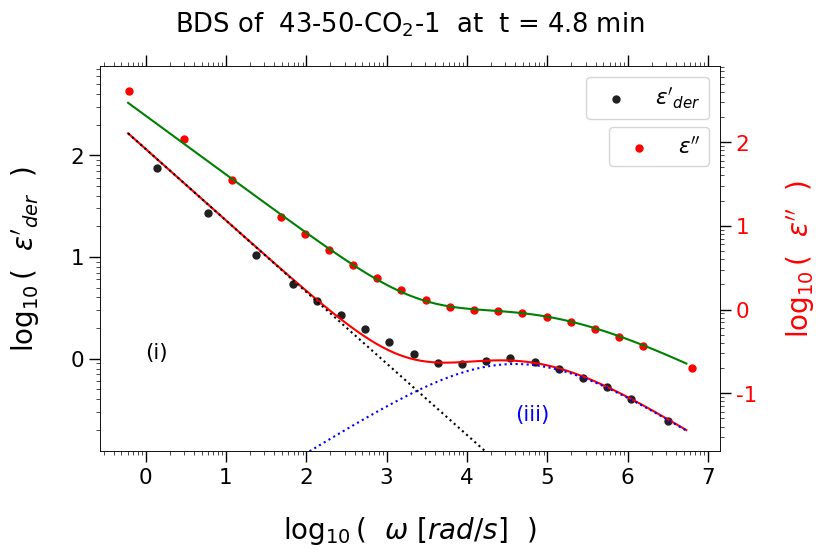

fit score 1303474.0
fit parameters [2206000.0, 0.7014, 1.928e-06, 3.923, 0.4874, 40000.0]


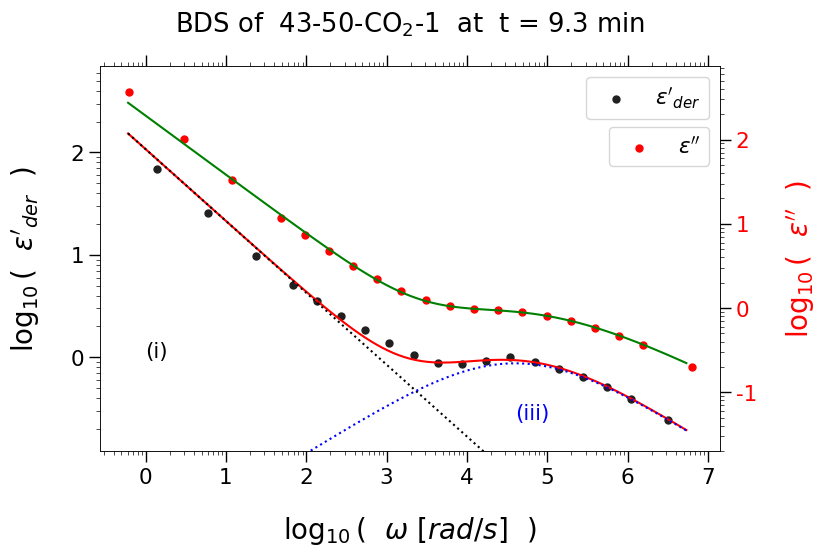

fit score 1717836.0
fit parameters [2132000.0, 0.7034, 1.989e-06, 3.873, 0.4874, 40000.0]


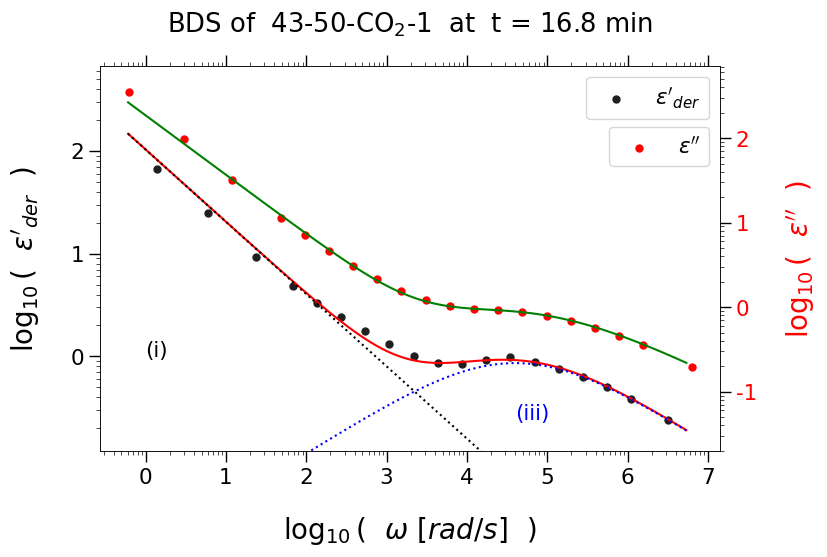

fit score 2123036.0
fit parameters [1850000.0, 0.7055, 2.435e-06, 3.835, 0.4865, 40000.0]


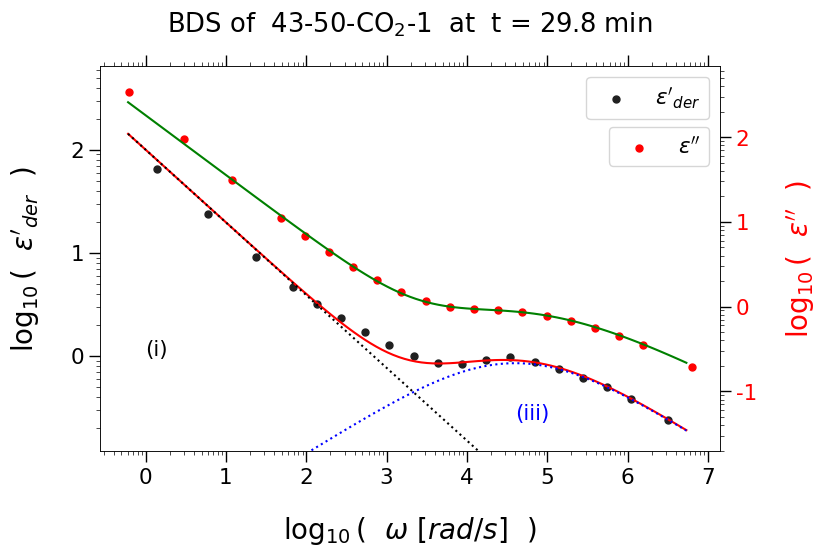

fit score 3245709.0
fit parameters [1427000.0, 0.7118, 3.978e-06, 3.802, 0.4859, 40000.0]


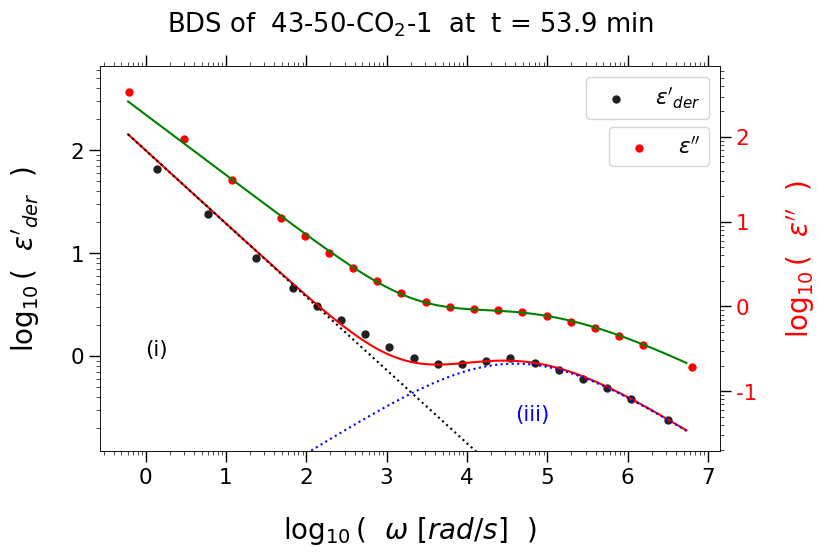

fit score 3801504.0
fit parameters [1393000.0, 0.7138, 4.157e-06, 3.767, 0.486, 40000.0]


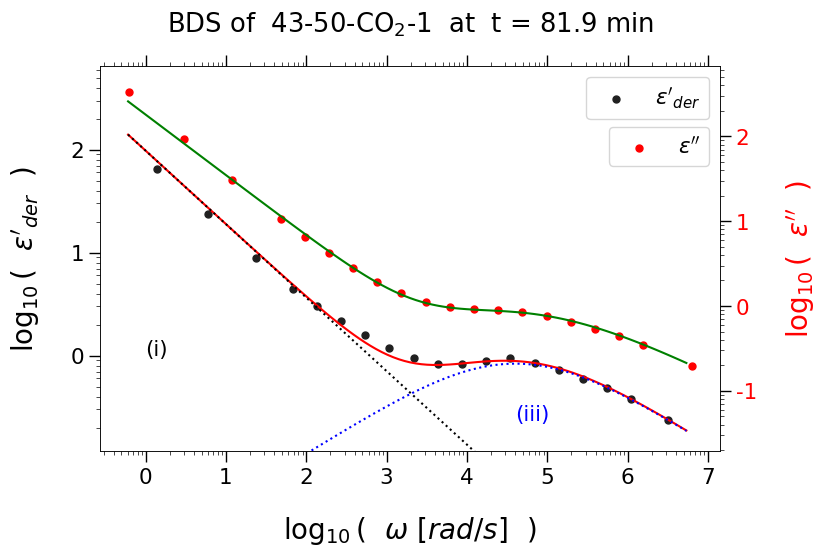

fit score 2561244.0
fit parameters [1184000.0, 0.7152, 4.988e-06, 3.67, 0.4926, 40000.0]


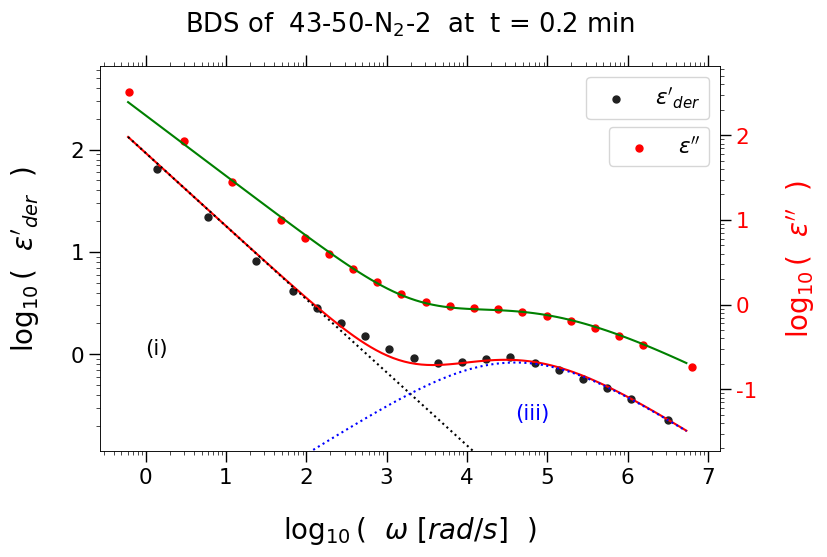

fit score 1682017.0
fit parameters [1051000.0, 0.7084, 4.644e-06, 3.562, 0.5014, 40000.0]


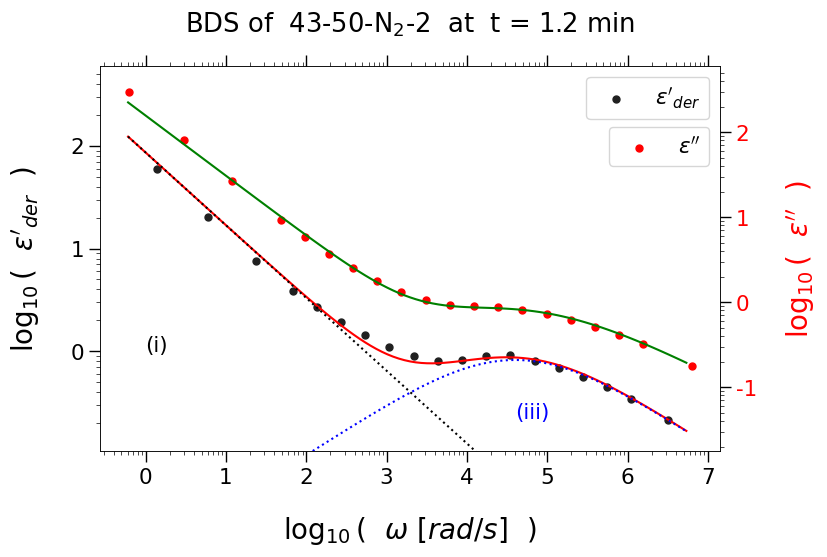

fit score 866906.0
fit parameters [900300.0, 0.7002, 4.314e-06, 3.463, 0.5085, 40000.0]


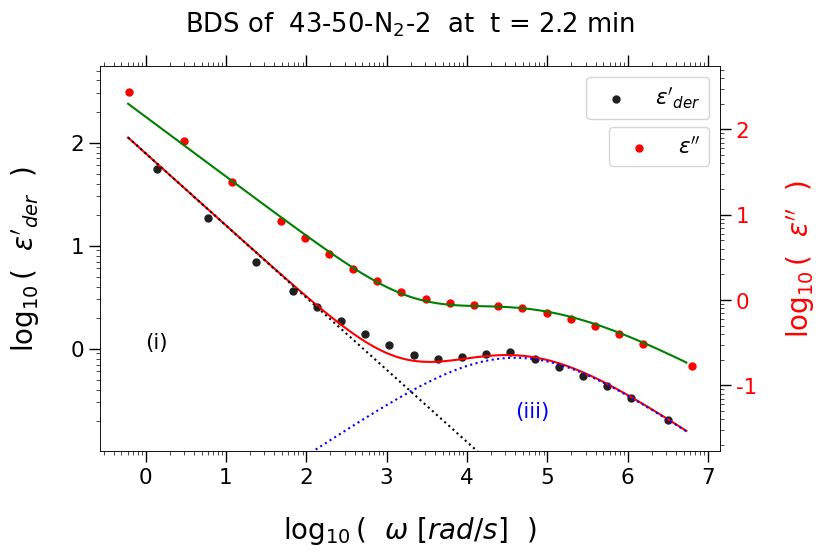

fit score 264754.0
fit parameters [663100.0, 0.6848, 3.802e-06, 3.317, 0.5185, 40000.0]


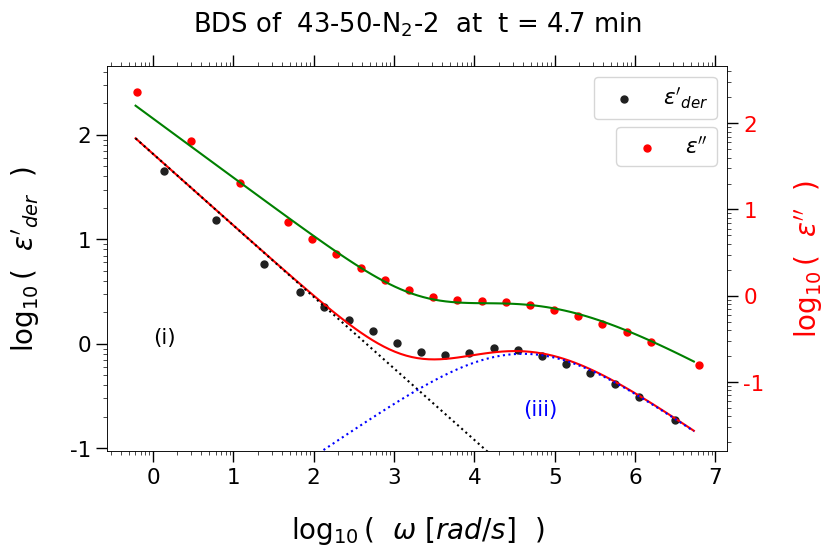

fit score 73918.0
fit parameters [387100.0, 0.6589, 3.538e-06, 3.172, 0.5264, 40000.0]


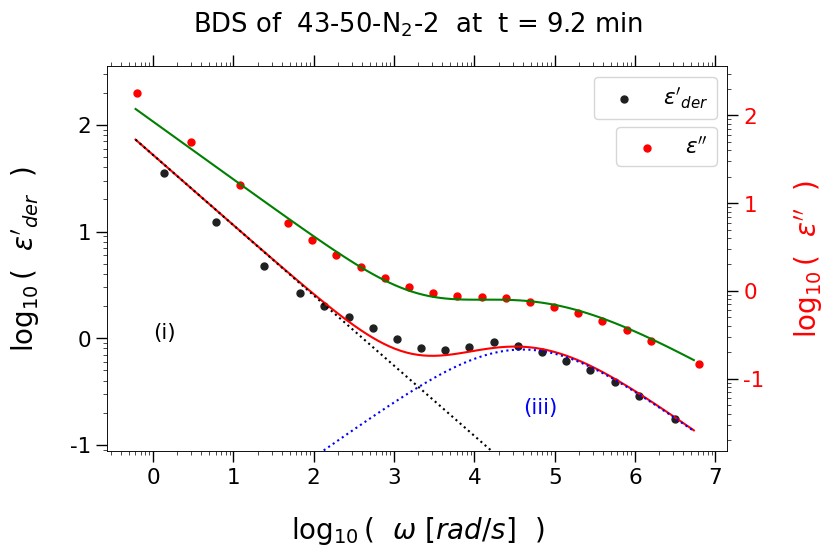

FALLBACK 1:  44625.0
FALLBACK 1:  34264.0
fit score 34264.0
fit parameters [285100.0, 0.6409, 3.216e-06, 3.134, 0.5279, 40000.0]


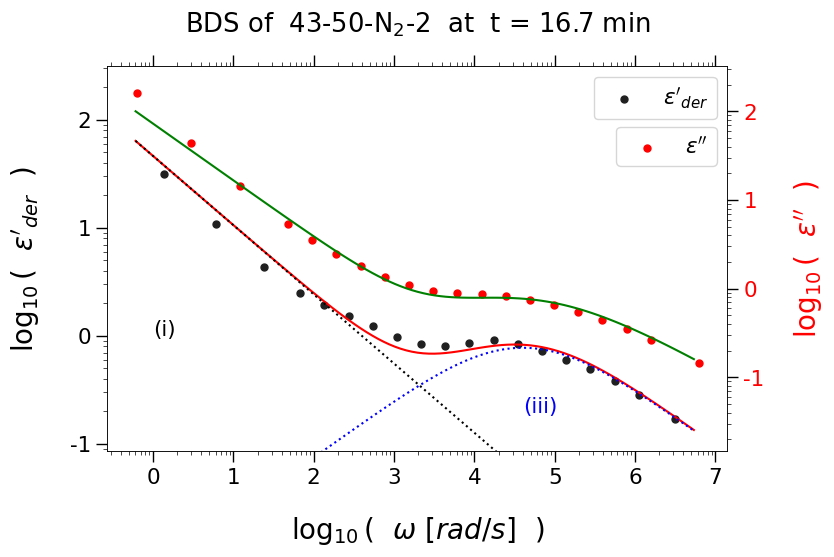

FALLBACK 1:  33300.0
FALLBACK 1:  32894.0
FALLBACK 1:  32789.0
FALLBACK 1:  32443.0
FALLBACK 1:  32010.0
FALLBACK 1:  32163.0
FALLBACK 1:  32645.0
FALLBACK 1:  33551.0
FALLBACK 1:  34433.0
FALLBACK 1:  35174.0
FALLBACK 1:  35561.0
FALLBACK 1:  35872.0
FALLBACK 1:  36807.0
FALLBACK 1:  37839.0
FALLBACK 1:  38772.0
FALLBACK 1:  39821.0
FALLBACK 1:  40853.0
FALLBACK 1:  41863.0
FALLBACK 1:  42994.0
FALLBACK 1:  46998.0
FALLBACK 1:  48218.0
fit score 58594.0
fit parameters [396100.0, 0.6545, 3.627e-06, 3.286, 0.5238, 40000.0]


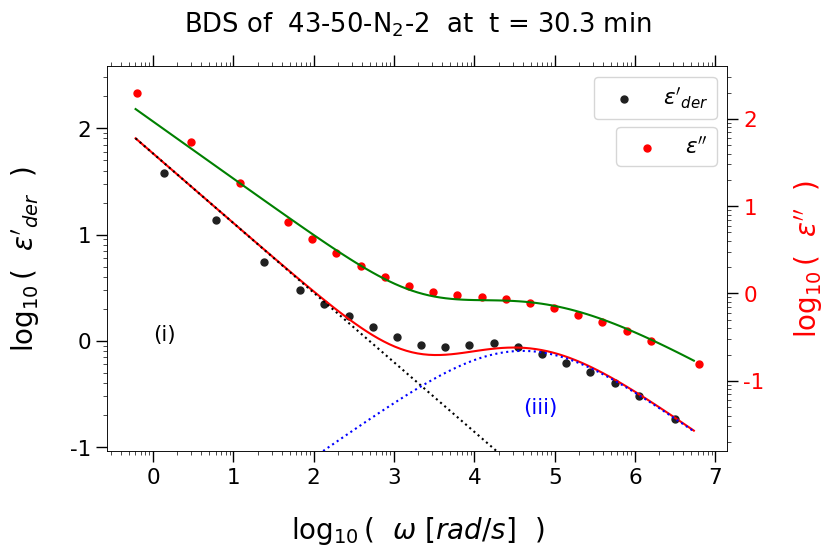

fit score 485889.0
fit parameters [962700.0, 0.6861, 4.004e-06, 3.595, 0.5184, 40000.0]


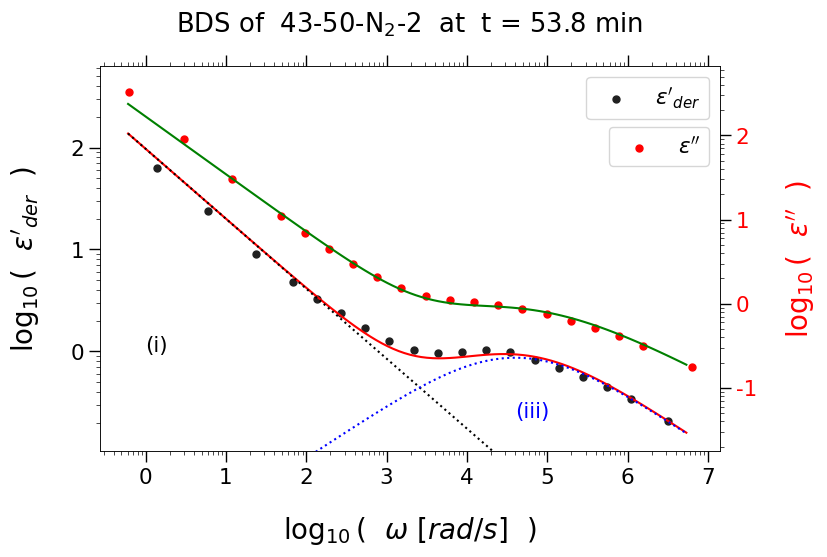

fit score 2579999.0
fit parameters [2823000.0, 0.7127, 3.316e-06, 3.943, 0.5105, 40000.0]


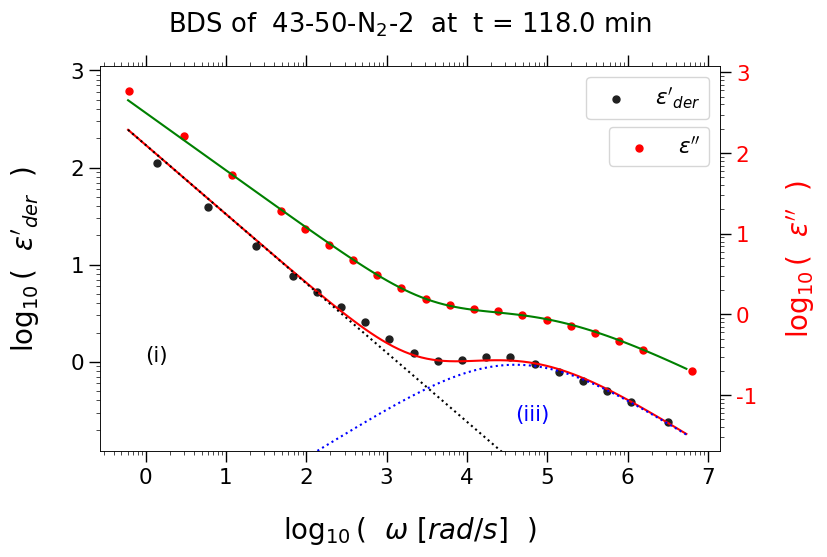

fit score 748176.0
fit parameters [1257000.0, 0.7325, 8.993e-06, 3.914, 0.5085, 40000.0]


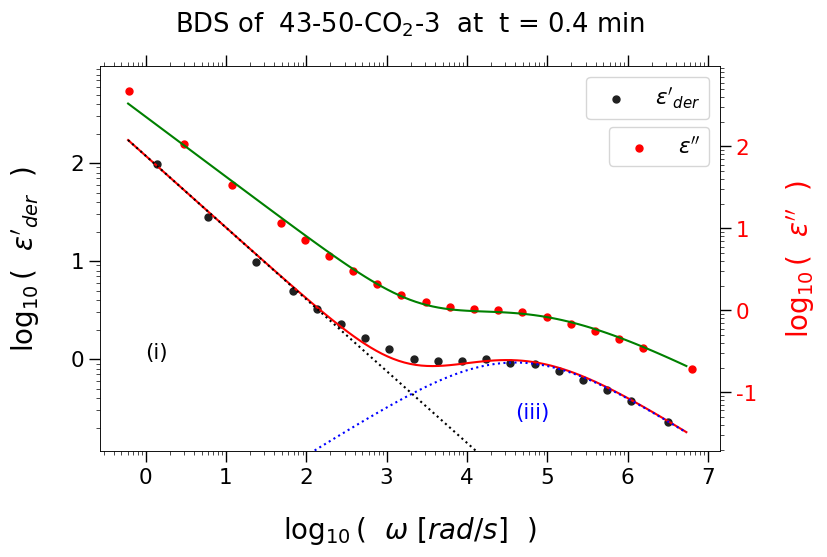

fit score 585101.0
fit parameters [1085000.0, 0.7179, 6.985e-06, 3.774, 0.5113, 40000.0]


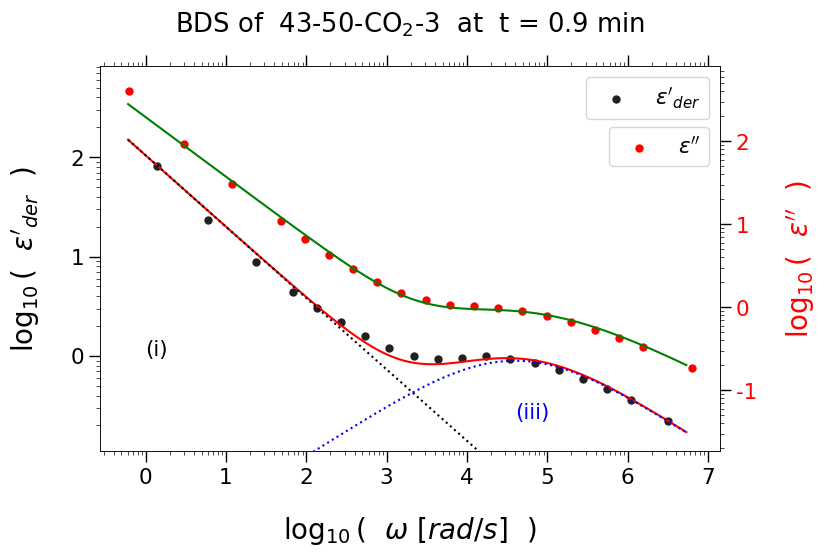

fit score 358114.0
fit parameters [847500.0, 0.6997, 4.897e-06, 3.501, 0.5158, 40000.0]


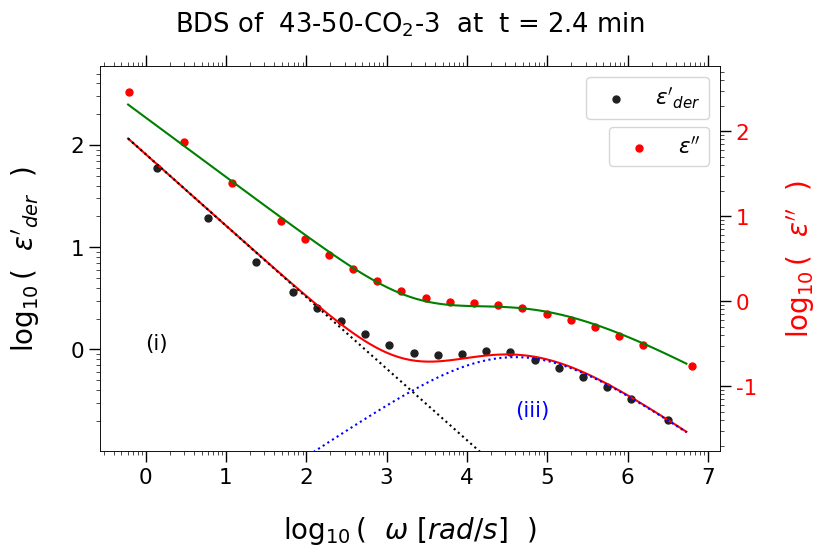

fit score 213955.0
fit parameters [631700.0, 0.6838, 4.163e-06, 3.318, 0.5233, 40000.0]


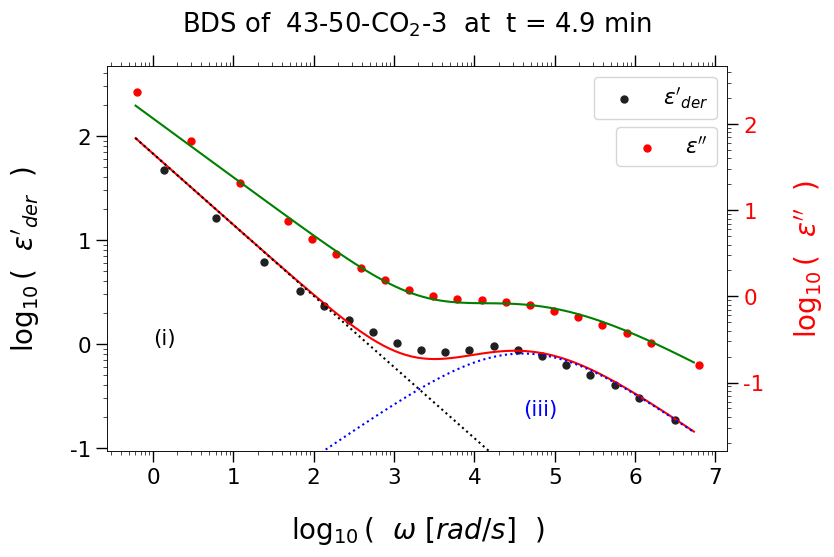

fit score 97494.0
fit parameters [440800.0, 0.6665, 3.604e-06, 3.161, 0.529, 40000.0]


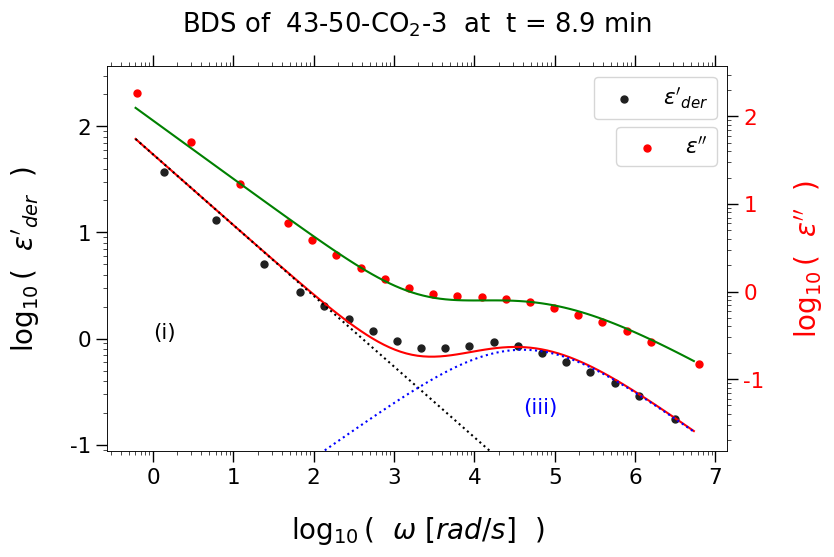

fit score 47531.0
fit parameters [262000.0, 0.6427, 3.294e-06, 3.029, 0.5312, 40000.0]


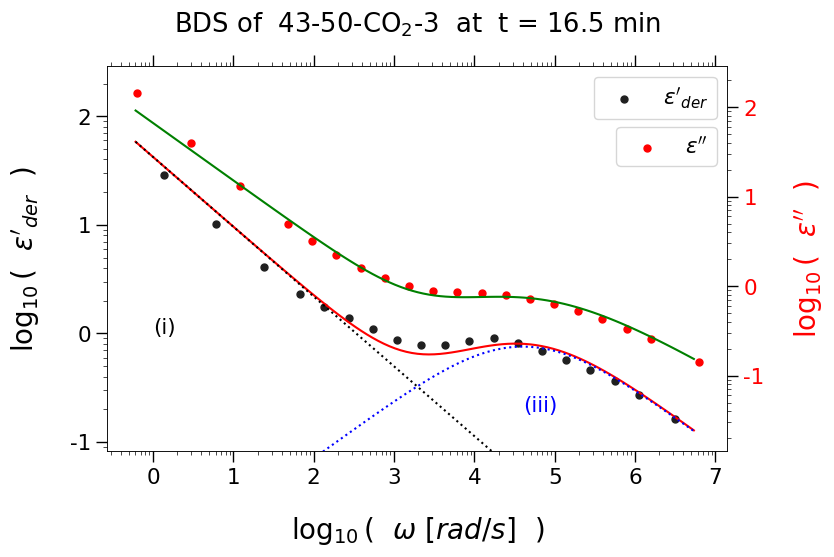

FALLBACK 1:  46619.0
FALLBACK 1:  45611.0
FALLBACK 1:  44028.0
FALLBACK 1:  43567.0
FALLBACK 1:  43190.0
FALLBACK 1:  45209.0
FALLBACK 1:  45740.0
FALLBACK 1:  46268.0
FALLBACK 1:  48095.0
fit score 48095.0
fit parameters [215000.0, 0.6319, 3.041e-06, 3.018, 0.5259, 40000.0]


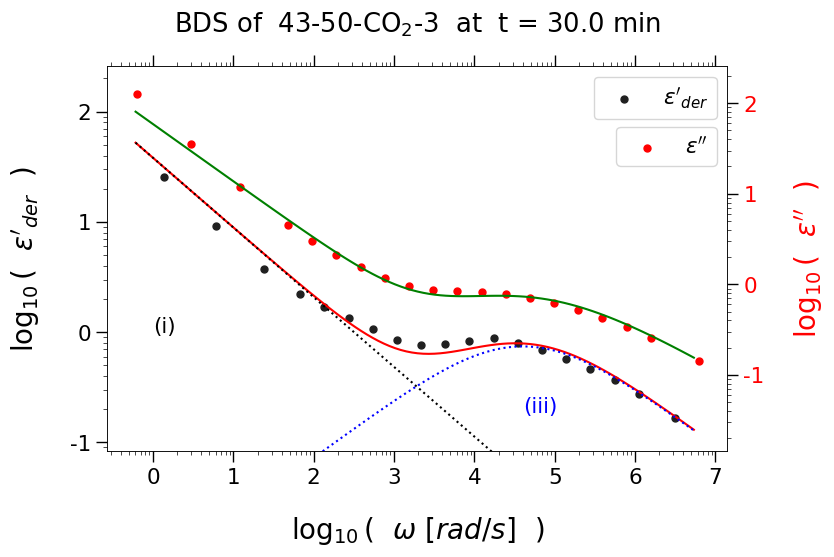

FALLBACK 1:  49060.0
FALLBACK 1:  49715.0
FALLBACK 1:  49413.0
FALLBACK 1:  48987.0
fit score 109615.0
fit parameters [283000.0, 0.6459, 3.45e-06, 3.148, 0.5155, 40000.0]


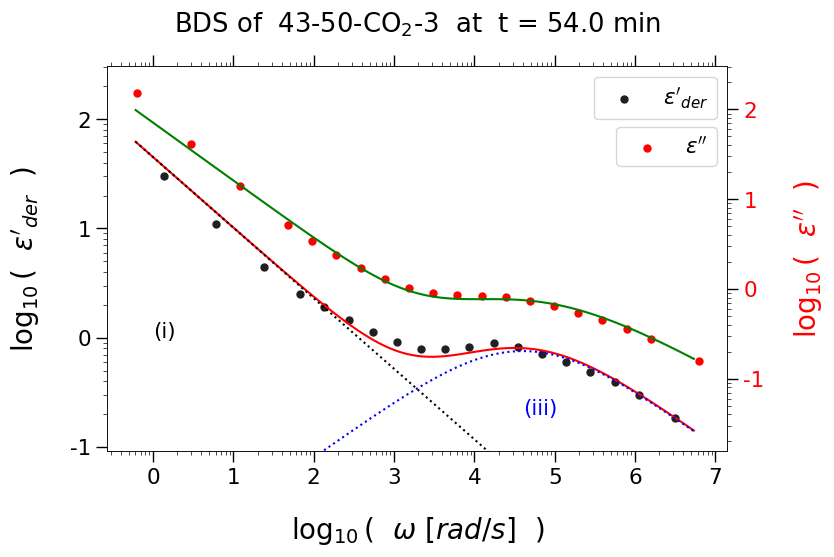

fit score 237403.0
fit parameters [433900.0, 0.6707, 3.804e-06, 3.245, 0.5091, 40000.0]


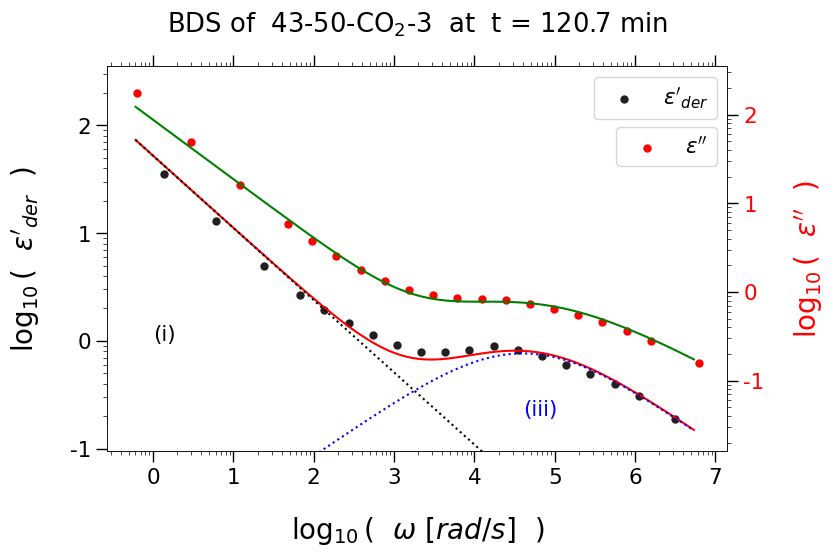

[2.0, 0.7, 0.1, 0.1, 0.5, 400000.0]
0 1 RuntimeError :  Optimal parameters not found: The maximum number of function evaluations is exceeded.


/tmp/ipykernel_114575/1076899024.py:7: RuntimeWarning: invalid value encountered in divide
  return -np.imag(de/den)


FALLBACK 1:  964.0
fit score 964.0
fit parameters [760.0, 0.2535, 2.259e-08, 0.5372, 0.7697, 40000.0]


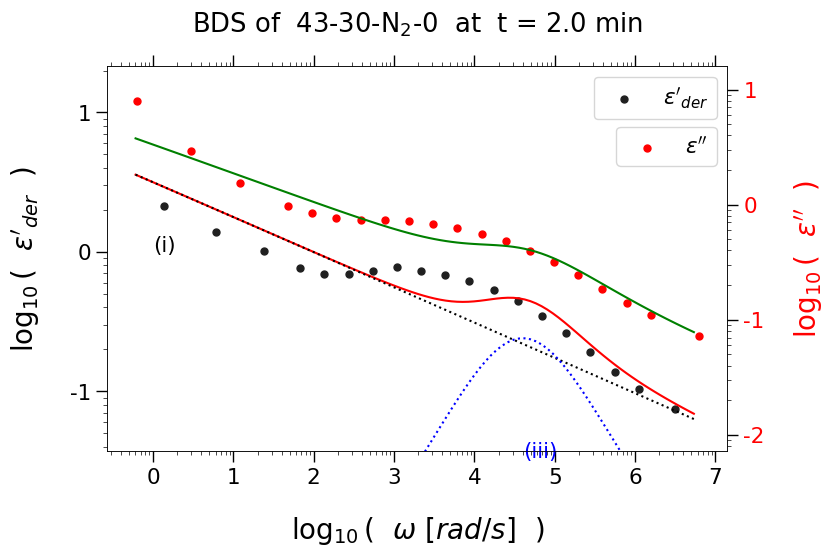

FALLBACK 1:  1051.0
fit score 1051.0
fit parameters [841.9, 0.2572, 2.099e-08, 0.5791, 0.7496, 40000.0]


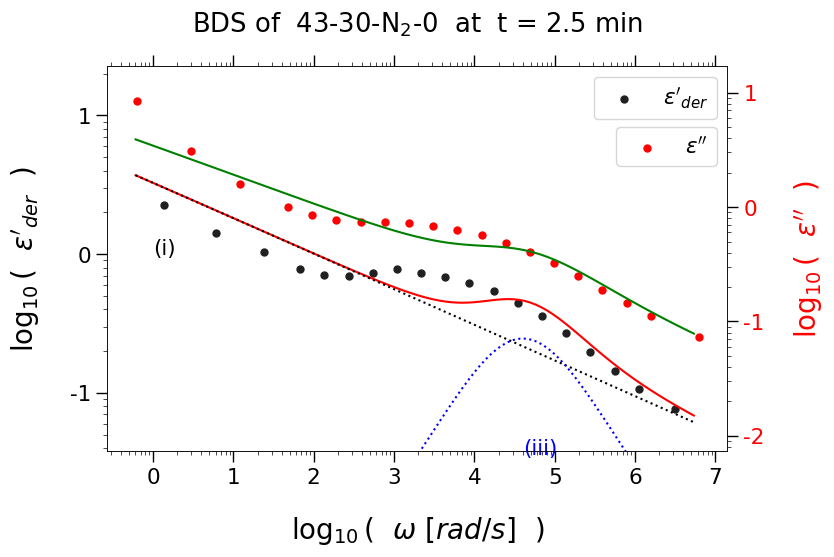

FALLBACK 1:  1115.0
fit score 1115.0
fit parameters [919.2, 0.2611, 2.109e-08, 0.619, 0.7309, 40000.0]


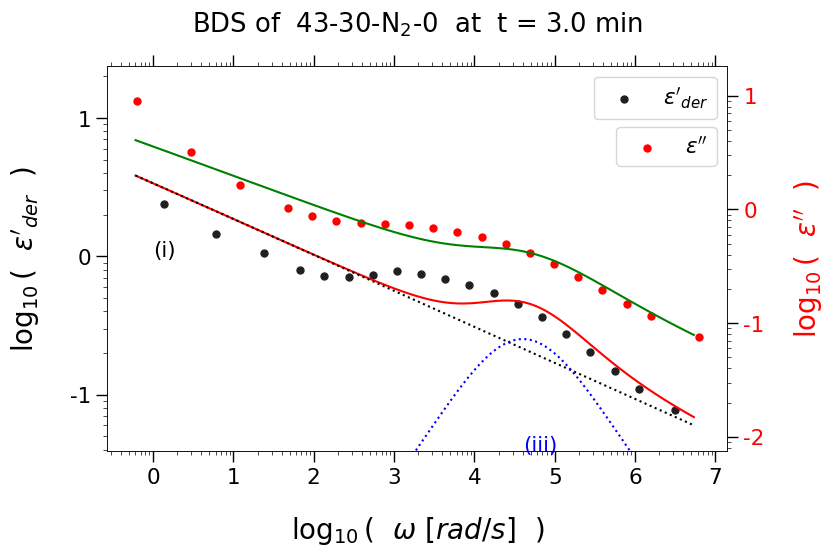

FALLBACK 1:  1195.0
FALLBACK 1:  1275.0
FALLBACK 1:  1336.0
FALLBACK 1:  1338.0
fit score 1338.0
fit parameters [1632.0, 0.2865, 1.901e-08, 0.8508, 0.6503, 40000.0]


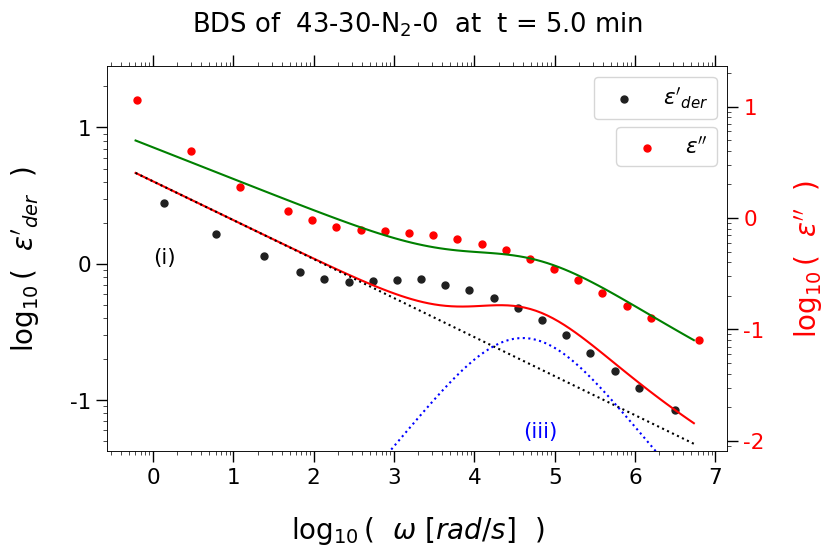

FALLBACK 1:  1354.0
FALLBACK 1:  1408.0
FALLBACK 1:  1403.0
FALLBACK 1:  1481.0
fit score 1482.0
fit parameters [3381.0, 0.3514, 1.395e-07, 1.315, 0.5726, 40000.0]


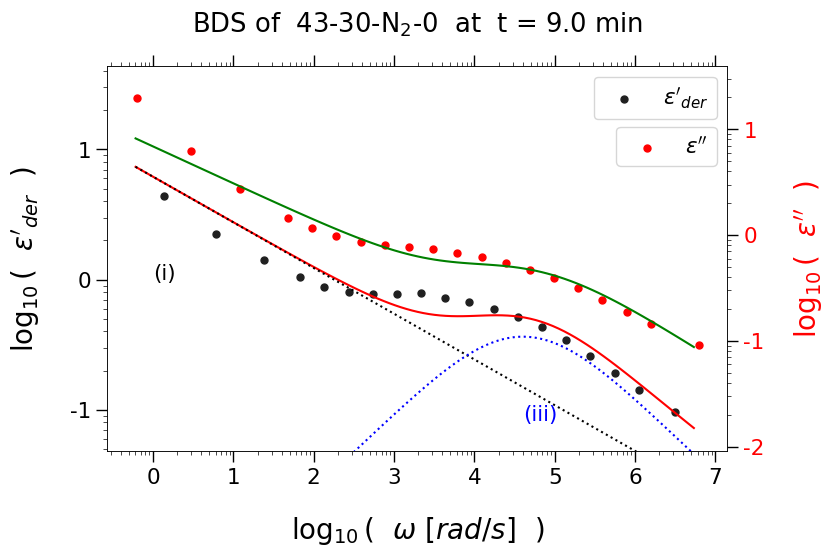

FALLBACK 1:  1576.0
FALLBACK 1:  1612.0
FALLBACK 1:  1622.0
FALLBACK 1:  1654.0
FALLBACK 1:  1714.0
FALLBACK 1:  1772.0
FALLBACK 1:  1816.0
FALLBACK 1:  1935.0
FALLBACK 1:  2008.0
FALLBACK 1:  2083.0
FALLBACK 1:  2394.0
fit score 2394.0
fit parameters [22980.0, 0.4801, 7.276e-07, 1.97, 0.5382, 40000.0]


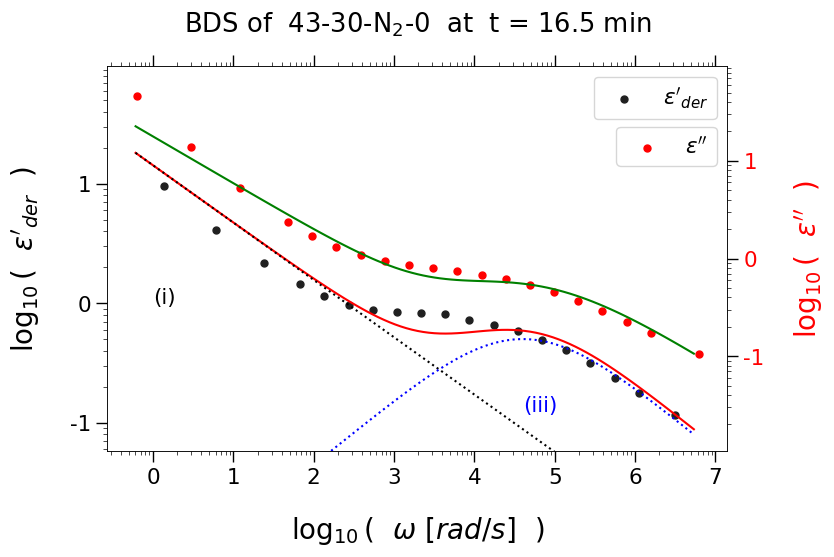

FALLBACK 1:  2482.0
FALLBACK 1:  2884.0
FALLBACK 1:  3372.0
FALLBACK 1:  4184.0
FALLBACK 1:  4424.0
FALLBACK 1:  5576.0
FALLBACK 1:  6221.0
FALLBACK 1:  6558.0
FALLBACK 1:  9349.0
FALLBACK 1:  9944.0
fit score 9944.0
fit parameters [142300.0, 0.5927, 2.282e-06, 2.534, 0.5269, 40000.0]


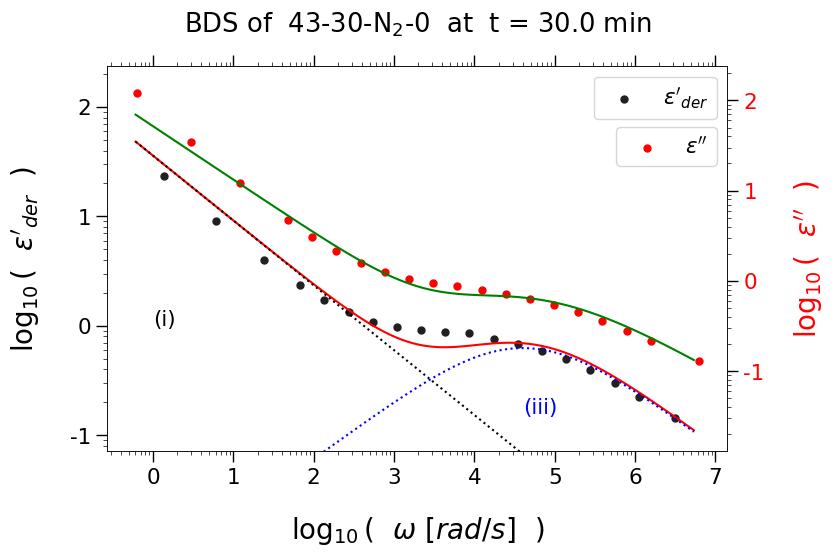

FALLBACK 1:  12297.0
FALLBACK 1:  12858.0
FALLBACK 1:  13418.0
FALLBACK 1:  13987.0
FALLBACK 1:  15506.0
FALLBACK 1:  19848.0
FALLBACK 1:  20958.0
FALLBACK 1:  22024.0
FALLBACK 1:  23186.0
FALLBACK 1:  24513.0
FALLBACK 1:  25855.0
FALLBACK 1:  27177.0
FALLBACK 1:  28455.0
FALLBACK 1:  29773.0
FALLBACK 1:  34124.0
FALLBACK 1:  37922.0
FALLBACK 1:  42462.0
fit score 99132.0
fit parameters [658800.0, 0.6719, 4.309e-06, 3.109, 0.5169, 40000.0]


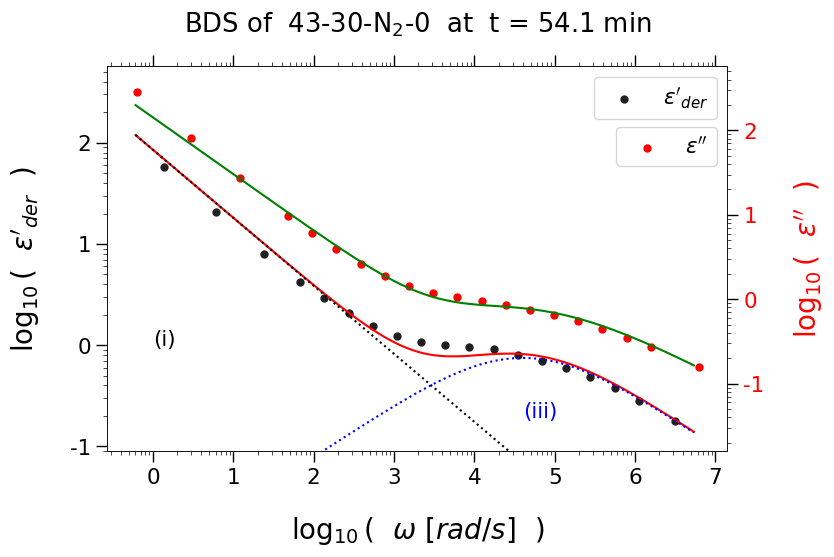

fit score 10943589.0
fit parameters [6201000.0, 0.7731, 9.32e-06, 3.932, 0.5048, 40000.0]


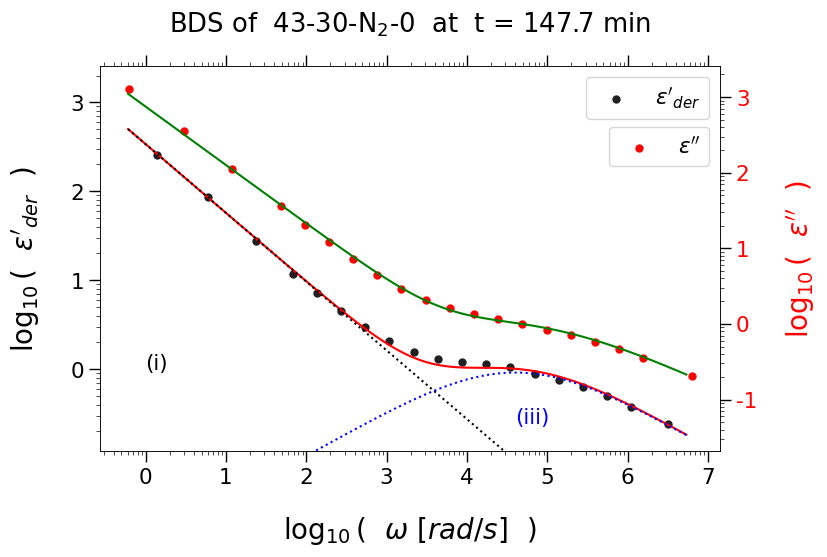

fit score 7765255.0
fit parameters [3050000.0, 0.7728, 2.119e-05, 3.931, 0.5, 40000.0]


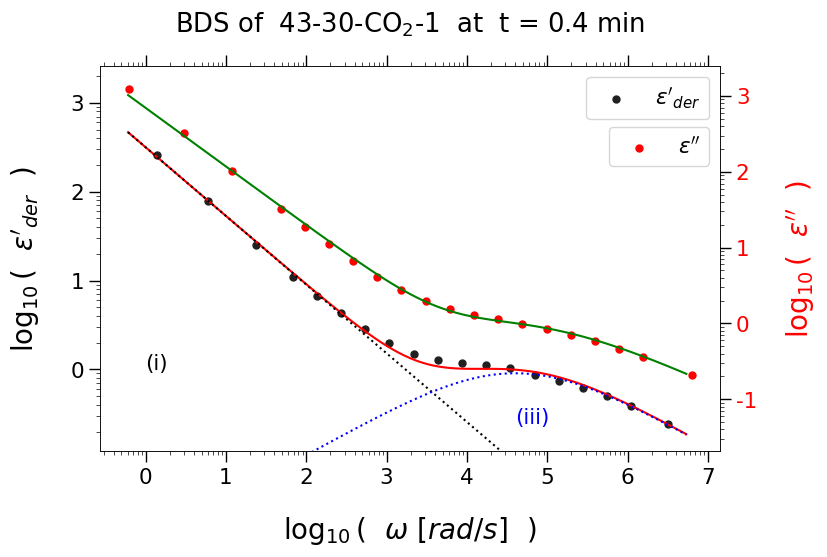

fit score 7382045.0
fit parameters [2865000.0, 0.7688, 1.992e-05, 3.878, 0.5032, 40000.0]


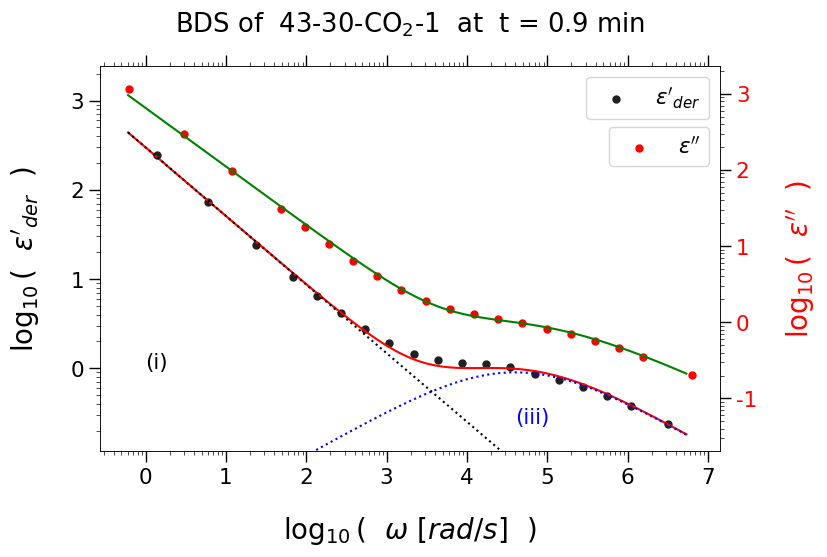

fit score 6927967.0
fit parameters [3153000.0, 0.761, 1.3e-05, 3.725, 0.5087, 40000.0]


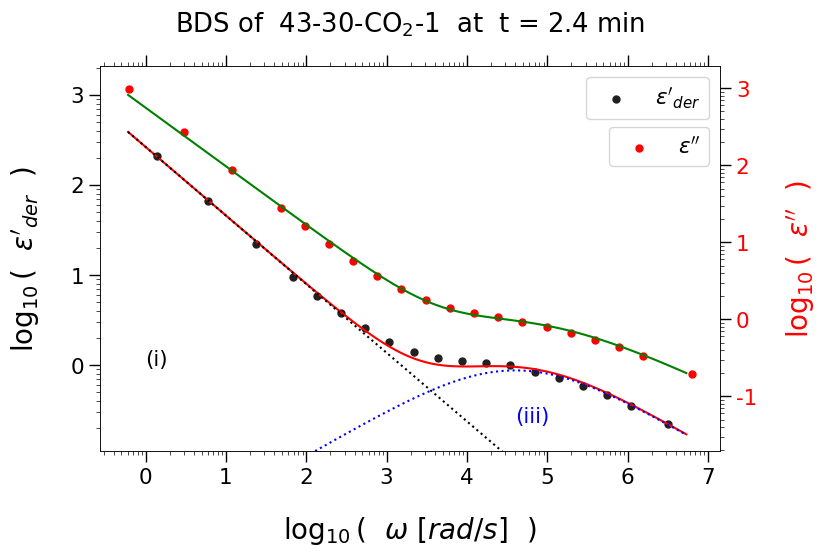

fit score 5259602.0
fit parameters [2861000.0, 0.7578, 1.199e-05, 3.639, 0.5128, 40000.0]


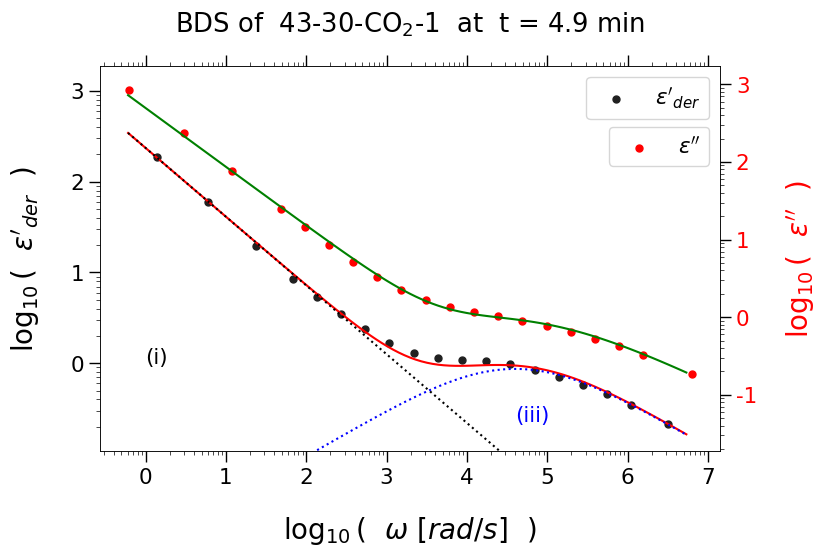

fit score 3221023.0
fit parameters [2476000.0, 0.7524, 1.1e-05, 3.54, 0.5178, 40000.0]


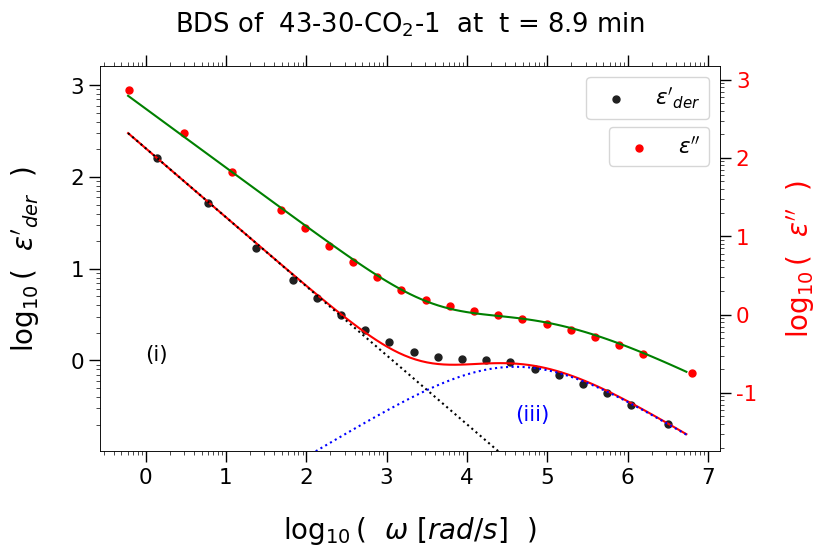

fit score 2215064.0
fit parameters [1977000.0, 0.7447, 1.049e-05, 3.426, 0.5223, 40000.0]


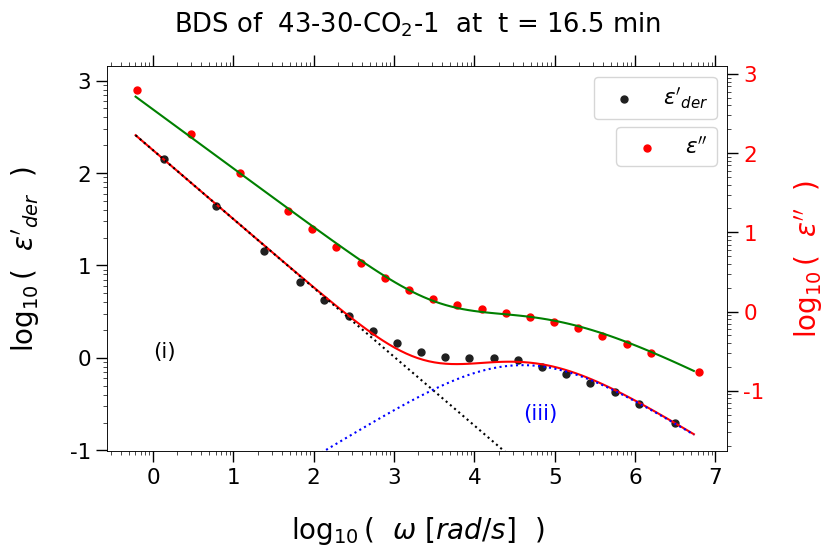

fit score 1484726.0
fit parameters [1493000.0, 0.7315, 9.484e-06, 3.358, 0.5224, 40000.0]


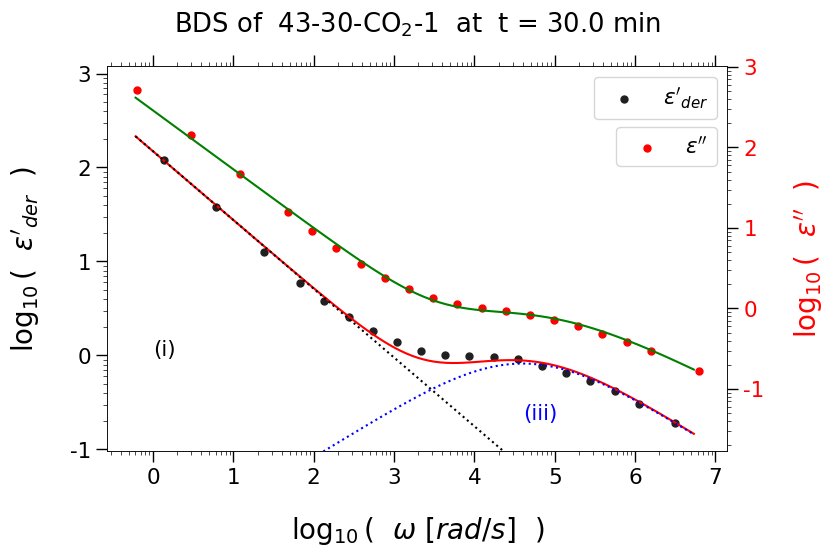

fit score 1800982.0
fit parameters [1209000.0, 0.7251, 1.071e-05, 3.402, 0.5177, 40000.0]


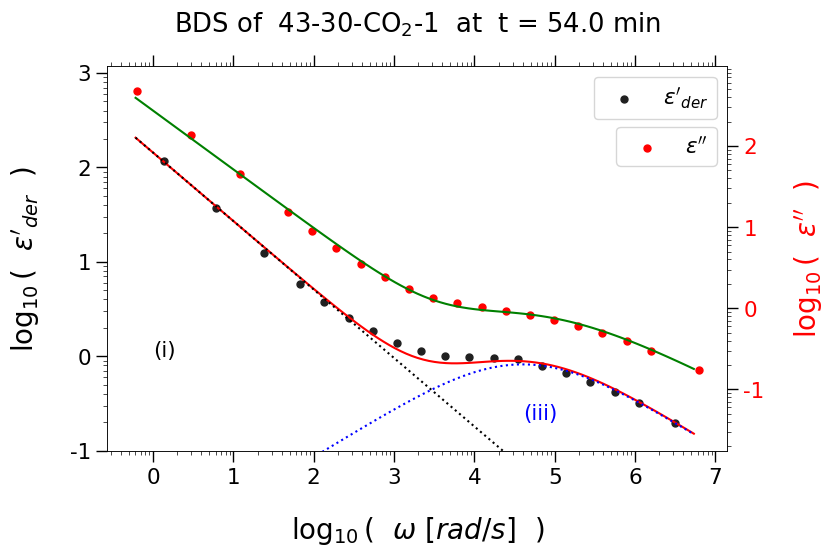

fit score 4880341.0
fit parameters [1556000.0, 0.7366, 1.257e-05, 3.557, 0.5117, 40000.0]


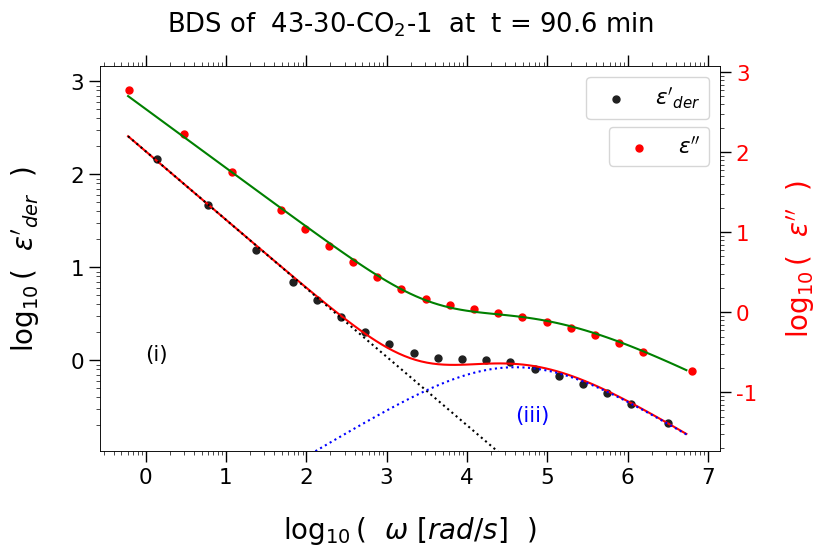

fit score 6300530.0
fit parameters [1337000.0, 0.7422, 1.764e-05, 3.575, 0.5121, 40000.0]


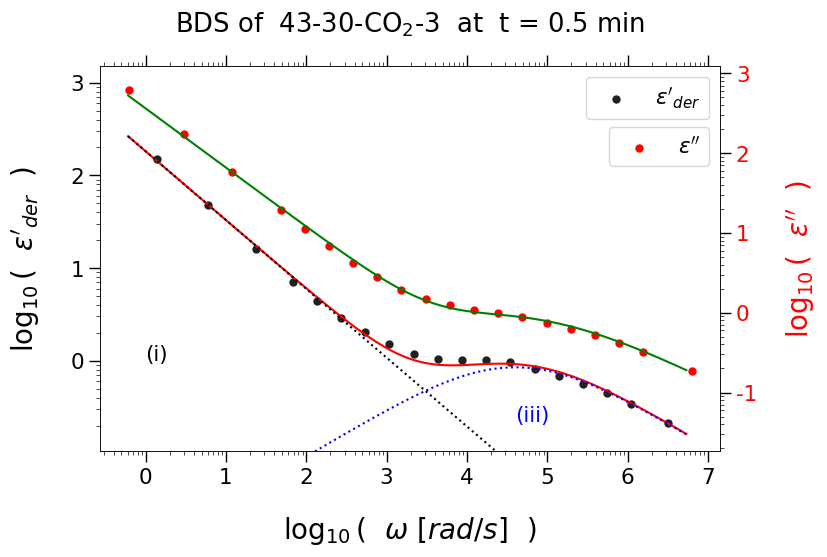

fit score 6499058.0
fit parameters [1444000.0, 0.7409, 1.522e-05, 3.55, 0.5132, 40000.0]


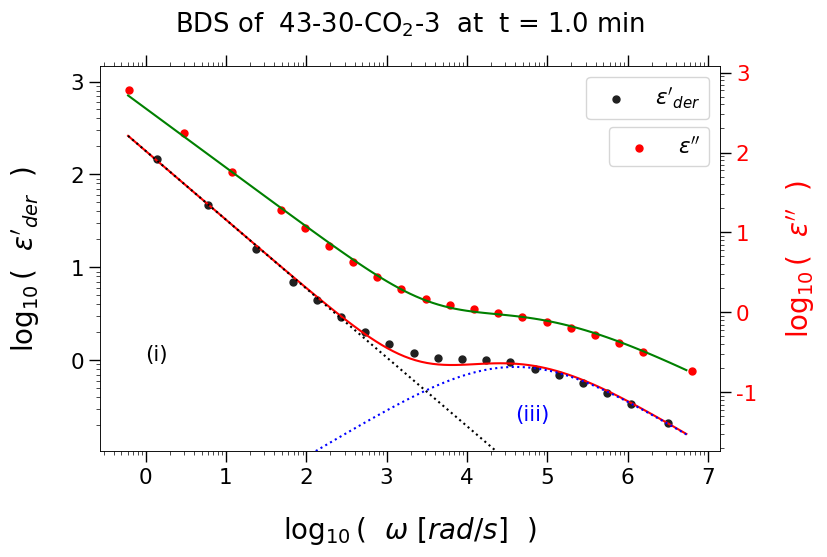

fit score 3991330.0
fit parameters [1392000.0, 0.7397, 1.435e-05, 3.492, 0.5158, 40000.0]


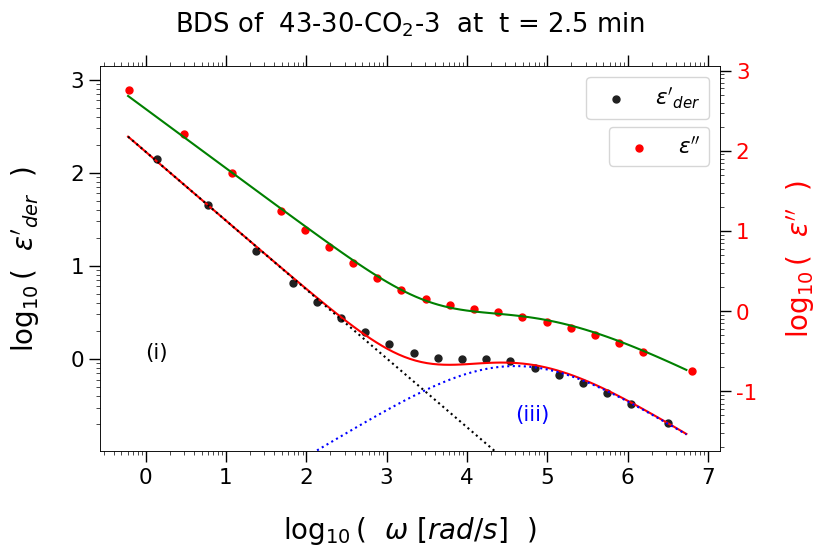

fit score 3330595.0
fit parameters [1260000.0, 0.7357, 1.377e-05, 3.417, 0.5199, 40000.0]


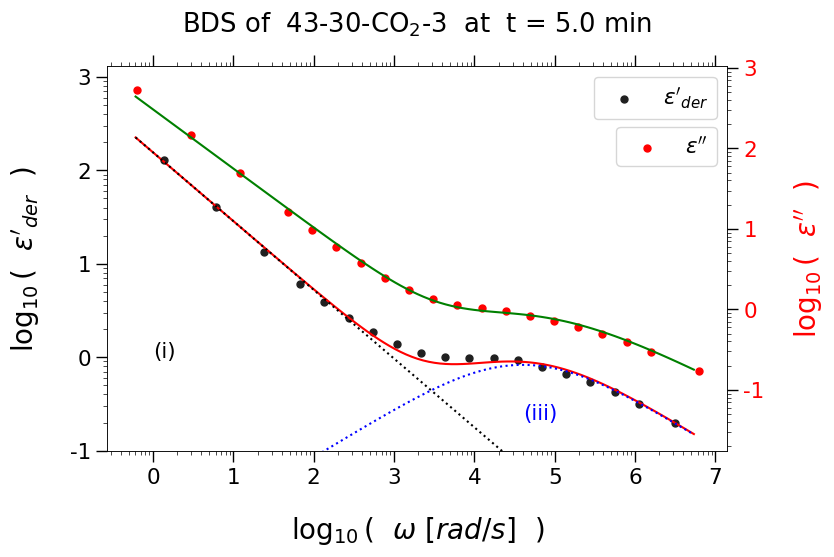

fit score 2022078.0
fit parameters [1118000.0, 0.7306, 1.298e-05, 3.339, 0.5242, 40000.0]


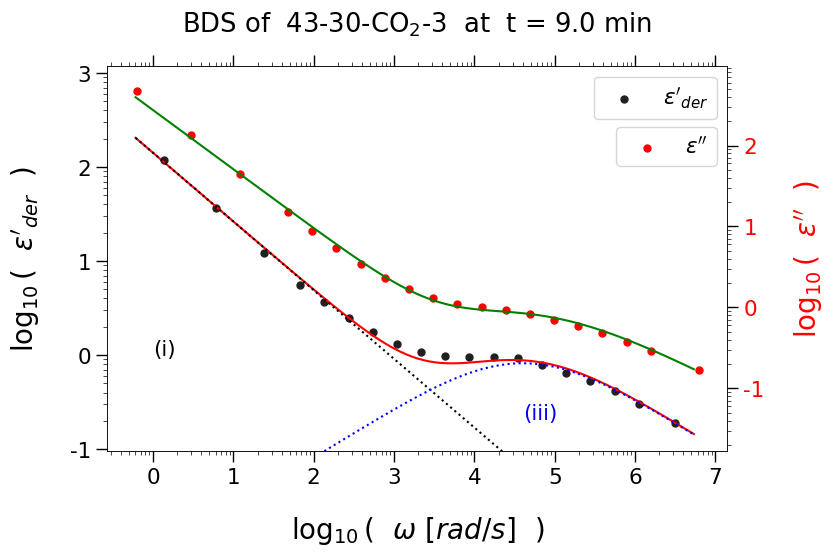

fit score 1041145.0
fit parameters [956300.0, 0.7228, 1.179e-05, 3.262, 0.5268, 40000.0]


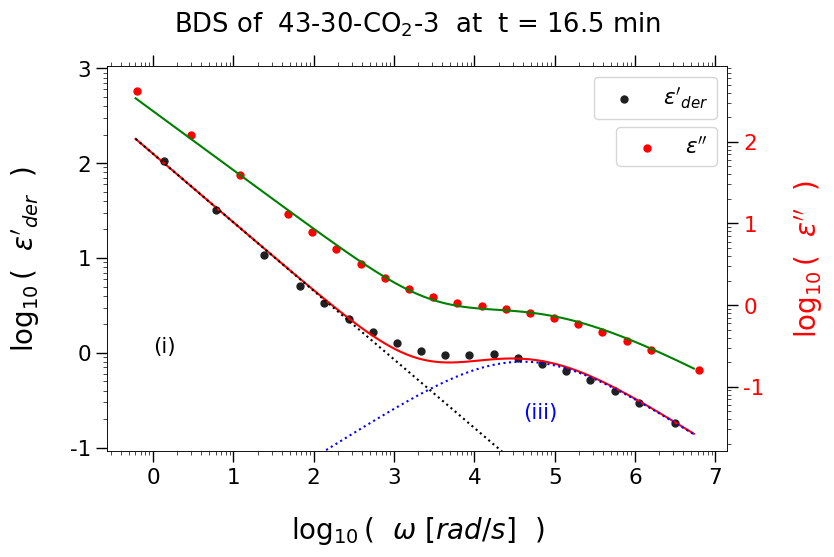

fit score 1049424.0
fit parameters [927000.0, 0.7151, 9.443e-06, 3.234, 0.5254, 40000.0]


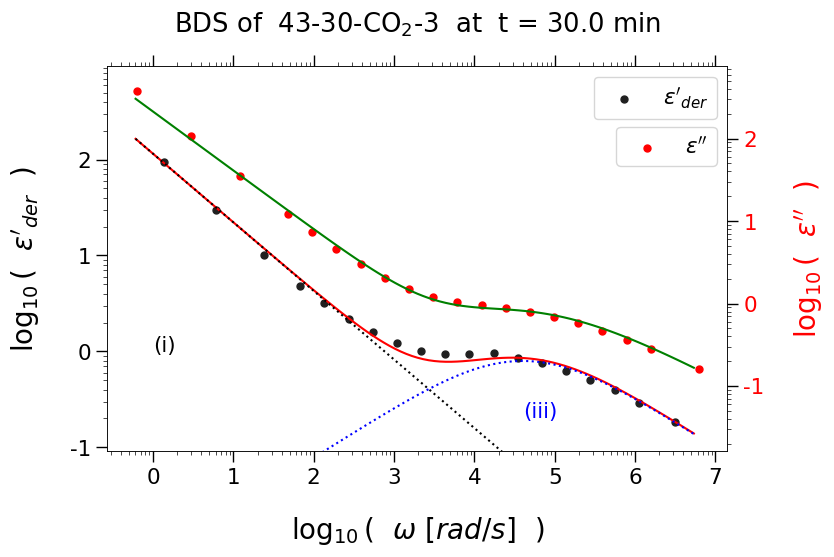

fit score 1579469.0
fit parameters [927600.0, 0.7148, 1.013e-05, 3.326, 0.519, 40000.0]


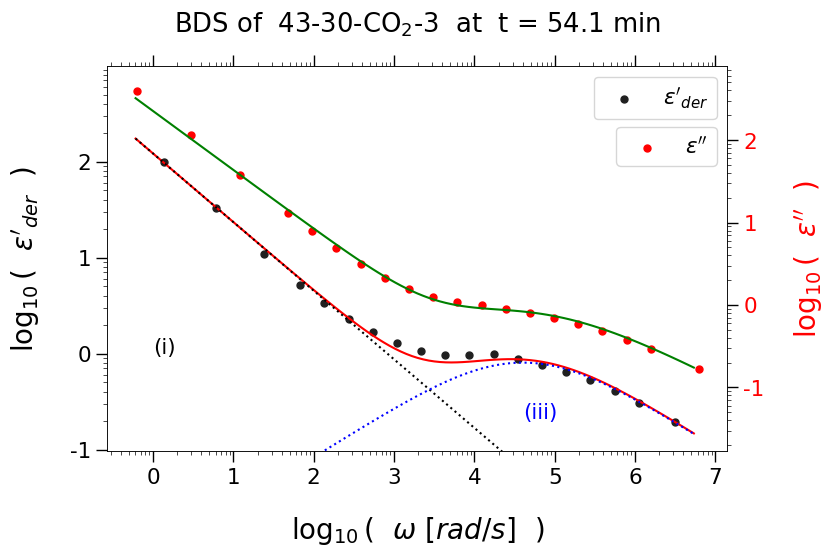

fit score 3537731.0
fit parameters [975100.0, 0.7287, 1.734e-05, 3.506, 0.5139, 40000.0]


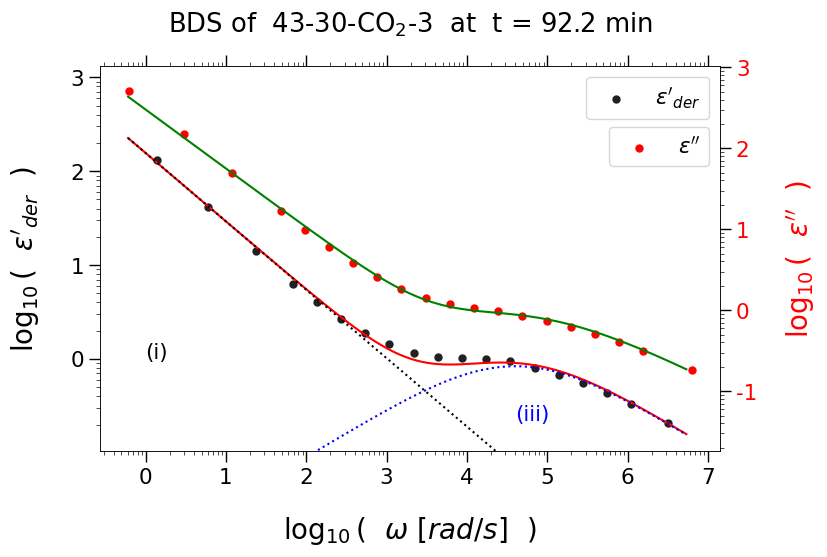

fit score 4257106.0
fit parameters [1001000.0, 0.7338, 1.916e-05, 3.552, 0.5135, 40000.0]


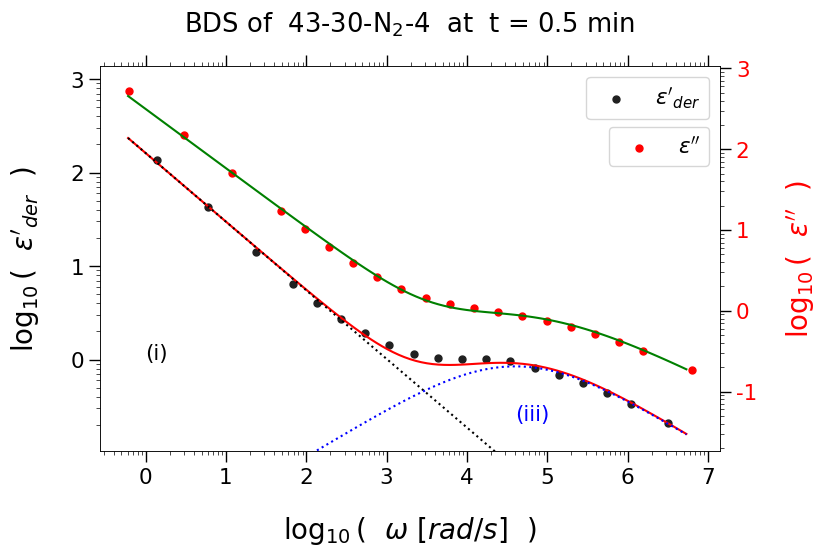

fit score 4521274.0
fit parameters [1068000.0, 0.7328, 1.701e-05, 3.525, 0.5141, 40000.0]


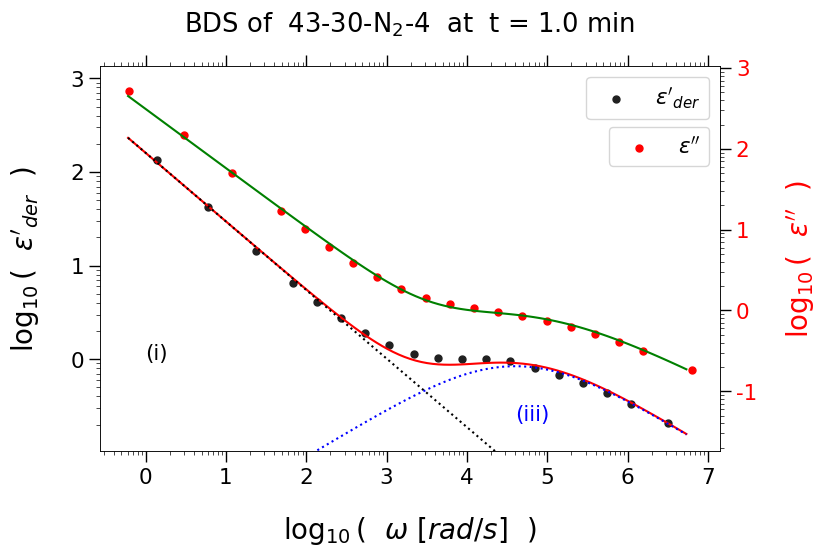

fit score 3072564.0
fit parameters [1033000.0, 0.7339, 1.657e-05, 3.467, 0.5163, 40000.0]


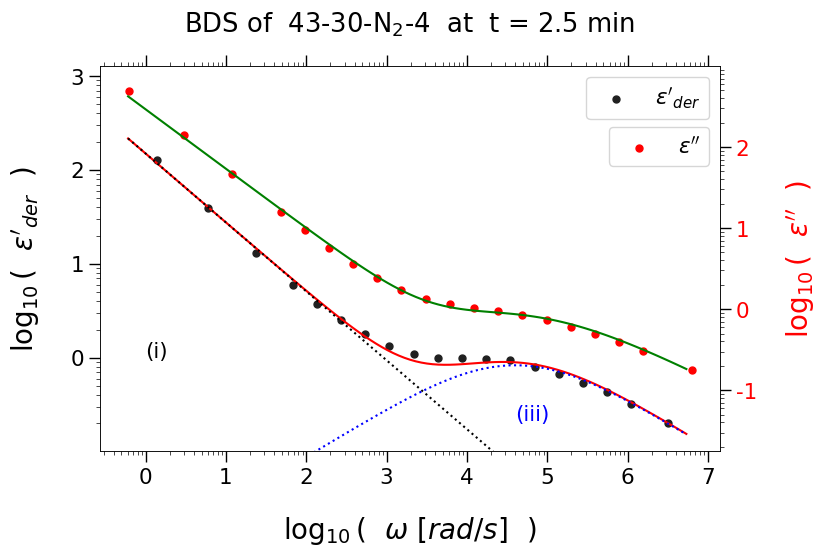

fit score 1788012.0
fit parameters [921300.0, 0.7286, 1.521e-05, 3.376, 0.5209, 40000.0]


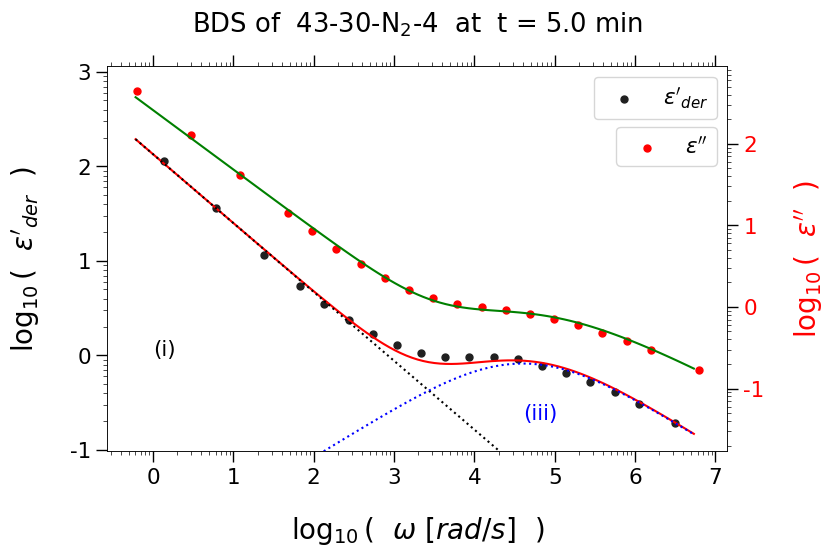

fit score 1211760.0
fit parameters [844100.0, 0.7219, 1.285e-05, 3.272, 0.5259, 40000.0]


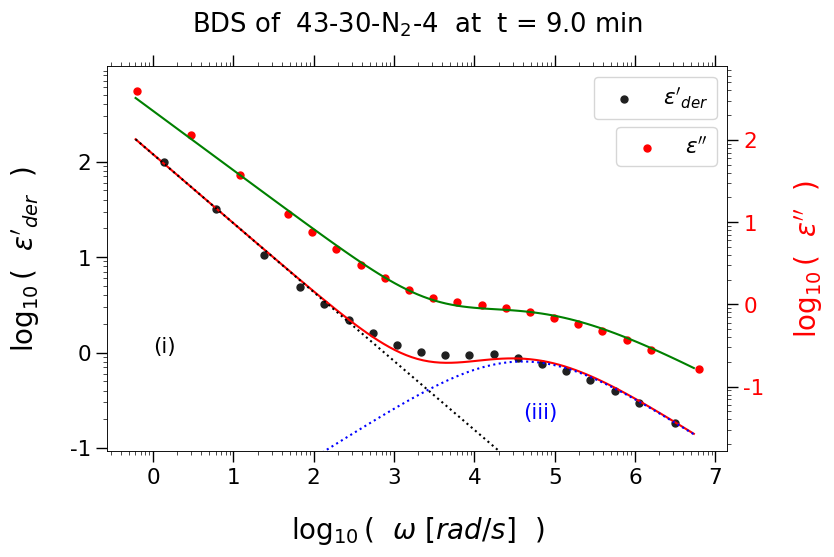

fit score 733445.0
fit parameters [752200.0, 0.7138, 1.071e-05, 3.184, 0.5298, 40000.0]


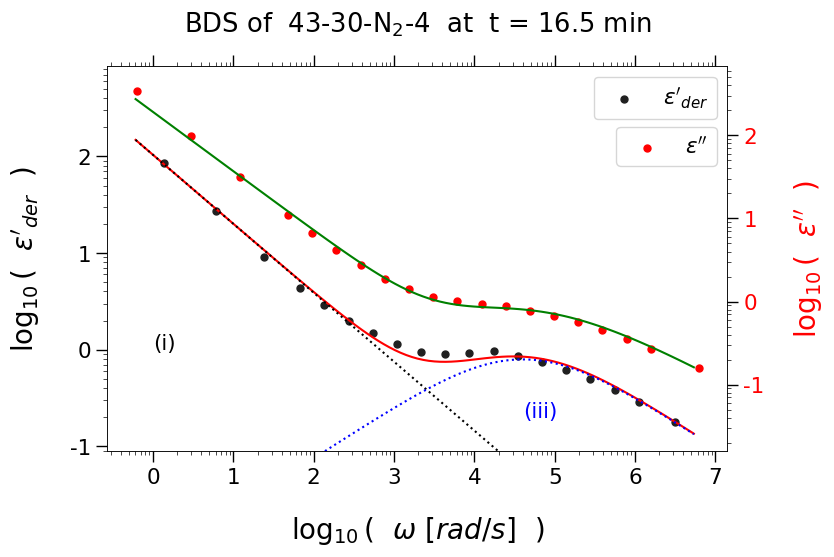

fit score 604546.0
fit parameters [670900.0, 0.7047, 9.245e-06, 3.177, 0.5277, 40000.0]


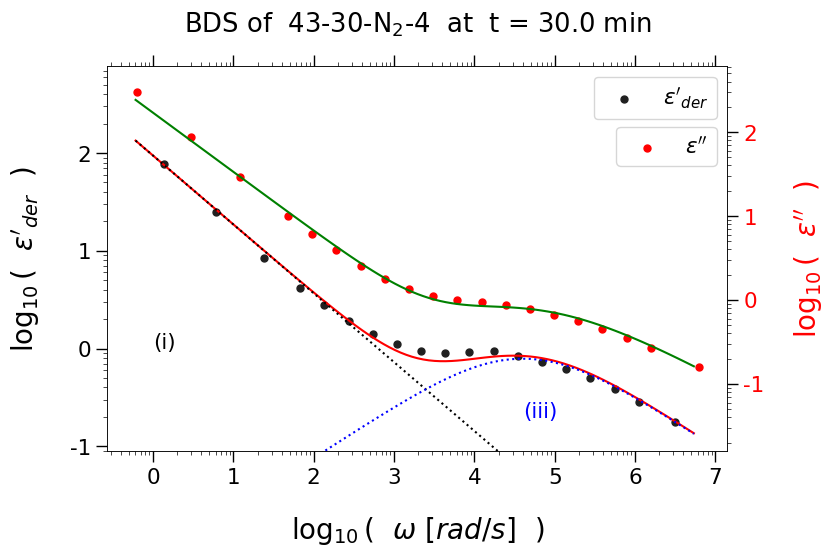

fit score 1402960.0
fit parameters [794800.0, 0.7111, 1.012e-05, 3.301, 0.5207, 40000.0]


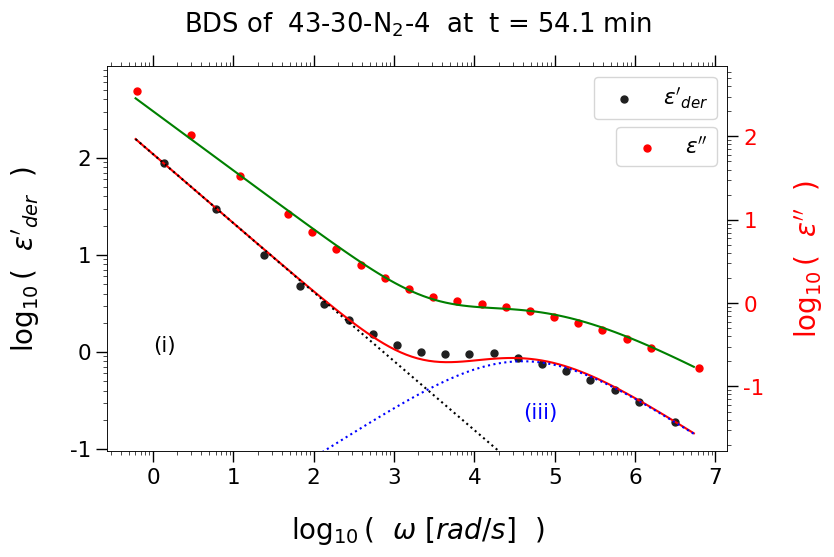

fit score 2269215.0
fit parameters [1465000.0, 0.7508, 2.422e-05, 3.686, 0.5121, 40000.0]


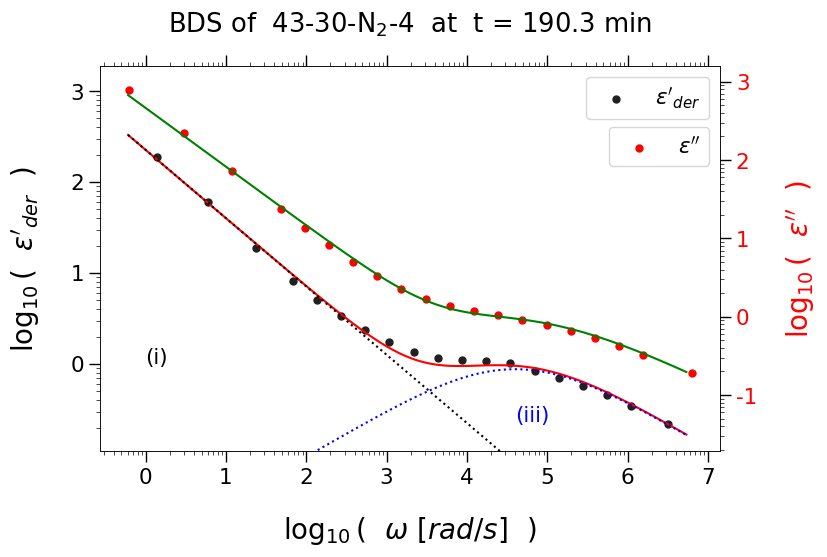

In [6]:
### main

# selection of a few indices where the plot is shown; quadratic: show many at the start and less later
plotI = np.linspace(0,4,8)
plottimes = np.exp( plotI )-1
plottimes = np.append(plottimes, [1e5, 1e5])
# ignore last tol minutes of each run to avoid faulty data from next run
tol = 5

# combined lists that save the fit data, will contain numpy arrays of different length, one array per run
P_ALL = []
DT_ALL = []
A_ALL = []
# save ID for easier handling, P_ALL[j] will correspond to ID[j]
# ID is temperature-gas-run ie. "70-N_2-1", as shown in plots
ID = []

# go throgh all temperatures, or rather their respective datasets
for m, data in enumerate(DATA) :
    temp = str(TEMPS[m])

    # f is an array of the unique frequencies
    # er_der is a 2D array of all "numerical derivative of real part"-values
    # er_der[i] / ei[i] (one row of the matrix) is one spectrum
    # where i corresponds to the time
    # ei[:,k] (one column) is the time evolution at a fixed frequency
    # The array contains one whole measurement with fixed temperature and all gas runs
    f, lnw_der, er_der, ei, t = extract_interpolate_and_derivative(data)
    ln_er_der = np.log(er_der)
    w = 2*np.pi*f
    lnw = np.log(w)
    w_der = np.exp(lnw_der)
    
    # go throgh all runs, one run starts with change of gas
    for j, t0 in enumerate(GASCHANGE[m][:-1]) :
        if temp+'-'+str(j) in id_out :
            continue
        gas = GASES[S[m][j]]
        ID.append(temp+'-'+gas+'-'+str(j))
        run_num = len(ID) - 1

        t1 = GASCHANGE[m][j+1]-tol
        # indices of start/end of current run
        t0_i = np.searchsorted(t, t0, side="left")
        t1_i = np.searchsorted(t, t1, side="right")

        p0 = p0_start[run_num]
        # stack of numpy arrays of all fit parameters of current run: [ [a,b,c,...], [a,b,c,...], ... ]
        PARAMS = []
        # stack of times; needed because fit doesn't always converge. DT[i] corresponds to PARAMS[i]
        DT = []
        A = []

        plot_i = 0
        for i in range(t0_i, t1_i) :
            # time relative to change of gas (=start of current run)
            dt = t[i]-t0

            # if the fit converged, p0 (next initial guess) will be the optimal parameters   
            p0, a, fitscore = fit(lnw_der[i], ln_er_der[i], lnw, np.log(ei[i]), p0, run_num)
            #p0 = fixorder(p0)

            if fitscore > 50:#17000 :
                # save fit parameters and time if the fit was successful
                PARAMS.append(p0)
                A.append(a)
                DT.append(dt)

                # plot a small selection of spectra
                if dt > plottimes[plot_i] or i==t1_i-1 :
                    plot(w_der[i], er_der[i], w, ei[i], p0, dt, run_num, ID[-1], fitscore)
                    plot_i += 1


        # after processing whole run: save all the fit data of the run in big combined list
        # swap axes of PARAMS, such that the colums-rows are times-fit parameters
        P = np.swapaxes(PARAMS, 0, 1)
        P_ALL.append(P)
        DT_ALL.append(np.array(DT))
        A_ALL.append(np.array(A))

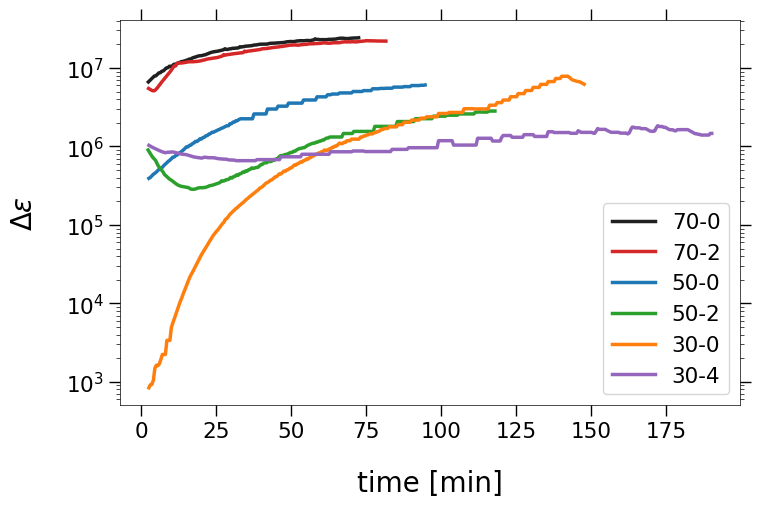

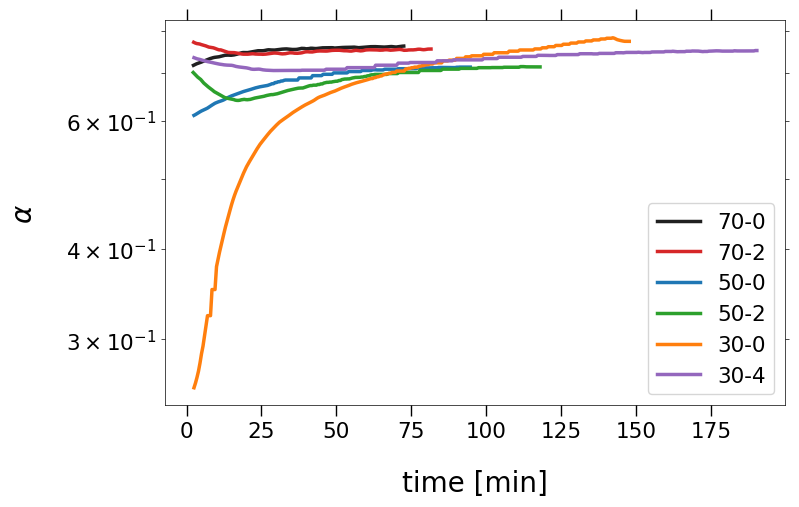

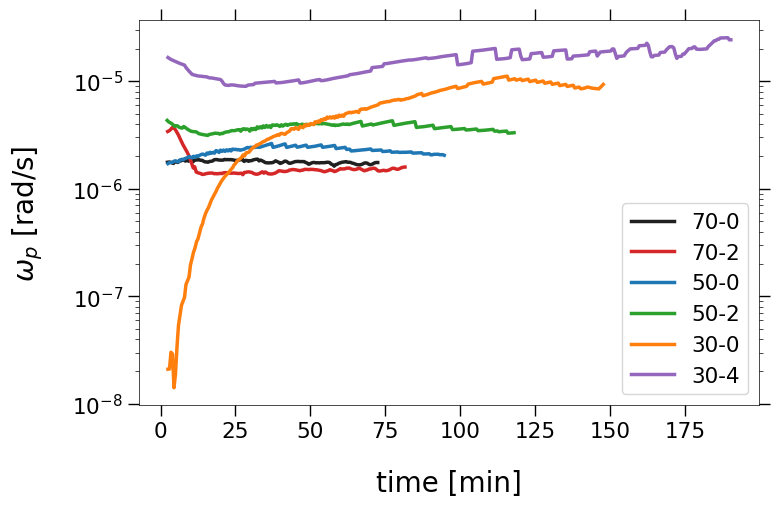

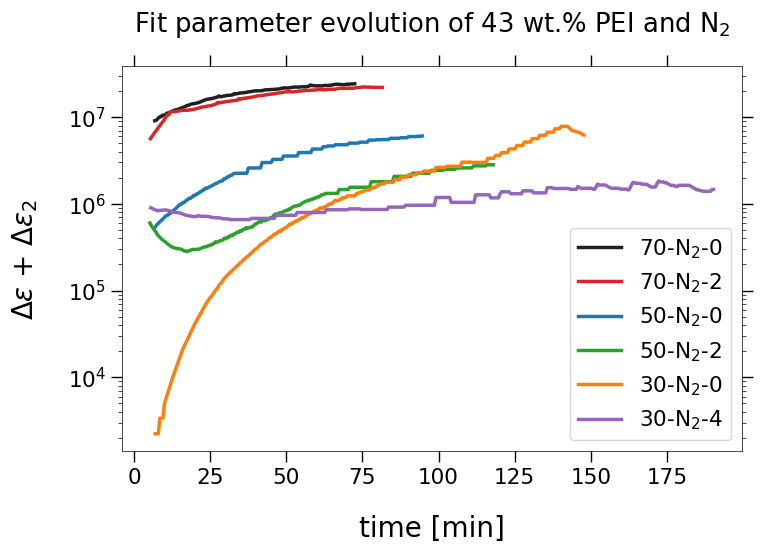

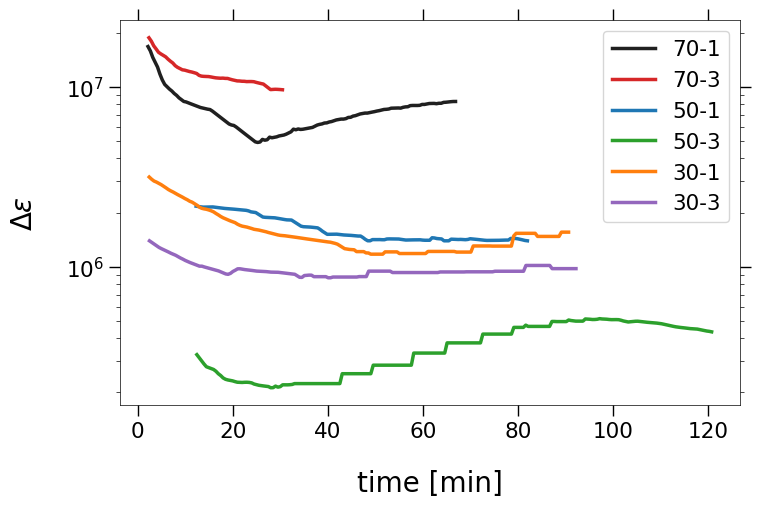

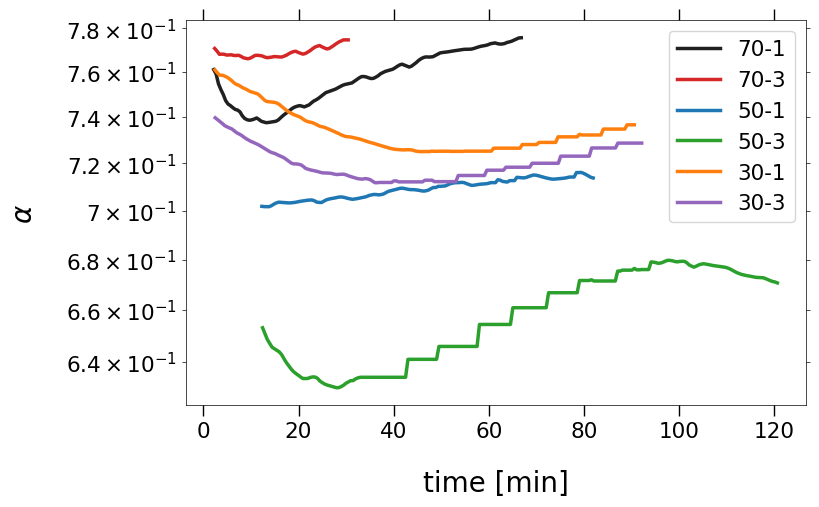

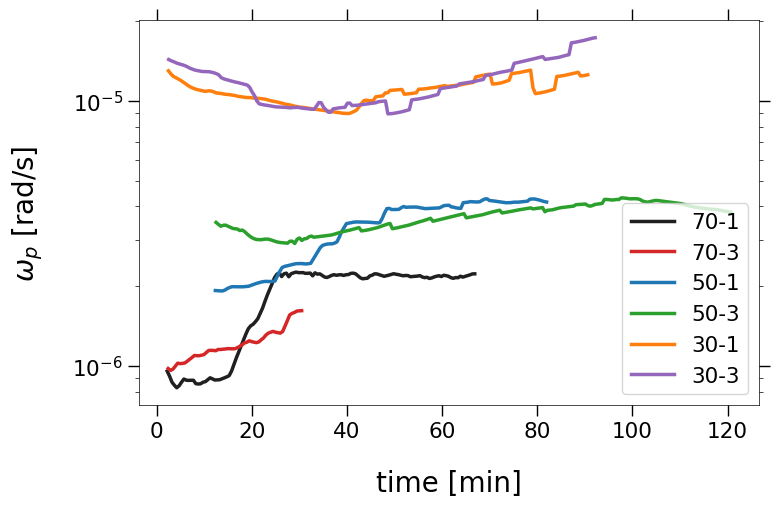

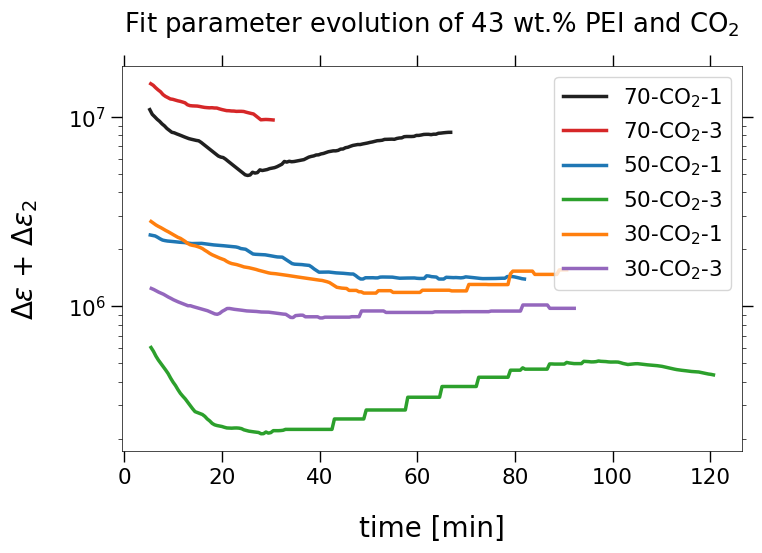

In [7]:
### Plot time evolution of fit parameters

title_text = "Fit parameter evolution of "+ SAMPLE + " and "

good = [DT_ALL[j] > 2 for j in range(len(DT_ALL))]
DT_ALL_ = [DT_ALL[j][good[j]] for j in range(len(DT_ALL))]
P_ALL_ = [P_ALL[j][:, good[j].flatten()] for j in range(len(DT_ALL))]

# j: run with specific temp and gas
# i: parameters

for gas in GASES :
    for i, parameter in enumerate(p_labels[:-3]) :
        plt.xscale('linear')
        plt.yscale('log')

        #l, u = 1e50, -1

        for j, id in enumerate(ID) :
            if id[3] != gas[0] :#or (id[0]=='3' and id[-1]=='0') :
                continue
            if id[3] == "C" and id[0] == "5":
                n = 20
            else :
                n = 0
            #if id[0] == "7" and id[-1] == "2" :
            #    continue
            label = id[:2] + id[-2:]

            x, y = DT_ALL_[j][n:], P_ALL_[j][i][n:]
            #lower_threshold, upper_threshold = np.percentile(y, [5, 95])
            #l, u = min(lower_threshold, l), max(upper_threshold, u)

            plt.plot(x, y, label=label, lw=2.5)
            #plt.title(title_text + gas)

        plt.xlabel("time [min]")
        plt.ylabel(parameter)
        plt.legend()
        #plt.savefig(results_folder + "/param/"+gas+" "+p_file_labels[i]+".pdf", bbox_inches='tight')
        plt.show()

    plt.xscale('linear')
    plt.yscale('log')

    for j, id in enumerate(ID) :
        if id[3] != gas[0] :#or (id[0]=='3' and id[-1]=='0') :
            continue
        de_sum = P_ALL[j][0] + P_ALL[j][3]
        plt.plot(DT_ALL[j][10:], de_sum[10:], label=id, lw=2.5)
        plt.title(title_text + gas)

    plt.xlabel("time [min]")
    plt.ylabel(p_labels[0] + " + " + p_labels[3])
    plt.legend()
    plt.show()

[1432400.0, 12.224, 26696000.0, 33.236, -22694000.0]
[1558500.0, 1.471, 25147000.0, 40.201, -20743000.0]


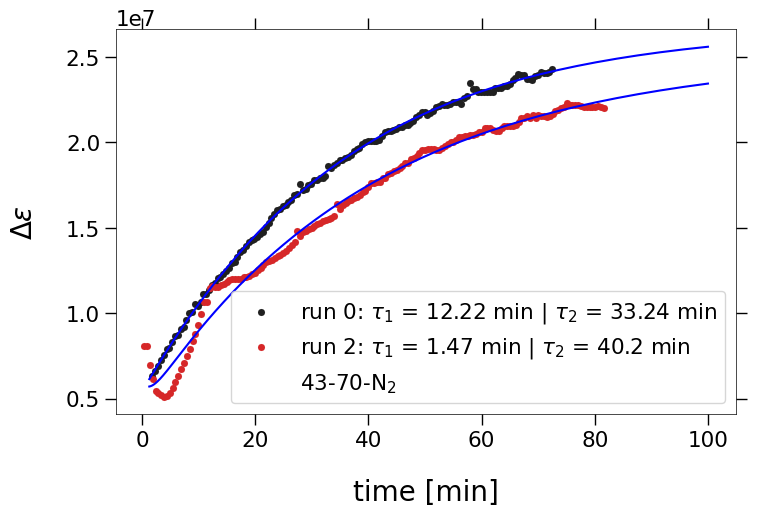

[4289200.0, 19.992, 8987000.0, 63.733, -12788000.0]
[-13342000000.0, 630680.0, 13342000000.0]


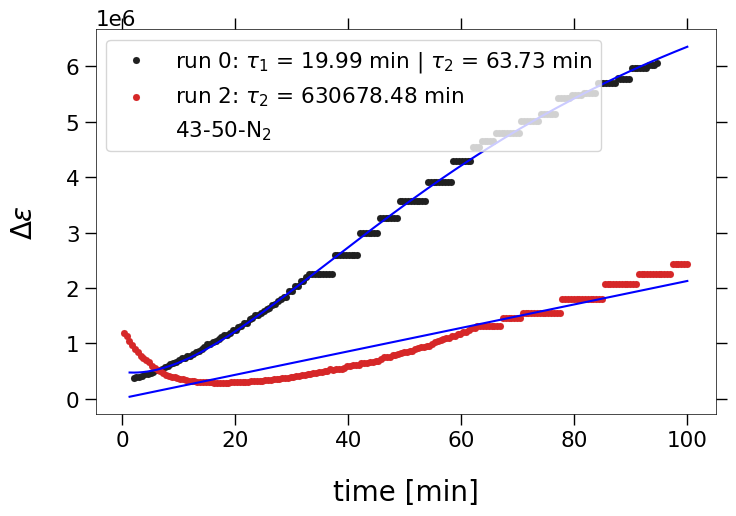

[1014400.0, 20.0, 1510300.0, 97.329, -1435200.0]


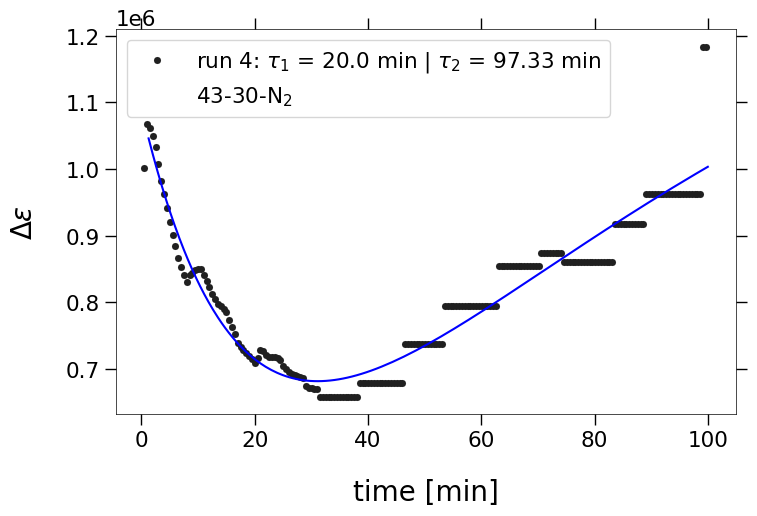

[-0.040119, 11.339, 0.76593, 63.121, -0.017134]
[9.2824, 15.704, 0.75552, 15.8, -9.2524]


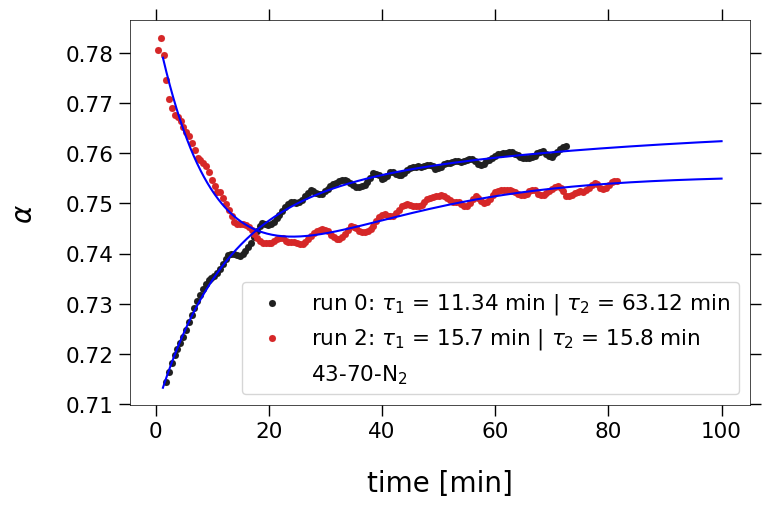

[0.1297, 20.0, 0.71568, 23.102, -0.2444]
RuntimeError :  Optimal parameters not found: The maximum number of function evaluations is exceeded.


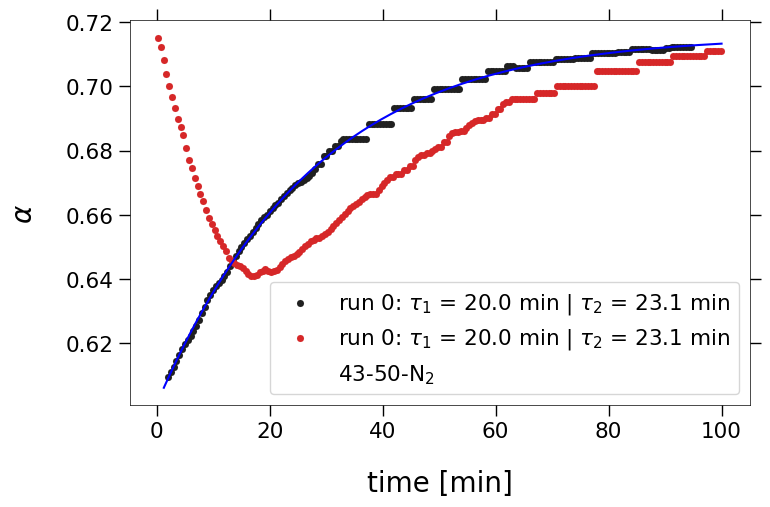

[0.072812, 20.0, 0.9109, 323.45, -0.243]


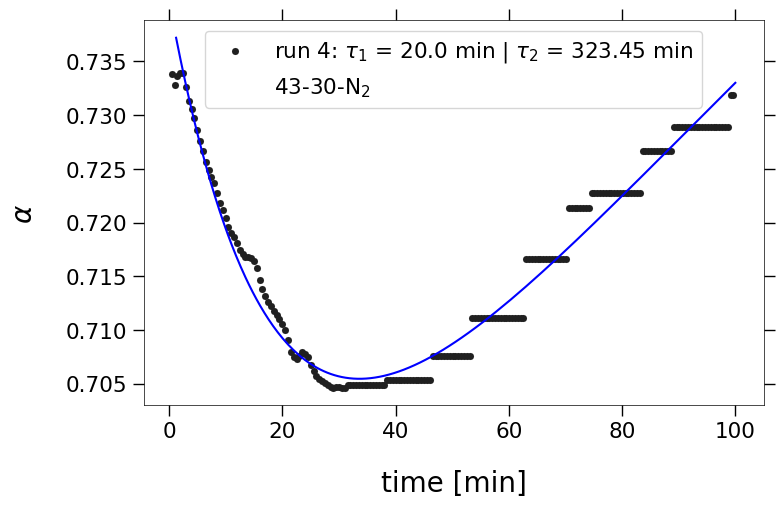

[1.7767e-06, 833640000.0, 2.5172e-09]
[1.6393e-06, 399320000.0, 6.9649e-10]


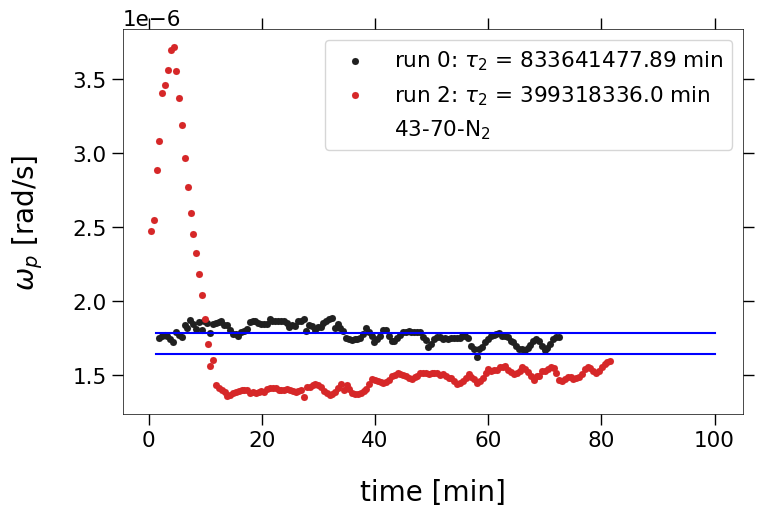

[-0.13834, 97897000.0, 0.13834]
[-0.12148, 38470000.0, 0.12148]


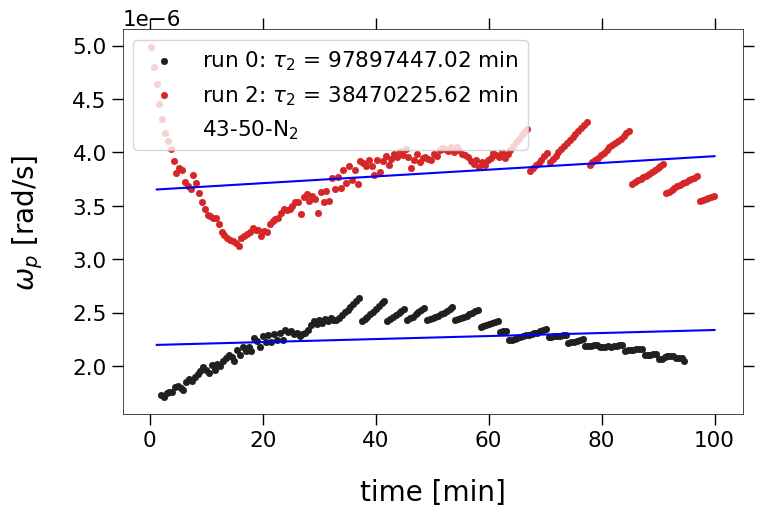

[-0.12294, 2551100.0, 0.12295]


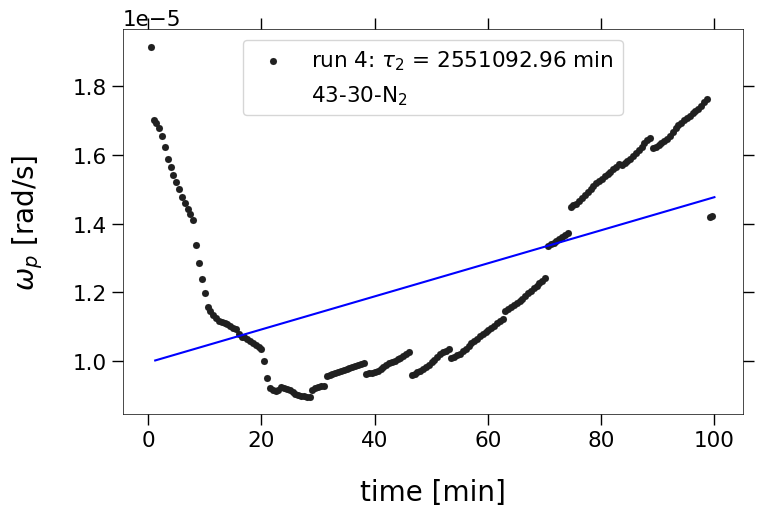

[-0.079419, 5.4788, 3.5479]
[-0.33773, 5.6952, 4.0205]


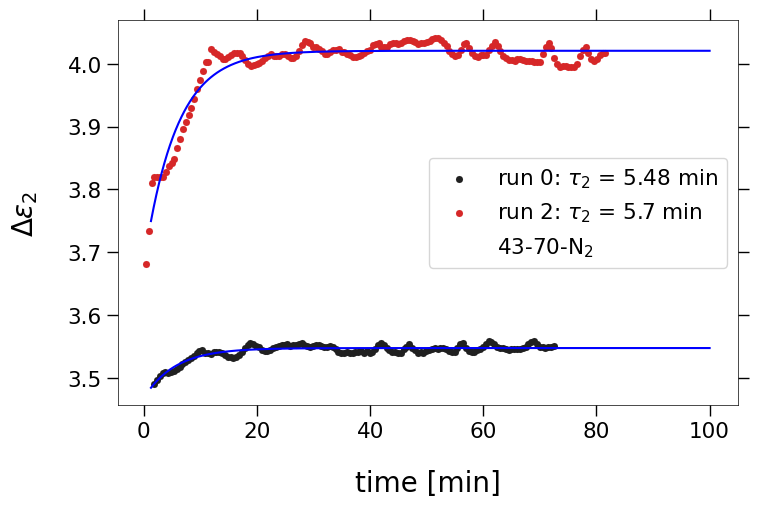

[0.35156, 20.0, 4.8726, 26.271, -1.7161]
[1.2349, 8.5759, 4.0547, 43.341, -1.6135]


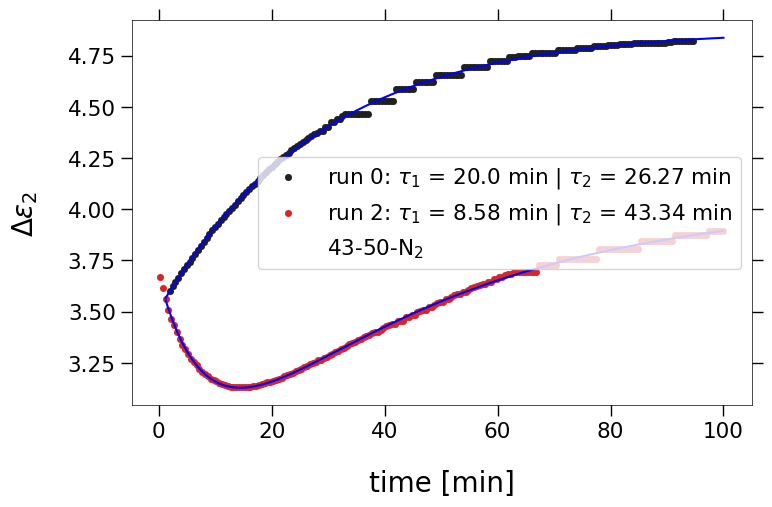

[0.74146, 12.531, 4.0975, 124.55, -1.2693]


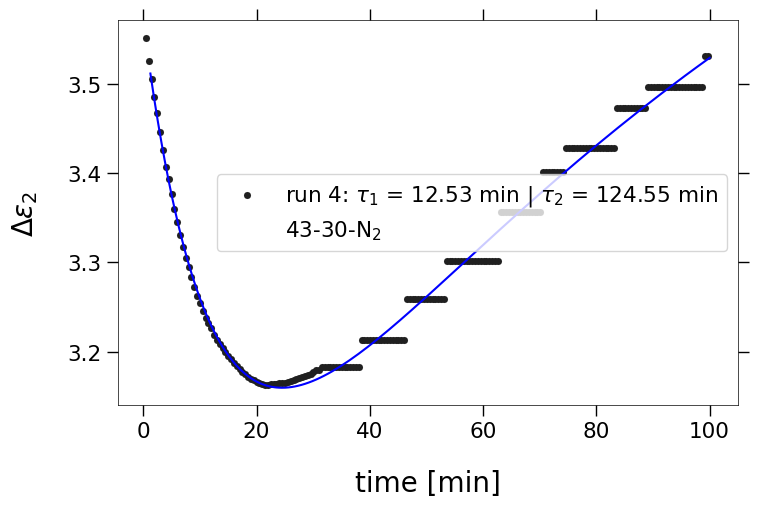

[19606000.0, 3.5473, 6722700.0]
[17019000.0, 1.5997, 9297300.0, 12.694, 7179600.0]


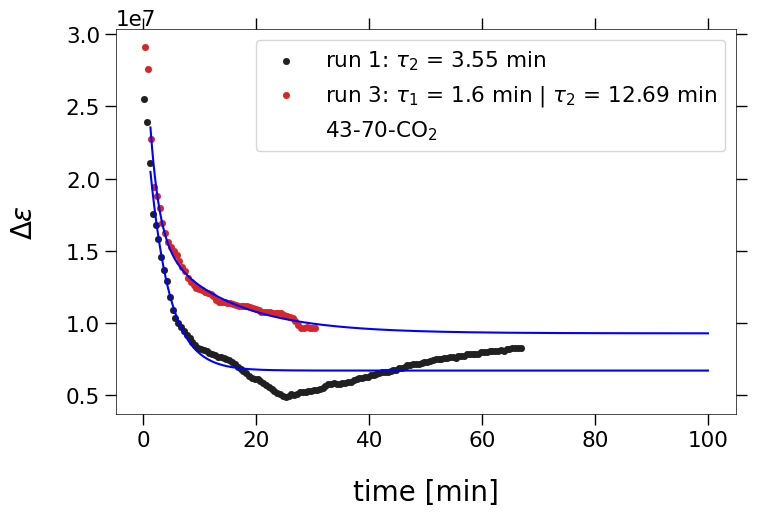

[-13357.0, 18.995, 1298100.0, 24.96, 1542600.0]
[452860.0, 6.2327, 371570.0, 75.922, -53280.0]


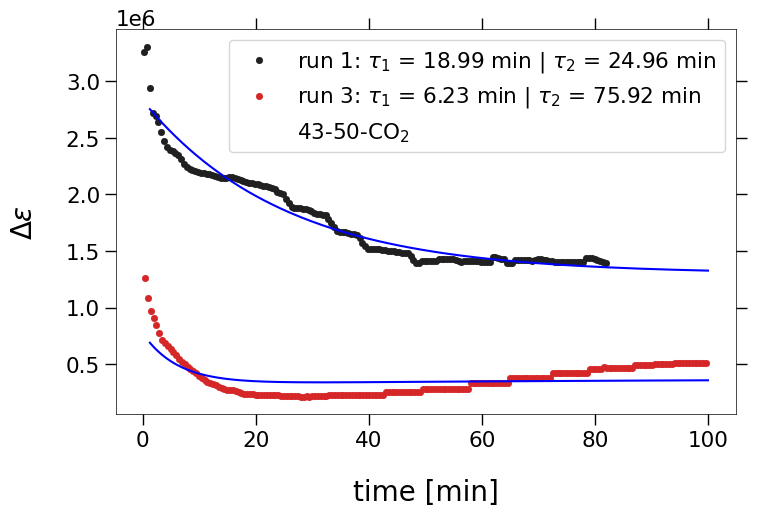

[2181500.0, 13.56, 1276300.0]
[615360.0, 7.0005, 928950.0]


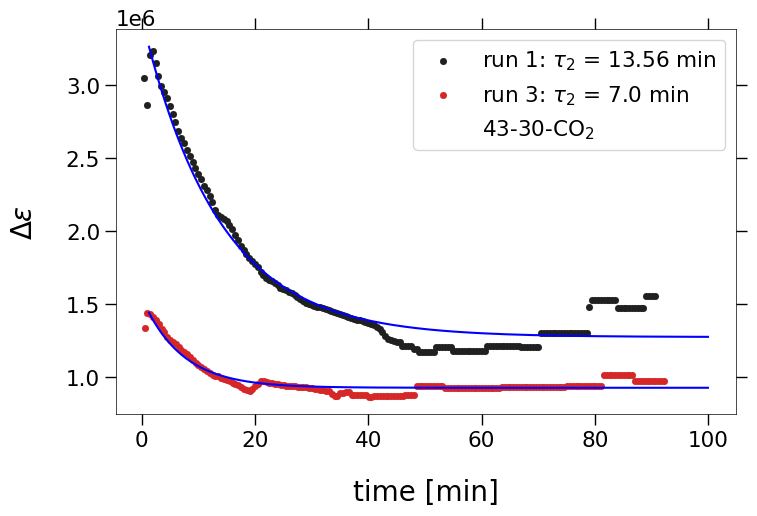

[0.077777, 5.3363, 0.78462, 31.934, -0.079273]
[0.035237, 1.1734, 0.76894]


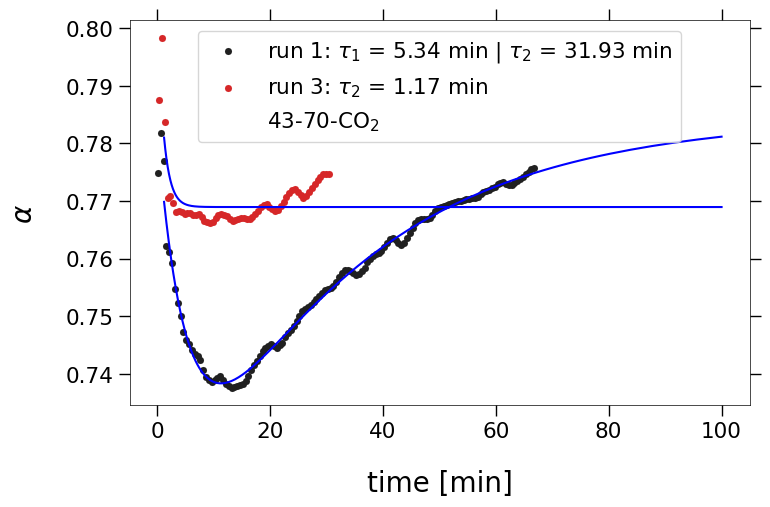

[0.019193, 13.156, 0.7195, 40.435, -0.033558]
[0.34169, 19.344, 0.69971, 36.597, -0.31969]


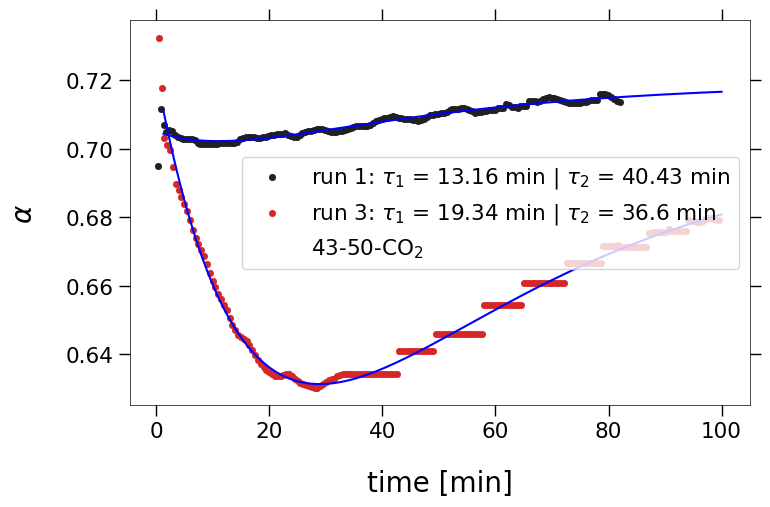

[0.044114, 13.609, 0.72799]
[0.030681, 8.0791, 0.71782]


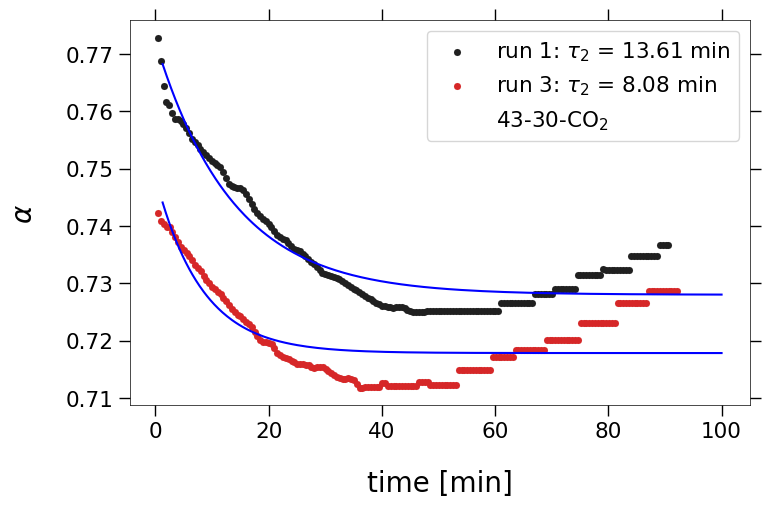

[-0.21331, 9111300.0, 0.21331]
[-0.38536, 25902000.0, 0.38536]


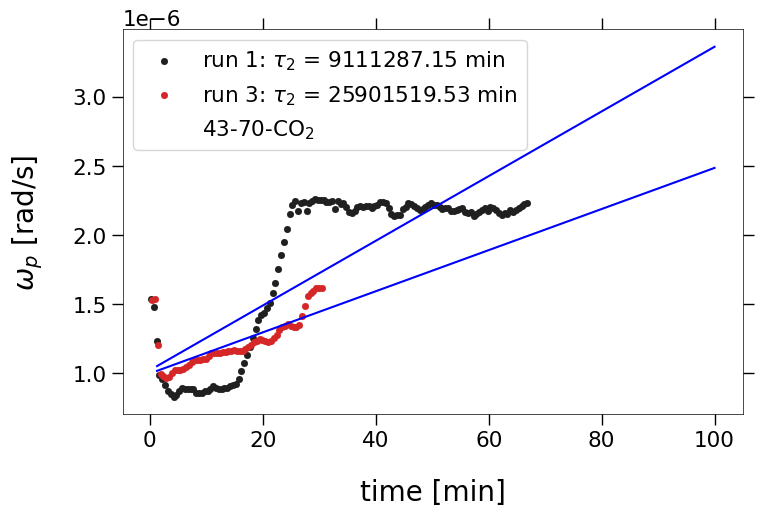

[-0.16317, 4322900.0, 0.16317]
[-0.12271, 28572000.0, 0.12271]


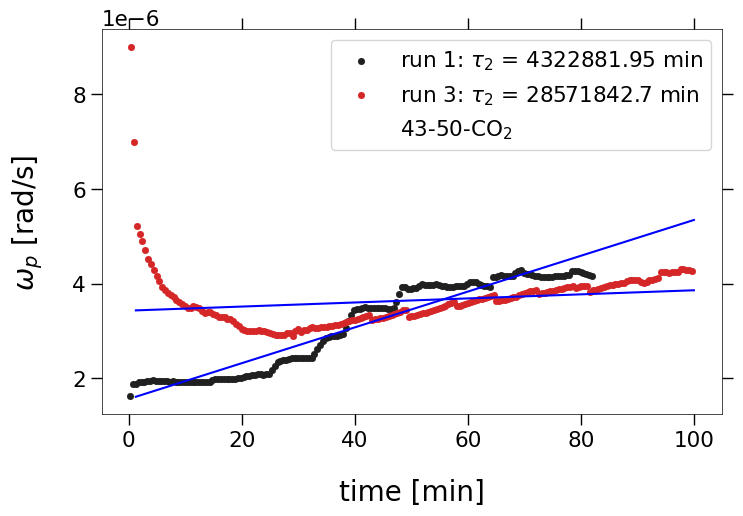

[-0.1417, 12346000.0, 0.14171]
[-0.13841, 4347100.0, 0.13842]


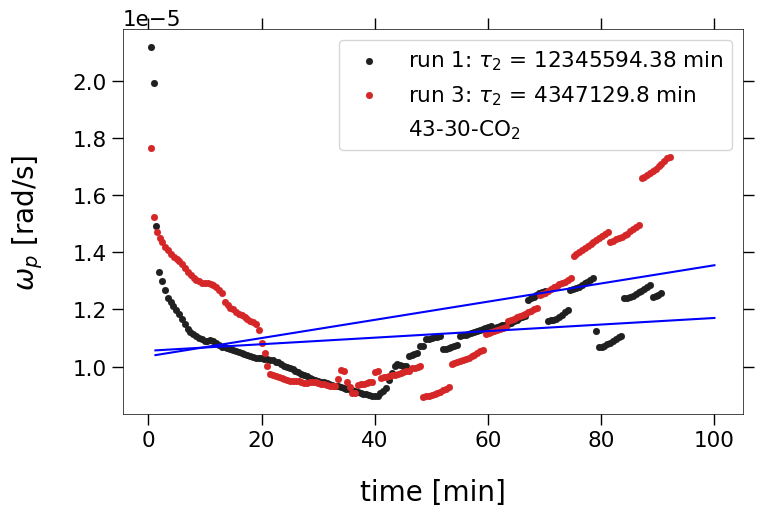

[0.098625, 4.7396, 3.6414, 22.499, -0.20113]
[0.20498, 2.2257, 3.7525]


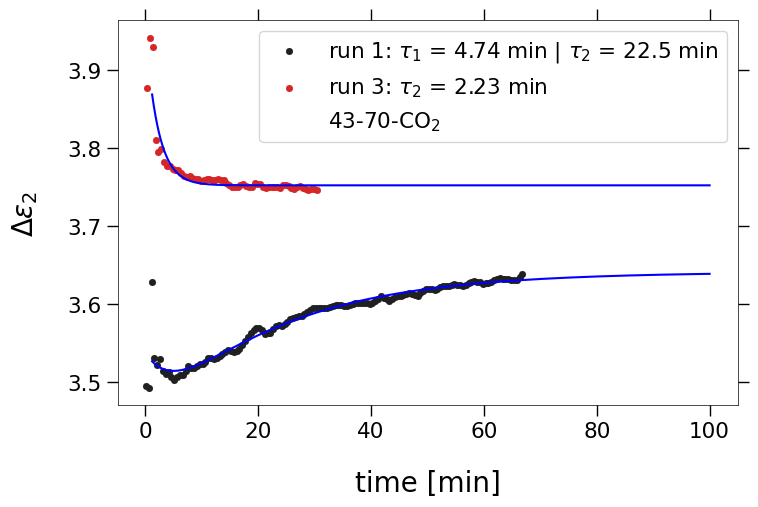

[0.26654, 6.005, 3.5987, 164.29, 0.28255]
[1.082, 7.5583, 3.9218, 123.77, -1.181]


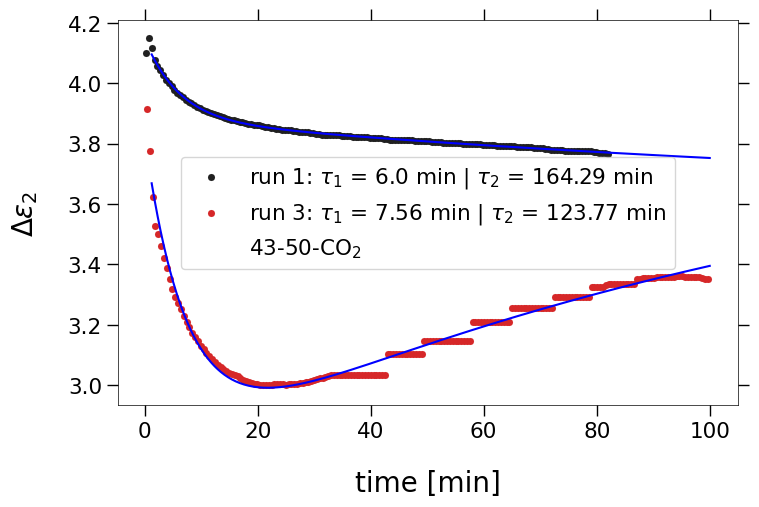

[0.53775, 4.9067, 3.4273]
[3.7443, 0.00027526, 3.3449]


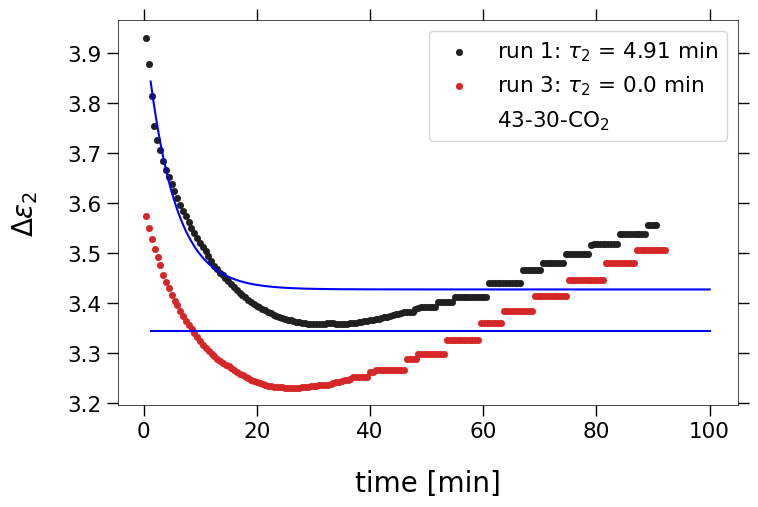

In [8]:
### parameters by temperature in N2

title_text = "Fit parameter evolution / exponential fits for " + SAMPLE_SHORT +"-"

def exp(x, a, b, c) :
    return a * np.exp(-x/b) + c
def exp2(x, a, b, c, d, e) :
    return a * np.exp(-x/b) + c + e * np.exp(-x/d)

# example initial guesses from 20-PEI
p0_2 = [0.8339, 5.2189, 1.2384, 40.091, 0.44262]
p0_1 = [0.61185, 32.341, 1.2989]


look_at = [0, 1, 2, 3]
t_fit = np.logspace(0.1, 2, 200)

for gas in GASES :
    for i in look_at :
        for T_i, temperature in enumerate(TEMPS) :
            temp = str(temperature)

            plt.xscale('linear')
            plt.yscale('linear')

            for j, id in enumerate(ID) :
                if not (id[3] == gas[0] and id[0] == temp[0]) or (id[0]=='3' and id[-1] == '0') :
                    continue
                label0 = "run " + id[-1]
                label_id = SAMPLE_SHORT + '-' + id[:-2]
                t, p = DT_ALL[j][:], P_ALL[j][i][:]
                plott = (t<100)
                t, p = t[plott], p[plott]


                try :
                    fitf = exp2
                    popt, _ = curve_fit(fitf, t, p, p0=p0_2, bounds=((-i_, 0, 0., 0, -i_), (i_, 20, i_, 2000, i_)))

                    tau1 = np.round(popt[1],2)
                    tau2 = np.round(popt[3],2)
                    label = label0 + f': $\\tau_1$ = {tau1} min | $\\tau_2$ = {tau2} min'

                    if tau2 > 500 :
                        fitf = exp
                        popt, _ = curve_fit(fitf, t, p, p0=p0_1, bounds=((-i_, 0, 0.), (i_, i_, i_)))
                        tau2 = np.round(popt[1],2)
                        label = label0 + f': $\\tau_2$ = {tau2} min'


                    print([round_sig(pi, 5) for pi in popt])
                    plt.plot(t_fit, fitf(t_fit, *popt), color="b")

                    #y1 = fitf(t_fit, 0, *popt[1:])
                    #y2 = fitf(t_fit, *popt[:-1], 0)
                    #plt.plot(t_fit, y1, color='yellow', ls=":")
                    #plt.plot(t_fit, y2, color='green', ls=":")

                except Exception as err :
                    print(str(type(err))[8:-2], ": ", err)

                plt.scatter(t, p, label=label, linewidth=0.1)

            
            plt.plot([],[],color='white',label=label_id)
            plt.xlabel("time [min]")
            plt.ylabel(p_labels[i])
            plt.legend()
            #plt.savefig(results_folder + "/area/"+label_id+".pdf", bbox_inches='tight')
            plt.show()

[-3.5155, 4.4768, 108.94, 30.242, -39.109]
[8.2129, 1.2305, 107.7, 28.922, -78.404]


/tmp/ipykernel_114575/2374230327.py:67: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels([int(np.log10(tick)) if tick > 0 else '' for tick in ax.get_xticks()])


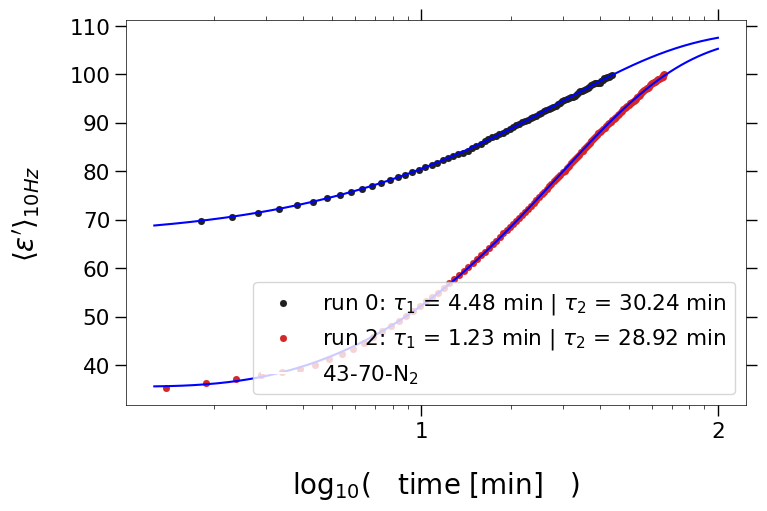

[245.65, 20.0, 82.133, 23.204, -297.45]
[75.651, 20.0, 59.691, 42.695, -105.26]


/tmp/ipykernel_114575/2374230327.py:67: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels([int(np.log10(tick)) if tick > 0 else '' for tick in ax.get_xticks()])


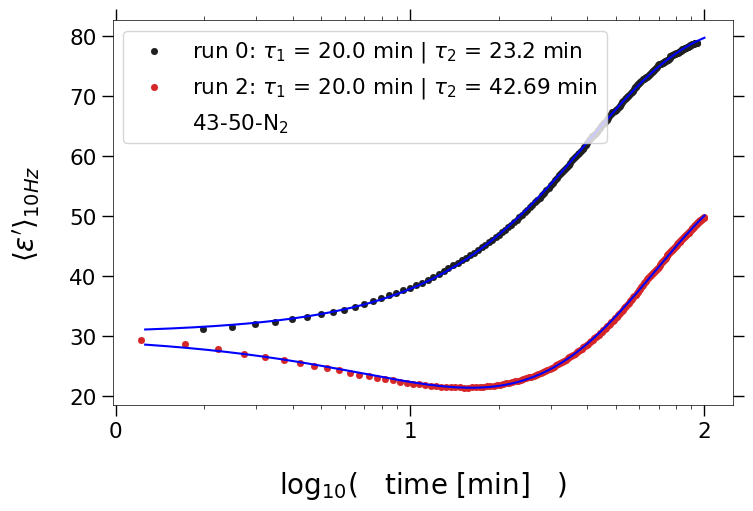

/tmp/ipykernel_114575/2374230327.py:67: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels([int(np.log10(tick)) if tick > 0 else '' for tick in ax.get_xticks()])


[28.291, 14.992, 95.807, 230.3, -77.716]


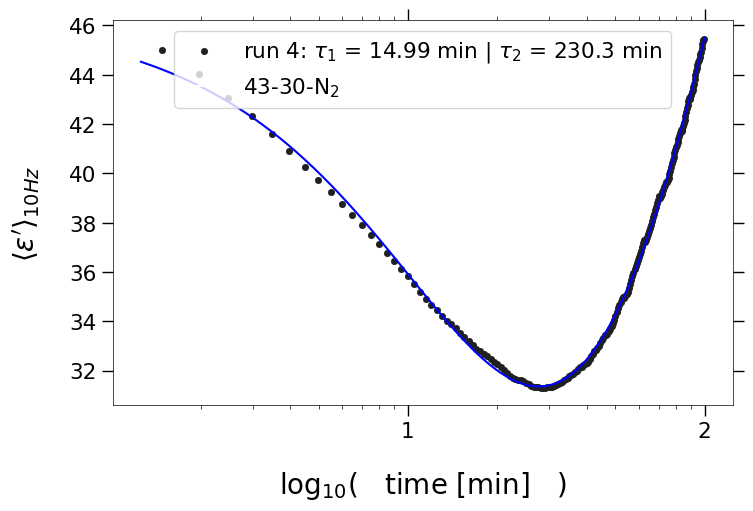

[28.884, 4.4679, 37.108, 16.957, -6.1411]
[11.694, 1.6683, 34.292, 8.2117, 13.453]


/tmp/ipykernel_114575/2374230327.py:67: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels([int(np.log10(tick)) if tick > 0 else '' for tick in ax.get_xticks()])


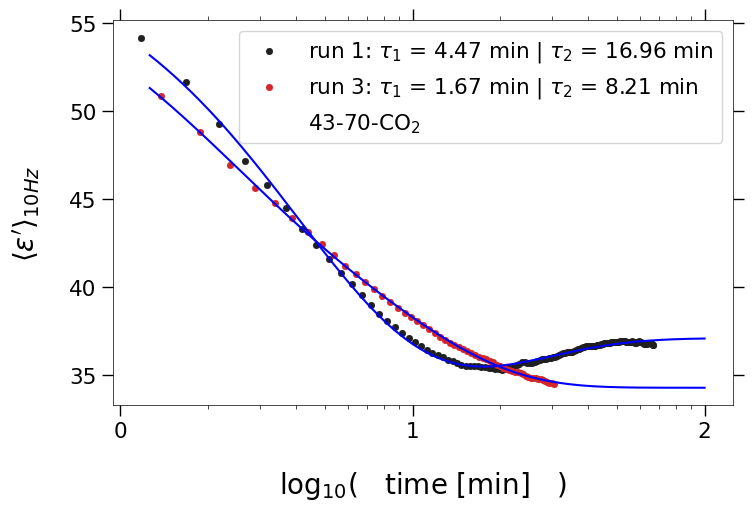

[8.2072, 5.4039, 31.764, 47.704, 4.035]
[21.531, 10.327, 26.486, 56.937, -15.165]


/tmp/ipykernel_114575/2374230327.py:67: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels([int(np.log10(tick)) if tick > 0 else '' for tick in ax.get_xticks()])


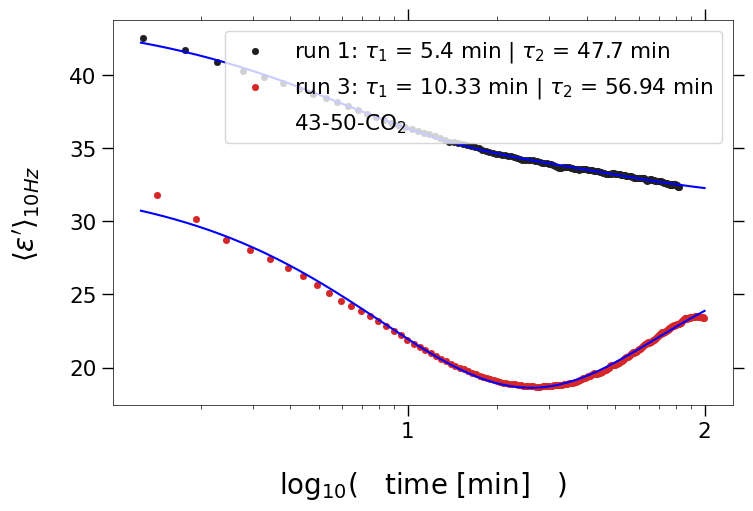

[31.666, 7.1415, 44.238]
[15.148, 4.0487, 39.051]


/tmp/ipykernel_114575/2374230327.py:67: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels([int(np.log10(tick)) if tick > 0 else '' for tick in ax.get_xticks()])


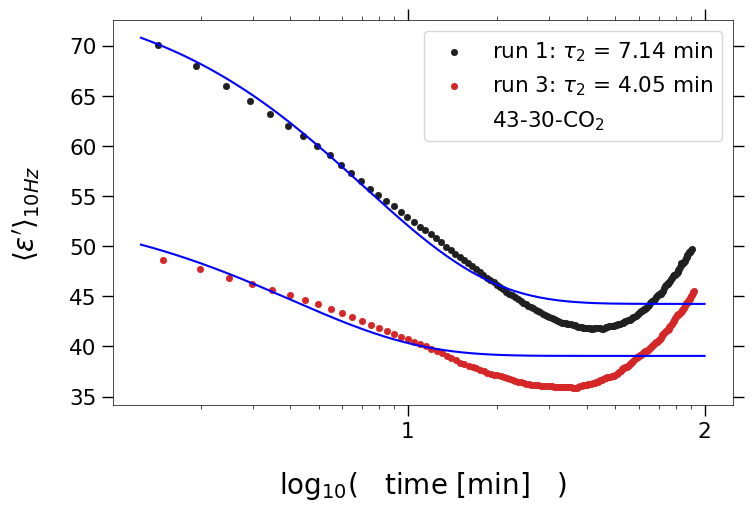

In [9]:
### Plot area

title_text = "Fit area evolution of "

# example initial guesses from PEI-20
p01 = [
    [-3.3728, 0.861, 5.5448, 27.765, -1.6805],
    [-0.94137, 2.764, 2.9277, 32.179, -0.75788],
    [-0.75991, 4.9524, 2.1315, 69.878, -0.4908]]
p02 = [
    [1.2712, 3.2663, 1.4237, 61.509, 0.12305],
    [0.13294, 5.4554, 0.40669, 53.689, 0.06141],
    [0.13294, 5.4554, 0.40669, 53.689, 0.06141]]

t_fit = np.logspace(0.1, 2, 200)

for gas in GASES :
    for T_i, temperature in enumerate(TEMPS) :
        temp = str(temperature)

        plt.xscale('log')
        plt.yscale('linear')

        for j, id in enumerate(ID) :
            if not (id[3] == gas[0] and id[0] == temp[0]) or (id[0]=='3' and id[-1] in ['0', '2']) :
                continue
            label0 = "run " + id[-1]
            label_id = SAMPLE_SHORT + '-' + id[:-2]
            t, a = DT_ALL[j], A_ALL[j]
            fitt = (a < 100) & (t>1) & (t<100)
            t, a = t[fitt], a[fitt]


            if id[3] == "N" :
                p0 = p01[T_i]
            else :
                p0 = p02[T_i]
            try :
                fitf = exp2
                popt, _ = curve_fit(fitf, t, a, p0=p0, bounds=((-i_, 0, 0., 0, -i_), (i_, 20, i_, 2000, i_)))

                tau1 = np.round(popt[1],2)
                tau2 = np.round(popt[3],2)
                label = label0 + f': $\\tau_1$ = {tau1} min | $\\tau_2$ = {tau2} min'

                if tau2 > 500 :
                    fitf = exp
                    popt, _ = curve_fit(fitf, t, a, p0=p0[:3], bounds=((-i_, 0, 0.), (i_, i_, i_)))
                    tau2 = np.round(popt[1],2)
                    label = label0 + f': $\\tau_2$ = {tau2} min'


                print([round_sig(pi, 5) for pi in popt])
                plt.plot(t_fit, fitf(t_fit, *popt), color="b")

                #y1 = fitf(t_fit, 0, *popt[1:])
                #y2 = fitf(t_fit, *popt[:-1], 0)
                #plt.plot(t_fit, y1, color='yellow', ls=":")
                #plt.plot(t_fit, y2, color='green', ls=":")

            except Exception as err :
                print(str(type(err))[8:-2], ": ", err)

            plt.scatter(t, a, label=label, linewidth=0.1)

        ax = plt.gca()
        ax.set_xticklabels([int(np.log10(tick)) if tick > 0 else '' for tick in ax.get_xticks()])
        plt.plot([],[],color='white',label=label_id)
        plt.xlabel("log$_{10}$(   time [min]   )")
        plt.ylabel("$\\langle\\varepsilon'\\rangle_{10Hz}$")
        plt.legend()
        #plt.savefig(results_folder + "/area/"+label_id+".pdf", bbox_inches='tight')
        plt.show()

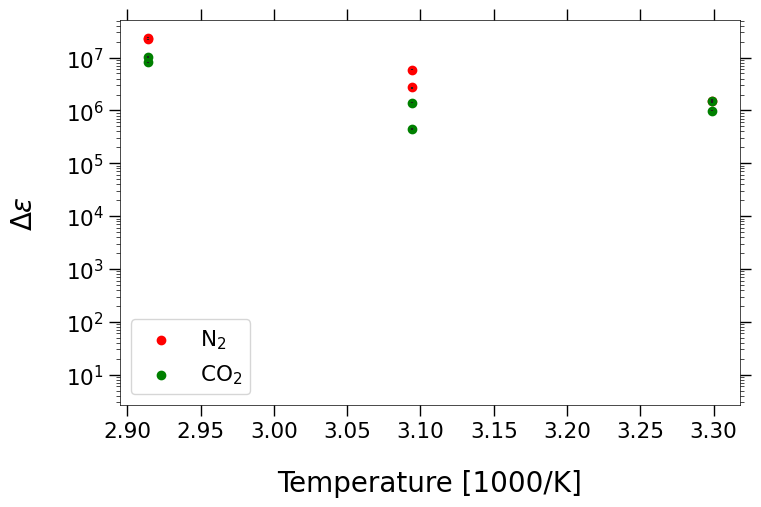

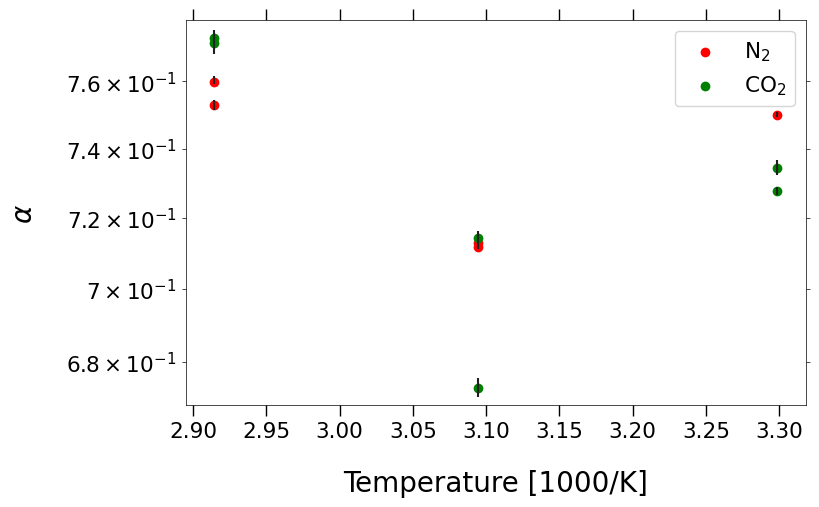

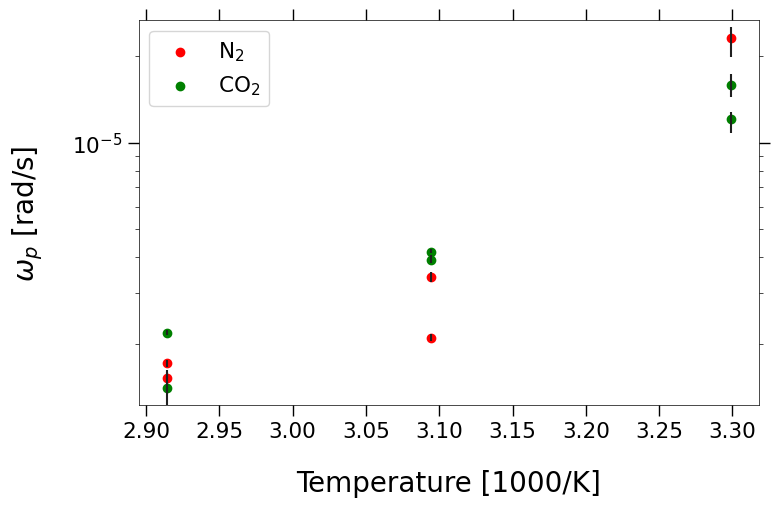

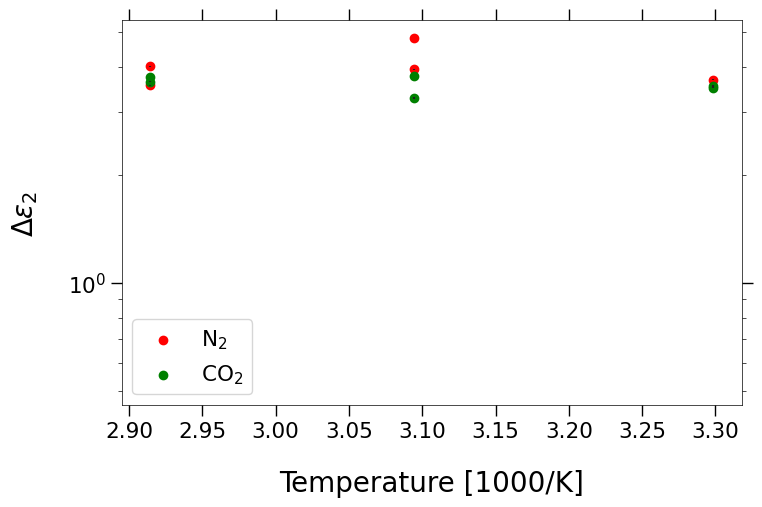

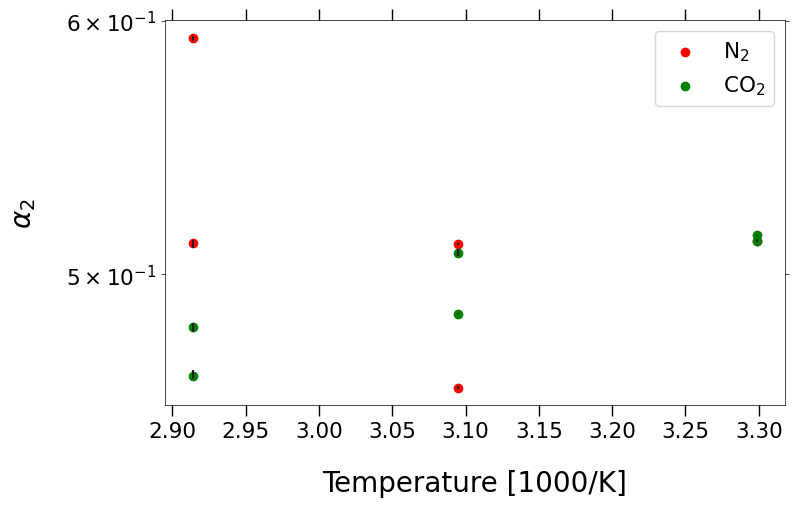

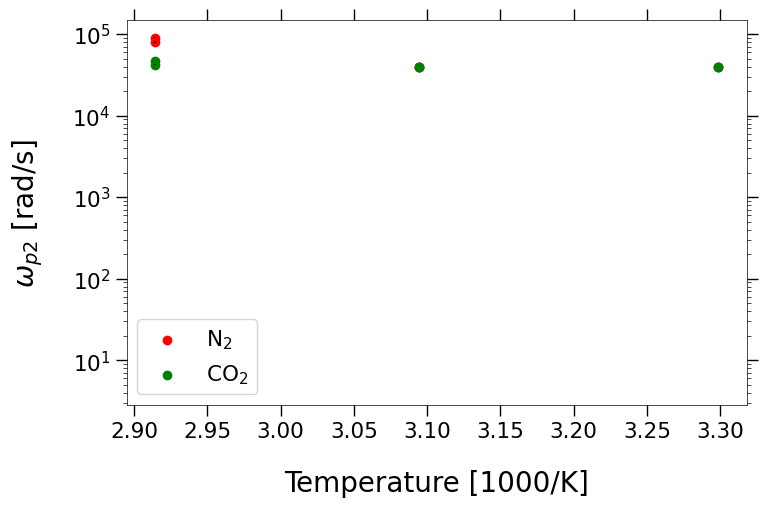

In [10]:
### plot final fit parameters against temperature
title = "Equilibrated fit parameter of " + SAMPLE
colors = ['red', 'green']

for i, p in enumerate(p_labels) :

    plt.yscale('log')

    for g_i, gas in enumerate(GASES) :
        values = []
        for j, id in enumerate(ID) :
            if not id[3] == gas[0] or (id[0]=='3' and id[-1]=='0') :
                continue

            x = P_ALL_[j][i][-20:]
            xa = np.average(x)
            xe1 = xa - np.min(x)
            xe2 = np.max(x) - xa
            xe1 = xe1 * (xe1 > 0)
            xe2 = xe2 * (xe2 > 0)
            values.append(np.array([int(id[:2]), xa, xe1, xe2]))
        v = np.swapaxes(values, 0, 1)

        T = 1000/(v[0]+273.15)
        plt.scatter(T, v[1], linewidths=2, label=gas, color=colors[g_i])
        plt.errorbar(T, v[1], yerr=v[2:], fmt='none')
        plt.xlabel("Temperature [1000/K]")#"$1/(\\epsilon_0 k_B T)$")

    #plt.title(title)
    plt.ylabel(p)
    plt.legend()
    #plt.savefig(results_folder + "/endval/"+p_file_labels[i]+".pdf", bbox_inches='tight')
    plt.show()
